In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.api as sm
import scipy.stats as sp

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings('ignore')

import os
import scipy as sp
from scipy.stats import gaussian_kde
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv(r"C:\Users\HP\Downloads\Team 6.csv")
data.head()

,id\t,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11
0,1,360000,3032,4,4,1,2,0,1972,2,1,22221,0
1,2,340000,2058,4,2,1,2,0,1976,2,1,22912,0
2,3,250000,1780,4,3,1,2,0,1980,2,1,21345,0
3,4,205500,1638,4,2,1,2,0,1963,2,1,17342,0
4,5,275500,2196,4,3,1,2,0,1968,2,7,21786,0


# BASIC INFORMATION ABOUT DATA

In [4]:
data.drop(columns = 'id\t' , inplace = True)

In [5]:
data.nunique()

y      337
x1     415
x2       8
x3       8
x4       2
x5       7
x6       2
x7      74
x8       3
x9      10
x10    515
x11      2
dtype: int64

In [6]:
data.columns

Index(['y', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11'],
      dtype='object')

In [7]:
data.shape

(522, 12)

In [8]:
data.sample(5)

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11
455,210000,1748,3,2,1,2,0,1957,3,1,14512,0
143,675000,3855,4,4,1,3,0,1996,2,7,35845,0
391,120000,1060,2,1,0,2,0,1947,3,1,15001,0
177,415000,2282,5,4,1,2,0,1987,2,3,23003,0
56,104000,1268,2,1,0,1,0,1947,3,1,21067,0


In [9]:
data.isna().sum()   # no missing value

y      0
x1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
dtype: int64

In [10]:
data.corr()

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11
y,1.000000,0.819470,0.413324,0.683685,0.288596,0.577786,0.146612,0.555516,-0.758078,0.357493,0.224169,-0.050968
x1,0.819470,1.000000,0.557838,0.755273,0.267950,0.533766,0.162396,0.441197,-0.695553,0.616842,0.157525,-0.060625
x2,0.413324,0.557838,1.000000,0.583447,0.234651,0.316814,0.134542,0.268692,-0.378322,0.380370,0.126538,-0.028744
x3,0.683685,0.755273,0.583447,1.000000,0.324760,0.489898,0.184153,0.512841,-0.682215,0.492983,0.147007,-0.050928
x4,0.288596,0.267950,0.234651,0.324760,1.000000,0.319281,0.102361,0.425588,-0.413768,0.130594,-0.105305,-0.040814
x5,0.577786,0.533766,0.316814,0.489898,0.319281,1.000000,0.108932,0.461760,-0.547097,0.234848,0.152219,-0.001955
x6,0.146612,0.162396,0.134542,0.184153,0.102361,0.108932,1.000000,0.059829,-0.125303,0.081456,-0.036851,-0.039932
x7,0.555516,0.441197,0.268692,0.512841,0.425588,0.461760,0.059829,1.000000,-0.617526,0.234059,-0.100452,0.025777
x8,-0.758078,-0.695553,-0.378322,-0.682215,-0.413768,-0.547097,-0.125303,-0.617526,1.000000,-0.348077,-0.116057,0.020336
x9,0.357493,0.616842,0.380370,0.492983,0.130594,0.234848,0.081456,0.234059,-0.348077,1.000000,-0.013115,-0.118740


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522 entries, 0 to 521
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   y       522 non-null    int64
 1   x1      522 non-null    int64
 2   x2      522 non-null    int64
 3   x3      522 non-null    int64
 4   x4      522 non-null    int64
 5   x5      522 non-null    int64
 6   x6      522 non-null    int64
 7   x7      522 non-null    int64
 8   x8      522 non-null    int64
 9   x9      522 non-null    int64
 10  x10     522 non-null    int64
 11  x11     522 non-null    int64
dtypes: int64(12)
memory usage: 49.1 KB


In [12]:
data.duplicated().sum()

0

In [13]:
data.corr()['y']

y      1.000000
x1     0.819470
x2     0.413324
x3     0.683685
x4     0.288596
x5     0.577786
x6     0.146612
x7     0.555516
x8    -0.758078
x9     0.357493
x10    0.224169
x11   -0.050968
Name: y, dtype: float64

In [14]:
data.describe()

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11
count,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000
mean,277894.147510,2260.626437,3.471264,2.641762,0.831418,2.099617,0.068966,1966.904215,2.183908,3.344828,24369.704981,0.021073
std,137923.397269,711.065933,1.014358,1.064169,0.374742,0.653970,0.253639,17.637924,0.641413,2.562812,11684.075549,0.143765
min,84000.000000,980.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1885.000000,1.000000,1.000000,4560.000000,0.000000
25%,180000.000000,1701.250000,3.000000,2.000000,1.000000,2.000000,0.000000,1956.000000,2.000000,1.000000,17204.750000,0.000000
50%,229900.000000,2061.000000,3.000000,3.000000,1.000000,2.000000,0.000000,1966.000000,2.000000,2.000000,22200.000000,0.000000
75%,335000.000000,2636.250000,4.000000,3.000000,1.000000,2.000000,0.000000,1981.000000,3.000000,7.000000,26786.750000,0.000000
max,920000.000000,5032.000000,7.000000,7.000000,1.000000,7.000000,1.000000,1998.000000,3.000000,11.000000,86830.000000,1.000000


# ~~~~~~~~~~~UNIVARIATE ANALYSIS~~~~~~~~~~~~~~~~~~~~~~~~

# Variable X2

In [15]:
# This is categorical variable with 4 unique values 
## Converting this column into categorical
data["x2"]=pd.Categorical(data.x2)

In [16]:
data["x2"].dtypes

CategoricalDtype(categories=[0, 1, 2, 3, 4, 5, 6, 7], ordered=False)

In [17]:
data['x2'].value_counts()

3    202
4    179
2     64
5     52
6     12
1      9
7      3
0      1
Name: x2, dtype: int64

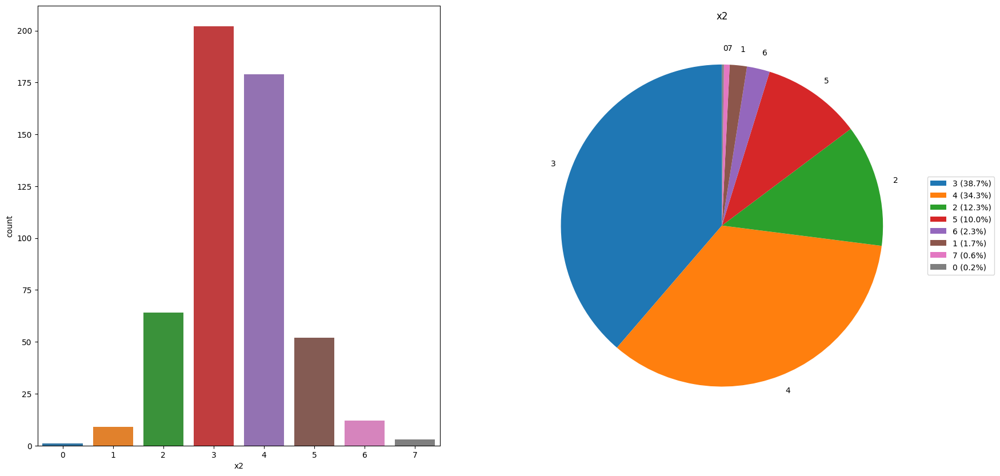

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x2')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x2'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x2')

plt.show()

# X3

In [19]:
# This is categorical variable with 4 unique values 
## Converting this column into categorical
data["x3"]=pd.Categorical(data.x3)
data["x3"].dtypes
data['x3'].value_counts()

3    175
2    171
4     84
1     71
5     17
7      2
0      1
6      1
Name: x3, dtype: int64

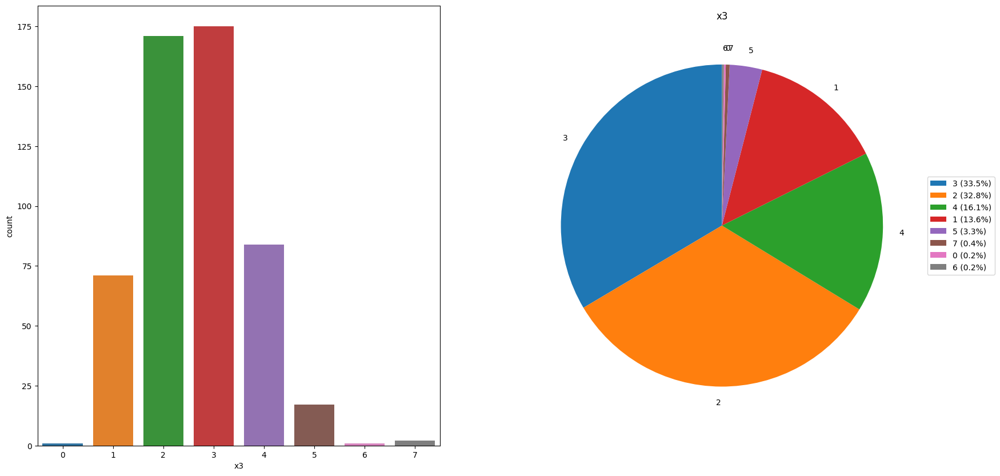

In [20]:
# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x3')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x3'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x3')

plt.show()

# X4

In [21]:
data['x4'].value_counts()

1    434
0     88
Name: x4, dtype: int64

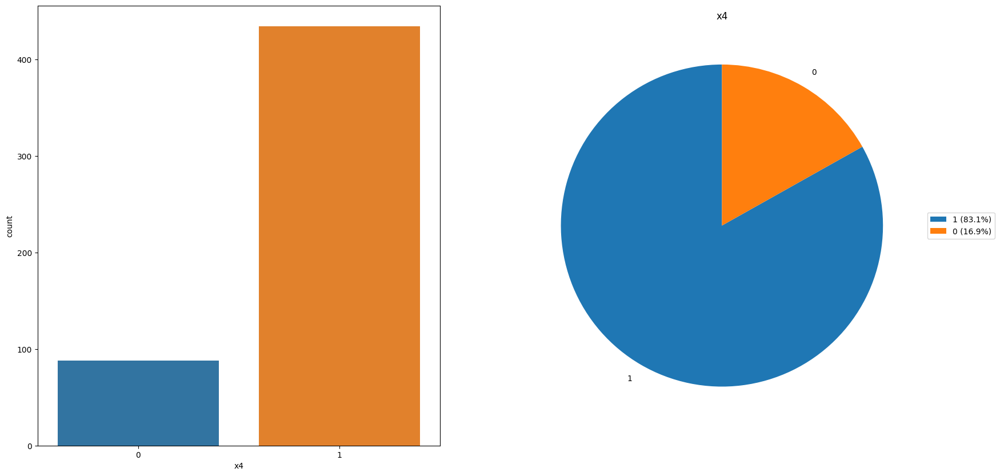

In [22]:
# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x4')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x4'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x4')

plt.show()

# X5

In [23]:
data['x5'].value_counts()

2    353
3    106
1     52
0      7
4      2
5      1
7      1
Name: x5, dtype: int64

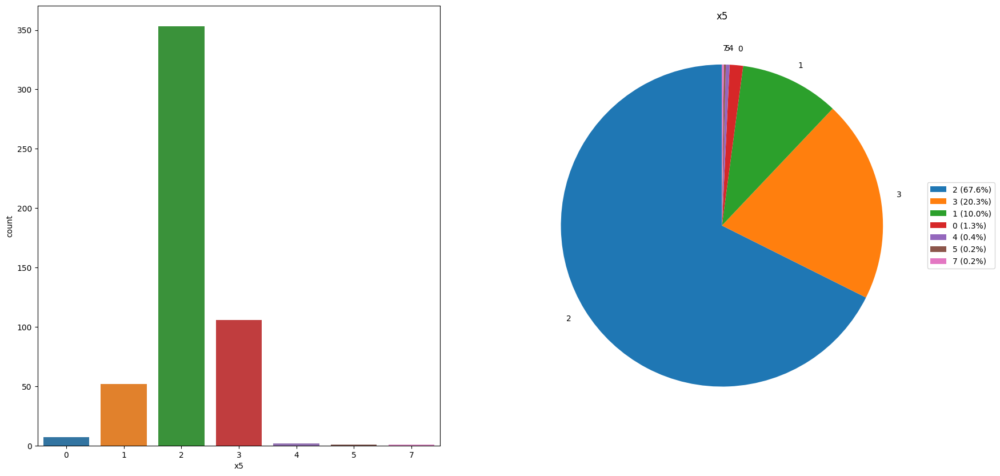

In [24]:
# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x5')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x5'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x5')

plt.show()

# X6

In [25]:
data['x6'].value_counts()

0    486
1     36
Name: x6, dtype: int64

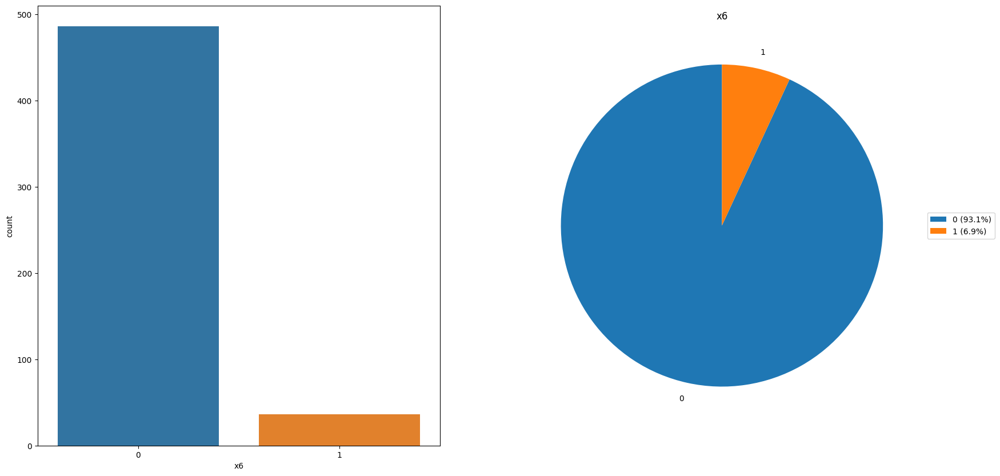

In [26]:
# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x6')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x6'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x6')

plt.show()

# X8

In [27]:
data['x8'].value_counts()

2    290
3    164
1     68
Name: x8, dtype: int64

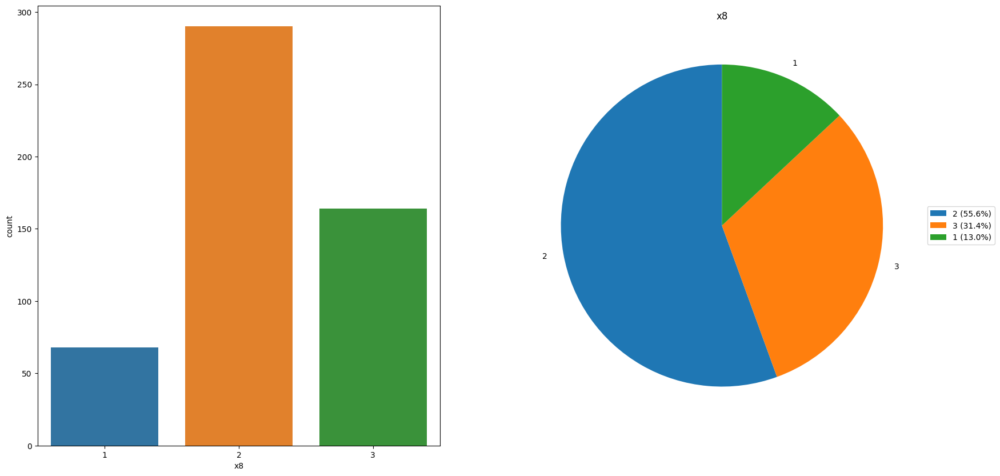

In [29]:
# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x8')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x8'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x8')

plt.show()

# X9

In [30]:
data['x9'].value_counts()

1     214
7     136
3      64
2      58
5      18
6      18
4      11
10      1
9       1
11      1
Name: x9, dtype: int64

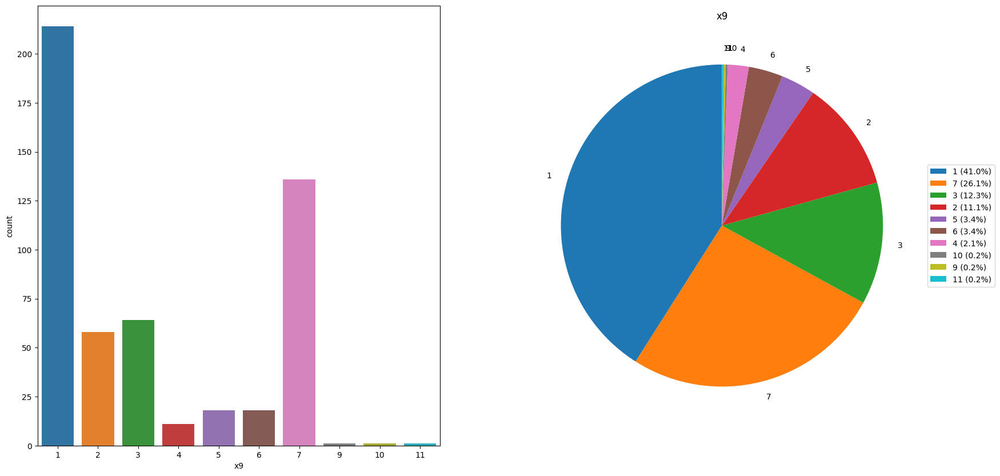

In [31]:
# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x9')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x9'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x9')

plt.show()

# X11

In [32]:
data['x11'].value_counts()

0    511
1     11
Name: x11, dtype: int64

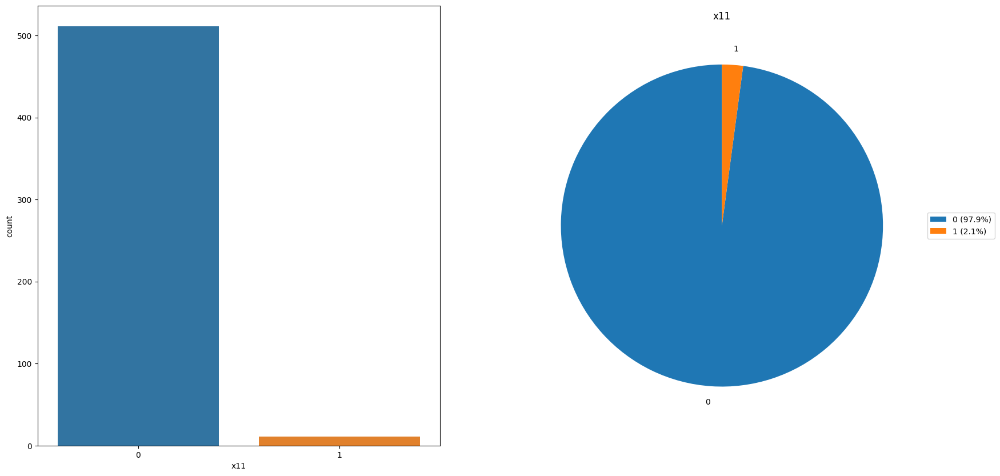

In [33]:
# Set up the figure and font size
plt.figure(figsize=(20, 10))
#plt.rcParams['font.size'] = 20

# Plot the count plot on the left side
plt.subplot(1, 2, 1)
sns.countplot(data=data, x='x11')

# Plot the pie chart on the right side
plt.subplot(1, 2, 2)
value_counts = data['x11'].value_counts()
labels = [str(x) for x in value_counts.index]
plt.pie(value_counts, labels=labels, startangle=90, pctdistance=0.85)

# Add percentage to legend
percentages = [f'{val/sum(value_counts)*100:.1f}%' for val in value_counts]
plt.legend(labels=[f'{label} ({percentage})' for label, percentage in zip(labels, percentages)], loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.title('x11')

plt.show()

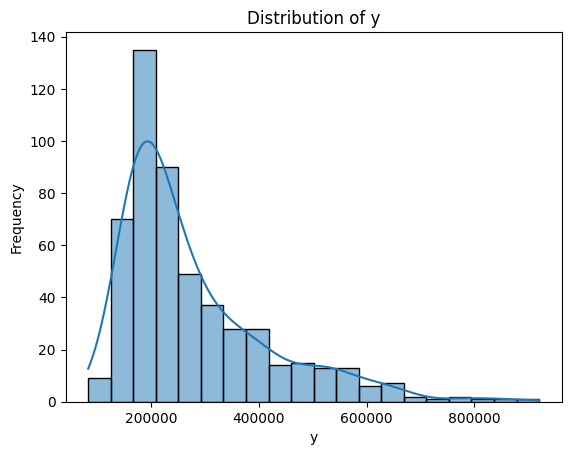

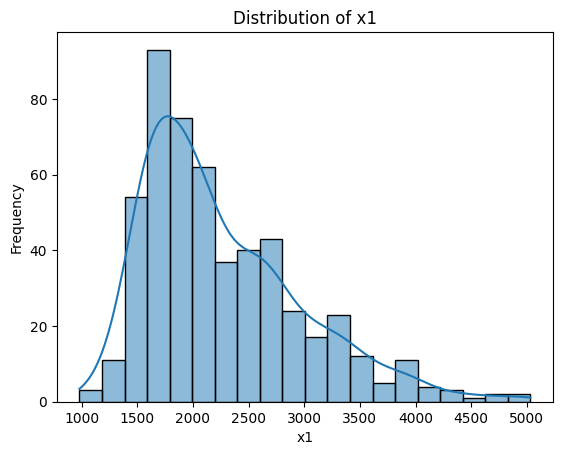

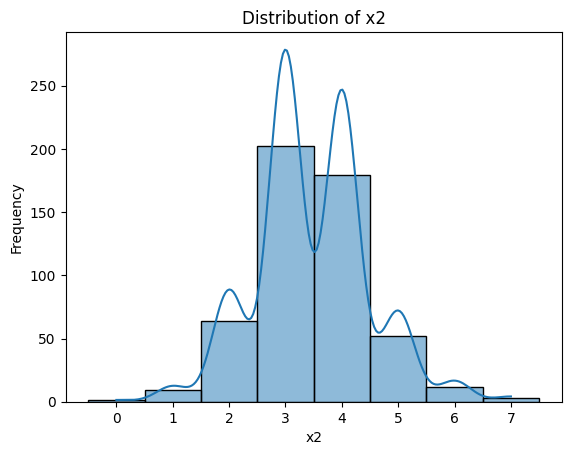

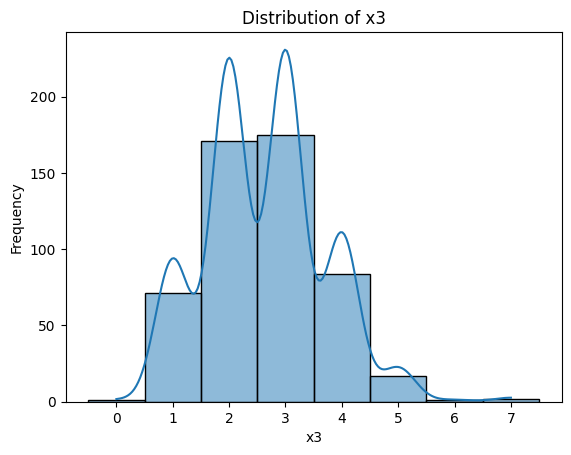

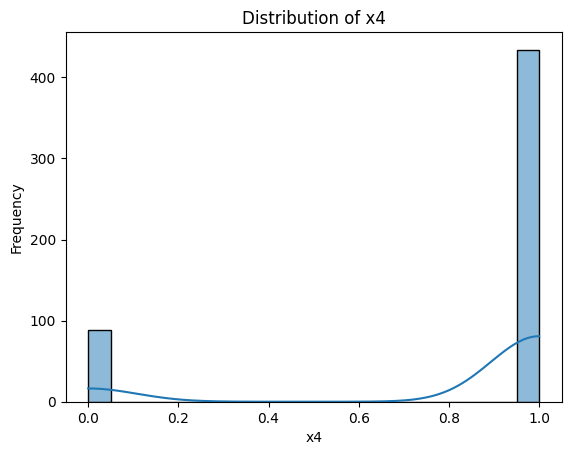

...

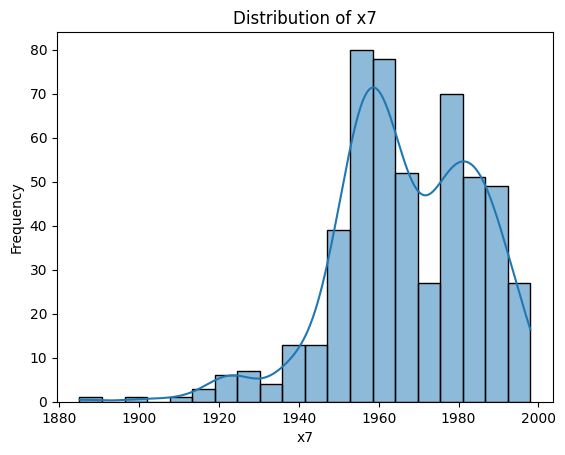

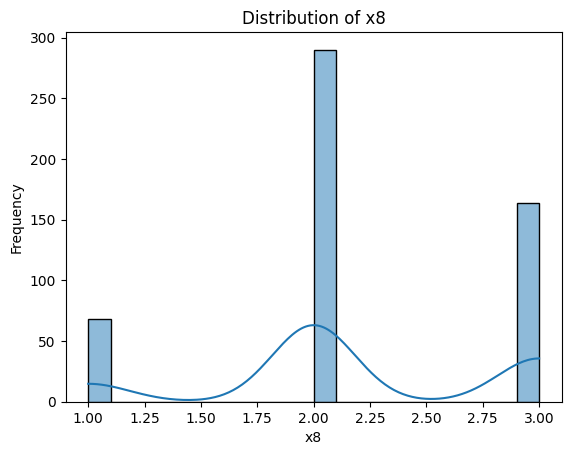

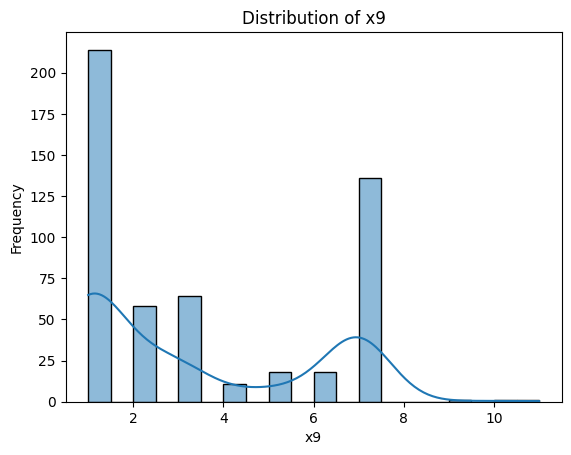

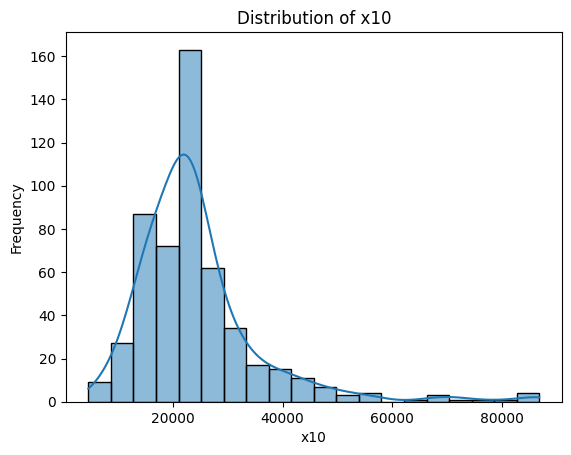

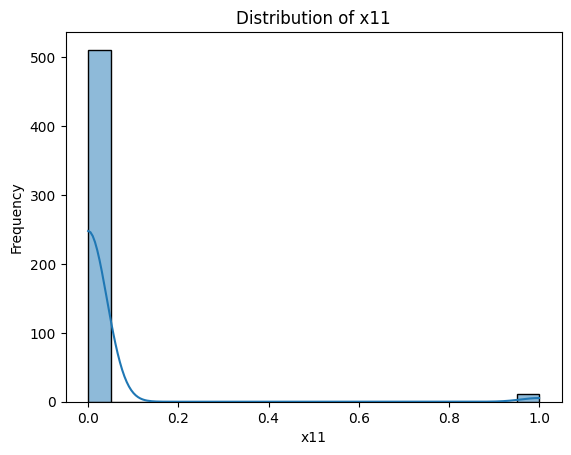

In [34]:
# Extract variables for plotting
variables = list(data.columns)

# Plot the distribution of each variable
for var in variables:

    
    sns.histplot(data[var], kde=True, bins=20 )  # You can adjust the number of bins as needed
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.show()

# X1

<Axes: >

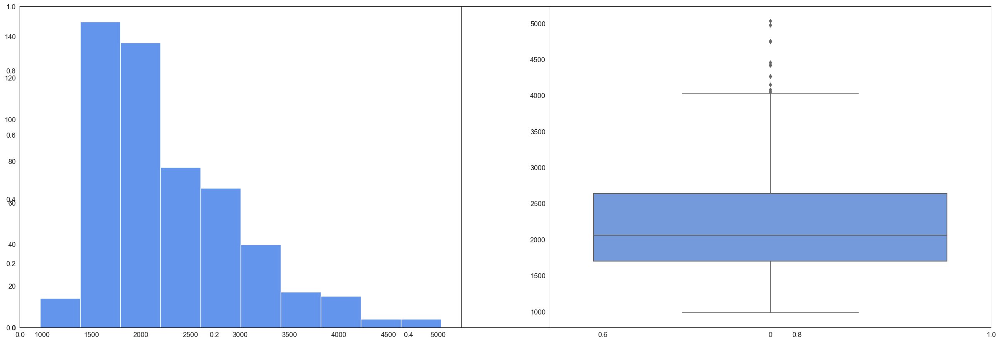

In [508]:
plt.subplots(figsize=(30, 10))
#plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x1'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x1'], color="cornflowerblue")

<Axes: >

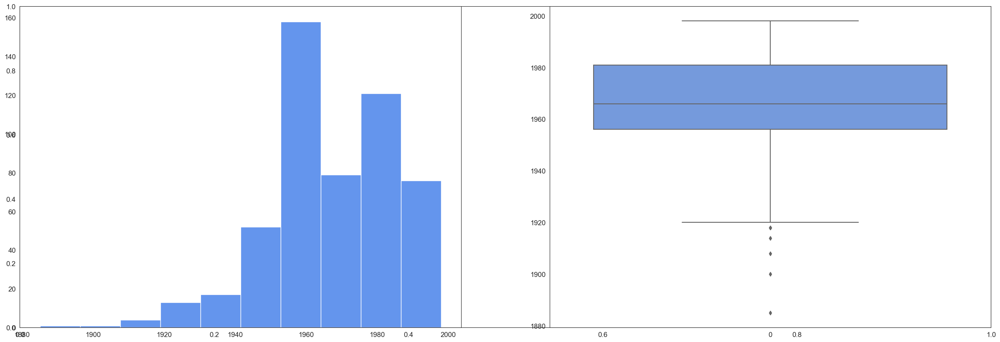

In [509]:
plt.subplots(figsize=(30, 10))
#plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x7'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x7'], color="cornflowerblue")

<Axes: >

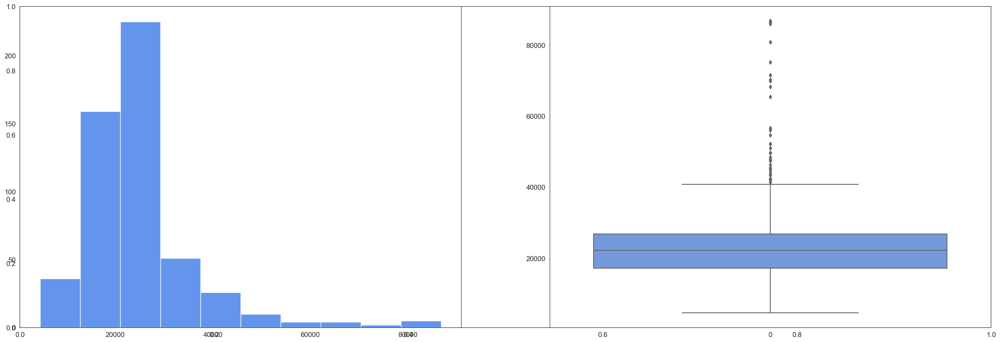

In [510]:
plt.subplots(figsize=(30, 10))
#plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x10'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x10'], color="cornflowerblue")

In [36]:
data

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11
0,360000,3032,4,4,1,2,0,1972,2,1,22221,0
1,340000,2058,4,2,1,2,0,1976,2,1,22912,0
2,250000,1780,4,3,1,2,0,1980,2,1,21345,0
3,205500,1638,4,2,1,2,0,1963,2,1,17342,0
4,275500,2196,4,3,1,2,0,1968,2,7,21786,0
...,...,...,...,...,...,...,...,...,...,...,...,...
517,137000,1655,2,1,0,1,0,1935,3,1,54651,0
518,185000,1944,3,2,1,2,0,1939,3,6,17999,0
519,133500,1922,3,1,0,2,0,1950,3,1,14805,0
520,124000,1480,3,2,1,2,0,1953,3,1,28351,0


# Bivariate Analysis

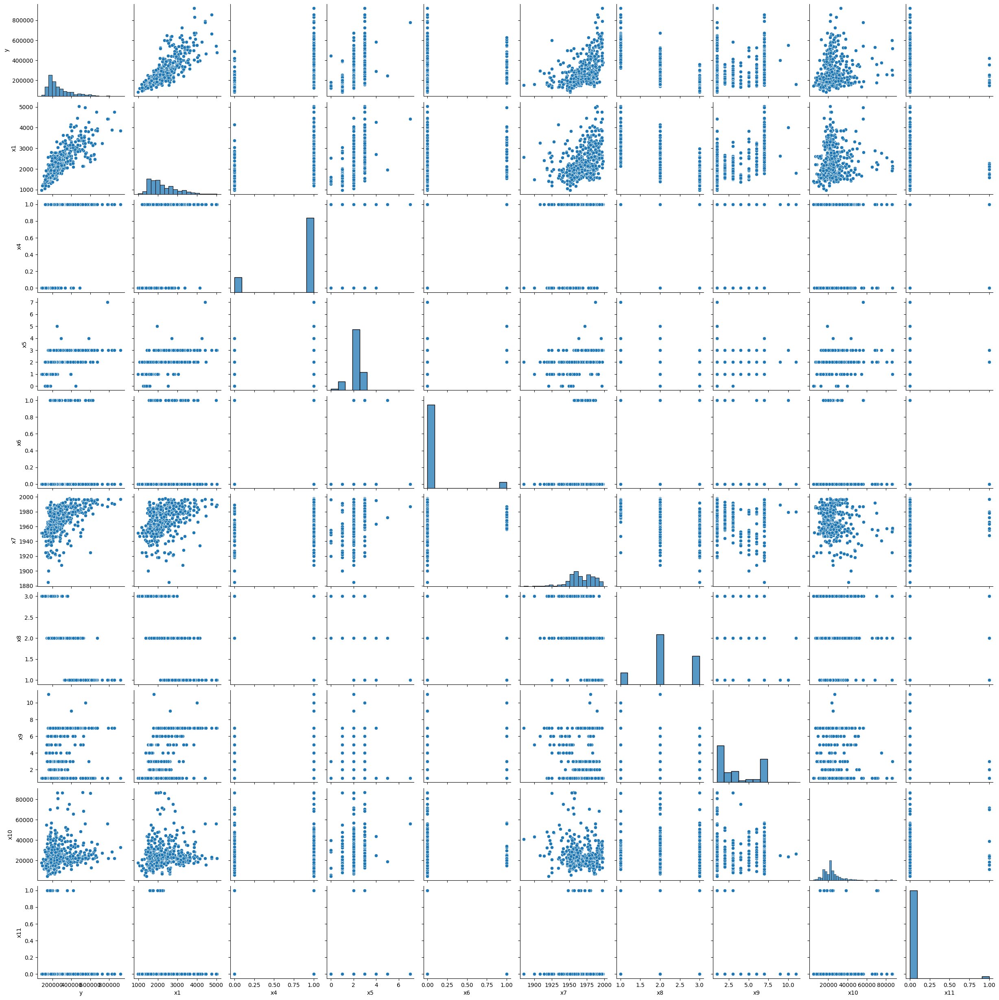

In [37]:
sns.pairplot(data, palette= "cornflowerblue")

In [3]:
data.corr()

,id\t,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11
id\t,1.000000,-0.558370,-0.542801,-0.272643,-0.517318,-0.193965,-0.393762,-0.097683,-0.393448,0.637639,-0.295875,-0.164590,-0.193271
y,-0.558370,1.000000,0.819470,0.413324,0.683685,0.288596,0.577786,0.146612,0.555516,-0.758078,0.357493,0.224169,-0.050968
x1,-0.542801,0.819470,1.000000,0.557838,0.755273,0.267950,0.533766,0.162396,0.441197,-0.695553,0.616842,0.157525,-0.060625
x2,-0.272643,0.413324,0.557838,1.000000,0.583447,0.234651,0.316814,0.134542,0.268692,-0.378322,0.380370,0.126538,-0.028744
x3,-0.517318,0.683685,0.755273,0.583447,1.000000,0.324760,0.489898,0.184153,0.512841,-0.682215,0.492983,0.147007,-0.050928
x4,-0.193965,0.288596,0.267950,0.234651,0.324760,1.000000,0.319281,0.102361,0.425588,-0.413768,0.130594,-0.105305,-0.040814
x5,-0.393762,0.577786,0.533766,0.316814,0.489898,0.319281,1.000000,0.108932,0.461760,-0.547097,0.234848,0.152219,-0.001955
x6,-0.097683,0.146612,0.162396,0.134542,0.184153,0.102361,0.108932,1.000000,0.059829,-0.125303,0.081456,-0.036851,-0.039932
x7,-0.393448,0.555516,0.441197,0.268692,0.512841,0.425588,0.461760,0.059829,1.000000,-0.617526,0.234059,-0.100452,0.025777
x8,0.637639,-0.758078,-0.695553,-0.378322,-0.682215,-0.413768,-0.547097,-0.125303,-0.617526,1.000000,-0.348077,-0.116057,0.020336


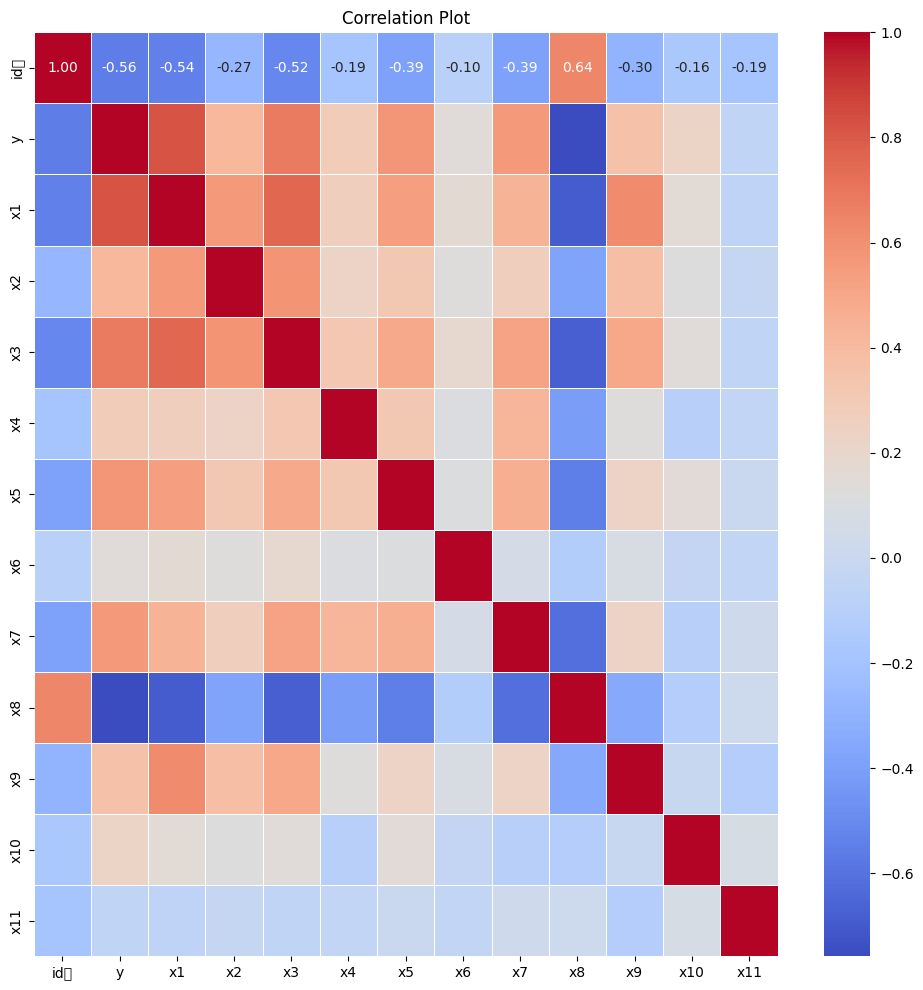

In [4]:
corr_matrix = data.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot')
plt.show()

# Bivariate Analysis of Continuous vs Categorical Variables

<Axes: xlabel='y', ylabel='Density'>

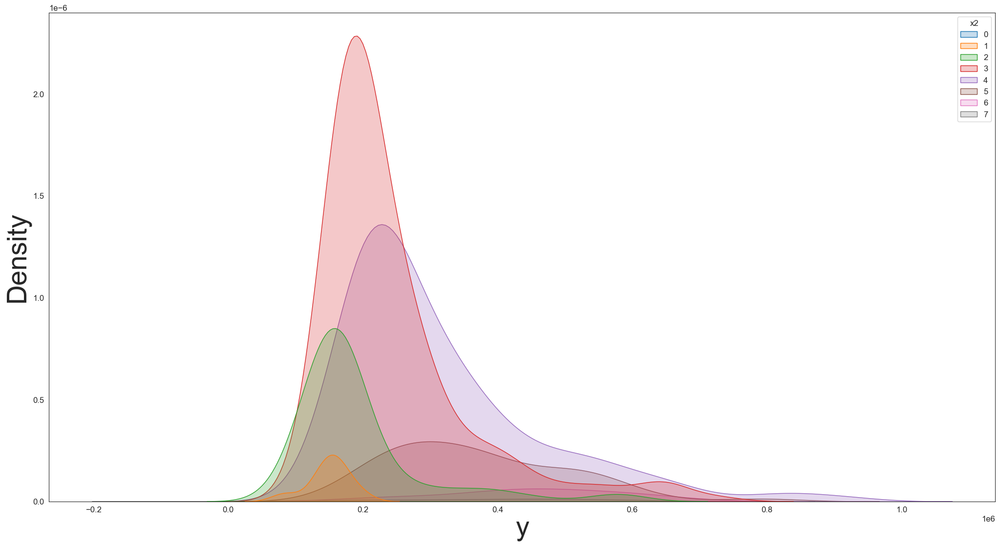

In [513]:
## categorical Density plot of y against x15
fig= plt.subplots( figsize=(25, 13))
sns.kdeplot(data=data,x="y",hue="x2" ,fill=True)

# X1

<Axes: xlabel='x1', ylabel='Density'>

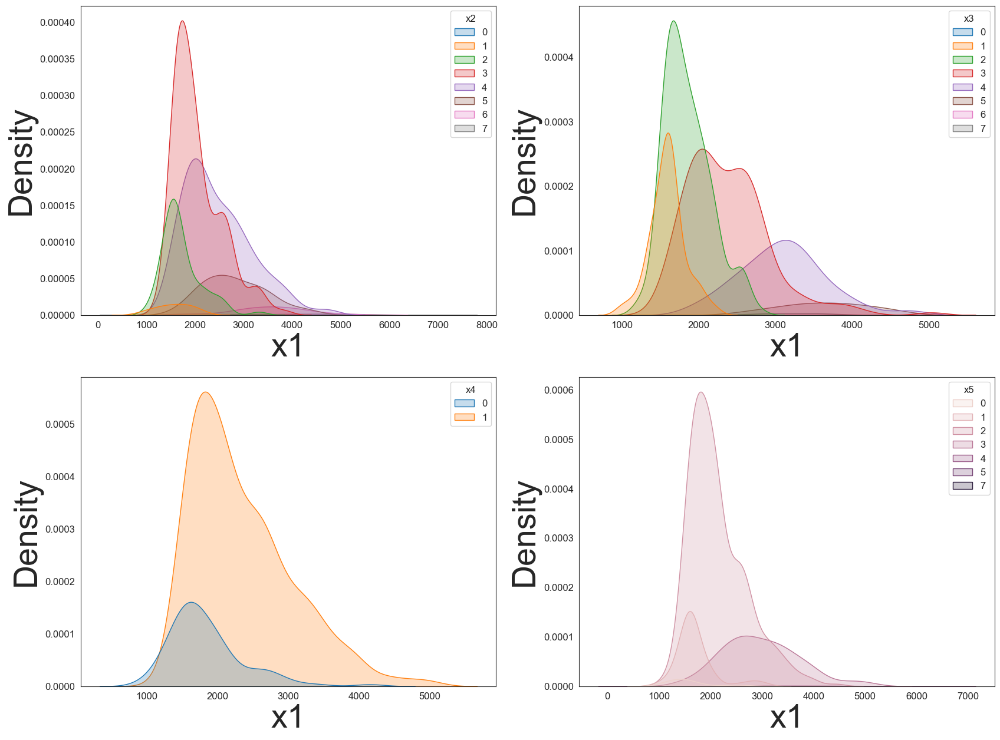

In [514]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x1",hue="x2" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x1",hue="x3" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x1",hue="x4" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x1",hue="x5" ,fill=True,ax=axs[1,1])

<Axes: xlabel='x1', ylabel='Density'>

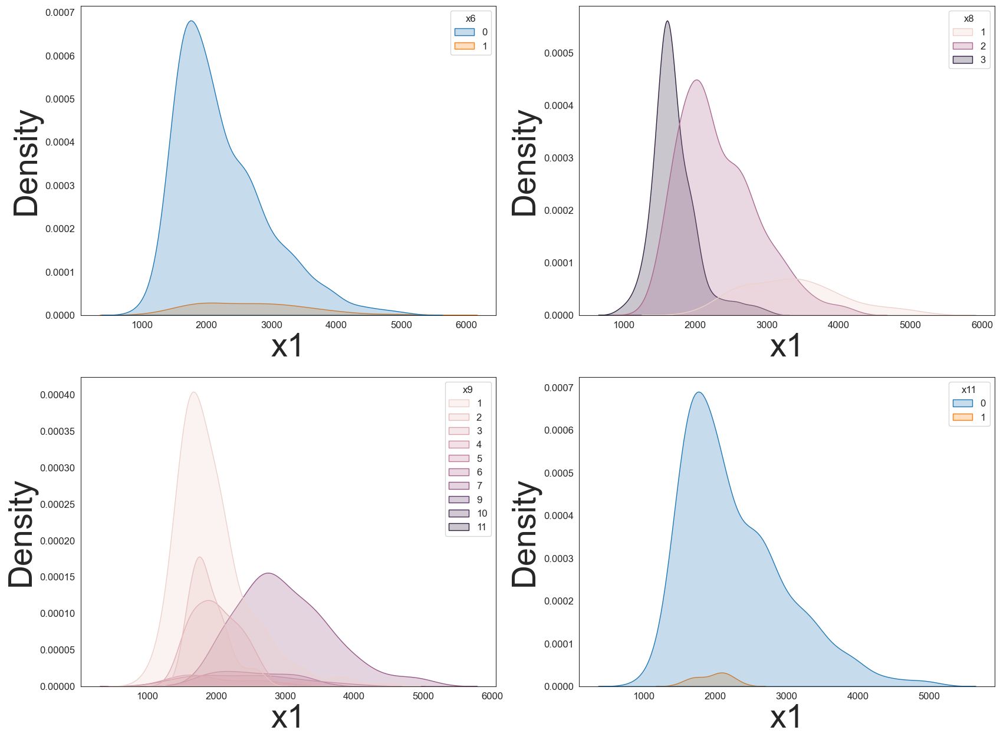

In [515]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x1",hue="x6" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x1",hue="x8" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x1",hue="x9" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x1",hue="x11" ,fill=True,ax=axs[1,1])

# X7

<Axes: xlabel='x7', ylabel='Density'>

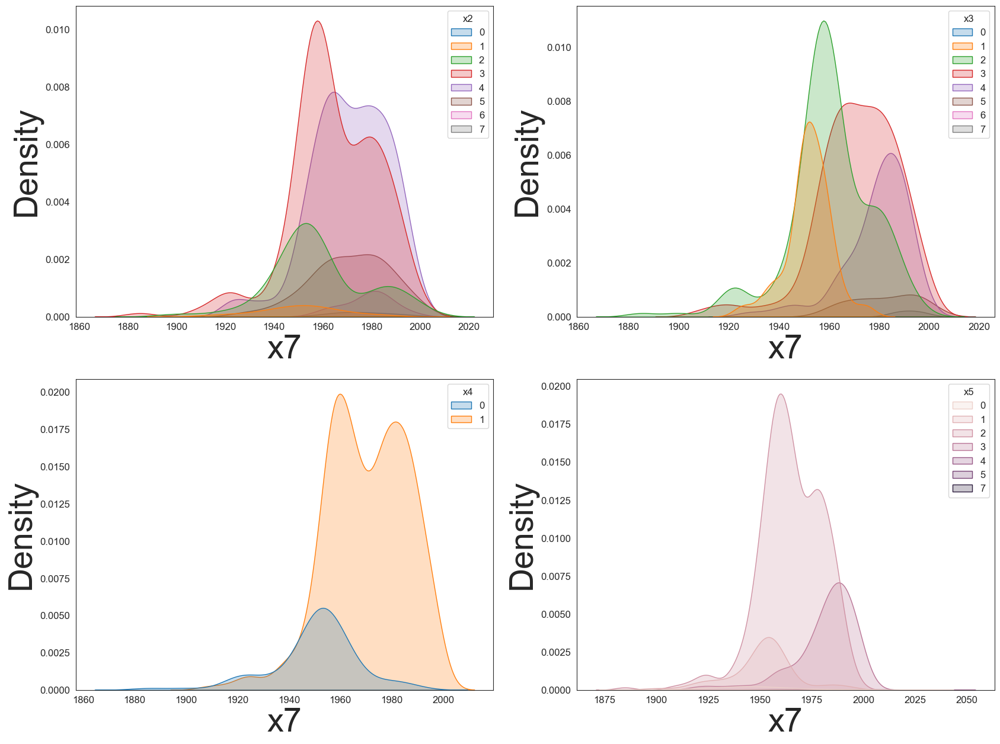

In [516]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x7",hue="x2" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x7",hue="x3" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x7",hue="x4" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x7",hue="x5" ,fill=True,ax=axs[1,1])

<Axes: xlabel='x7', ylabel='Density'>

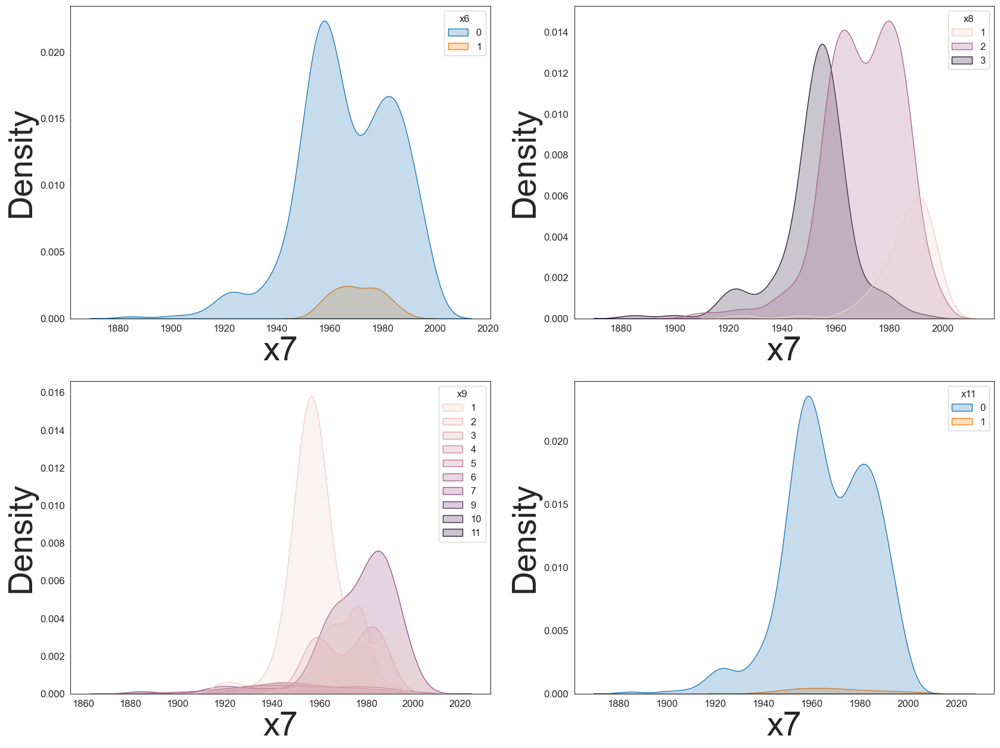

In [517]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x7",hue="x6" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x7",hue="x8" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x7",hue="x9" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x7",hue="x11" ,fill=True,ax=axs[1,1])

# X10

<Axes: xlabel='x10', ylabel='Density'>

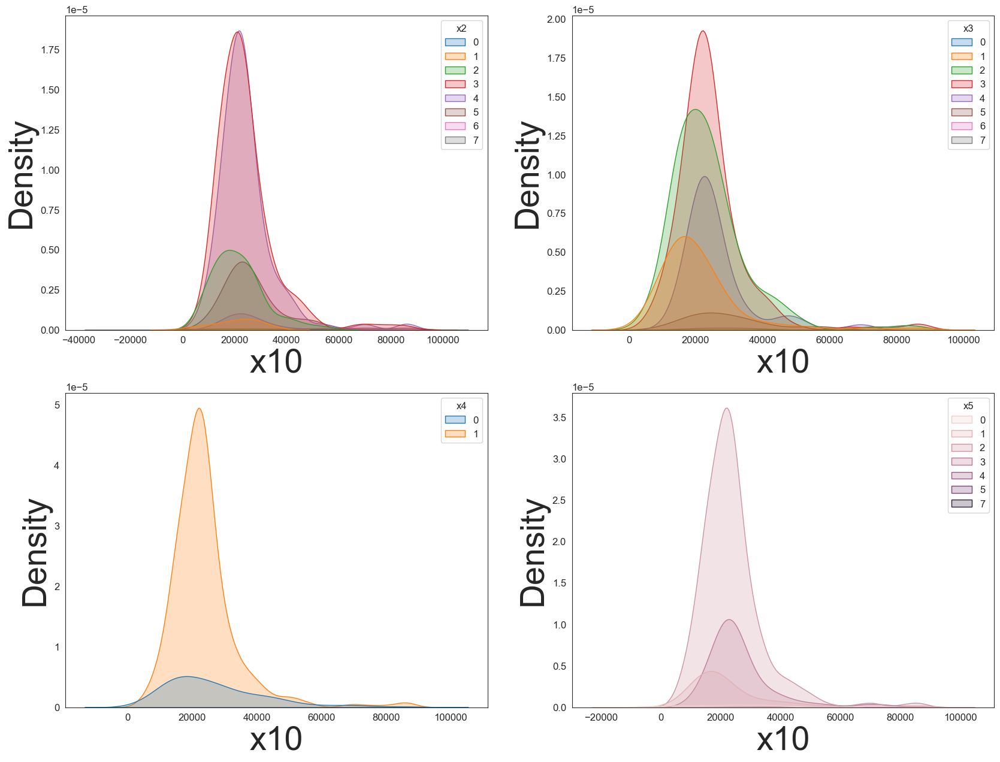

In [518]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x10",hue="x2" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x10",hue="x3" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x10",hue="x4" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x10",hue="x5" ,fill=True,ax=axs[1,1])

<Axes: xlabel='x10', ylabel='Density'>

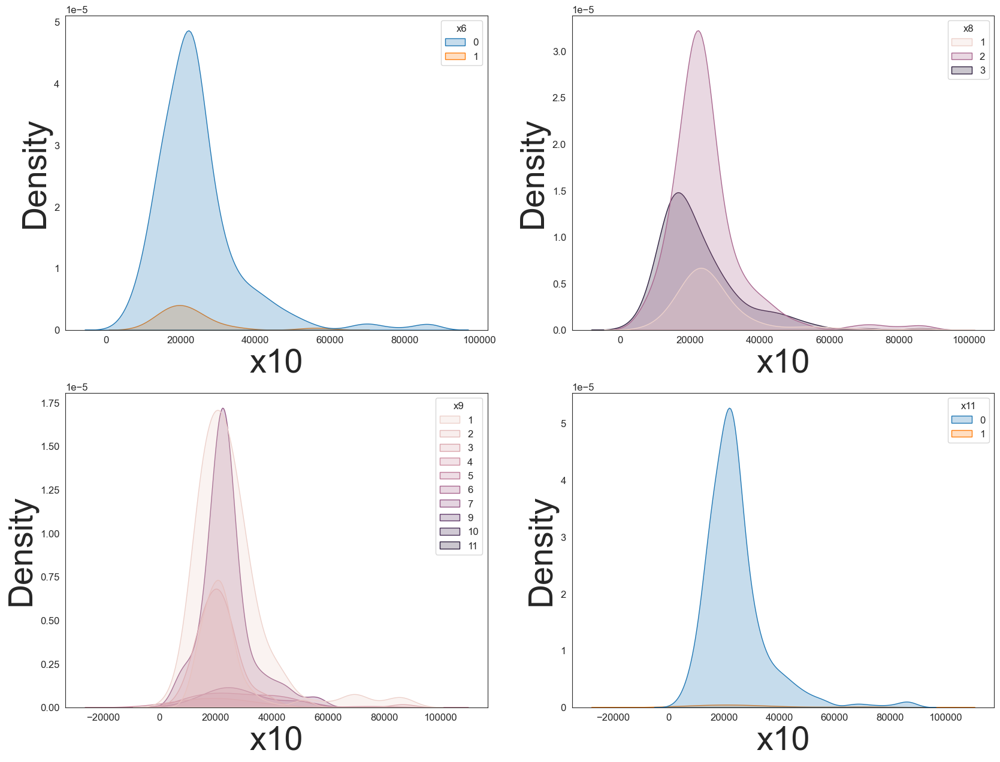

In [519]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x10",hue="x6" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x10",hue="x8" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x10",hue="x9" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x10",hue="x11" ,fill=True,ax=axs[1,1])

# Univariate Regression

# Y VS X1

In [520]:
#fit simple linear regression model
X = data['x1']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.672
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                     1063.
Date:                Sat, 27 Apr 2024   Prob (F-statistic):          8.28e-128
Time:                        00:38:32   Log-Likelihood:                -6627.2
No. Observations:                 522   AIC:                         1.326e+04
Df Residuals:                     520   BIC:                         1.327e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -8.143e+04   1.16e+04     -7.049      0.0

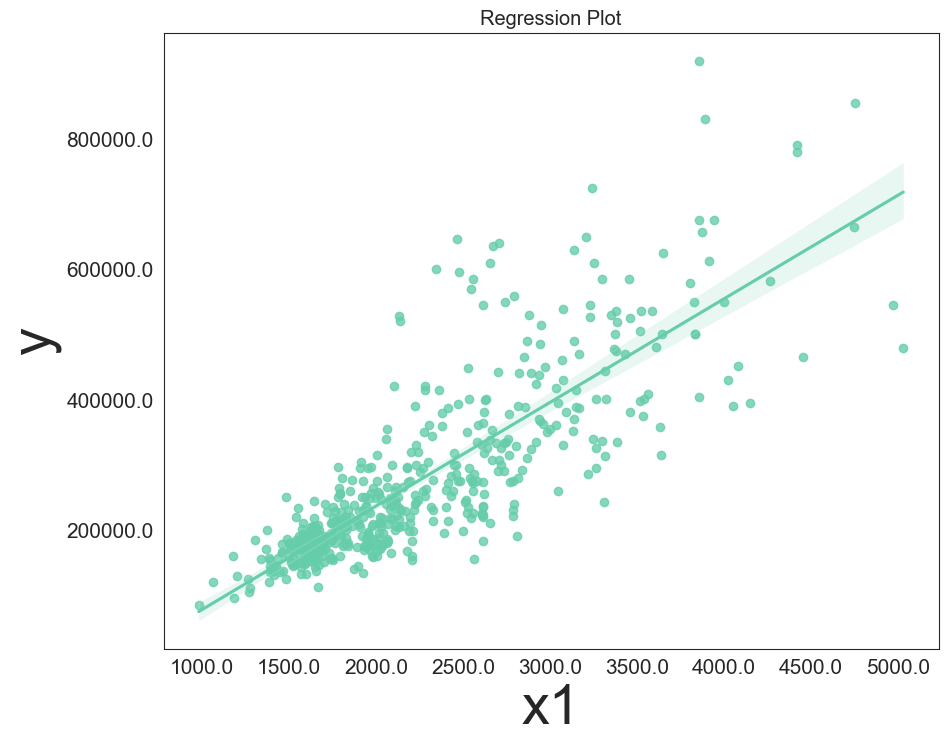

In [521]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x1'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

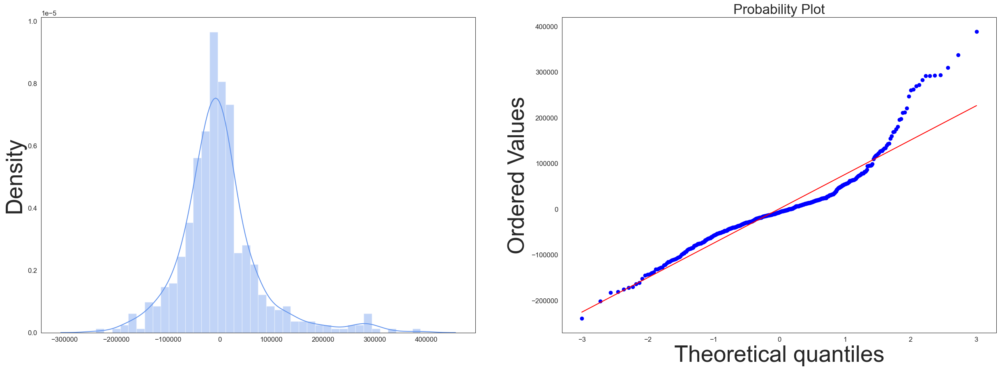

Text(0.5, 1.0, 'Residual plot')

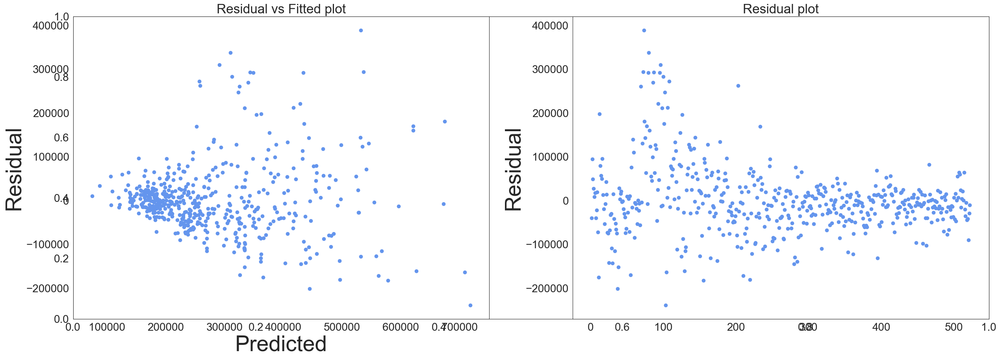

In [522]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue" )
plt.xlabel("Predicted")
plt.ylabel("Residual")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.scatter(range(1, len(residuals) + 1), residuals, color="cornflowerblue")
plt.ylabel("Residual")
plt.title("Residual plot")

# Y VS X7

In [523]:
#fit simple linear regression model
X = data['x7']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.309
Model:                            OLS   Adj. R-squared:                  0.307
Method:                 Least Squares   F-statistic:                     232.1
Date:                Sat, 27 Apr 2024   Prob (F-statistic):           1.34e-43
Time:                        00:38:33   Log-Likelihood:                -6821.5
No. Observations:                 522   AIC:                         1.365e+04
Df Residuals:                     520   BIC:                         1.366e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -8.266e+06   5.61e+05    -14.739      0.0

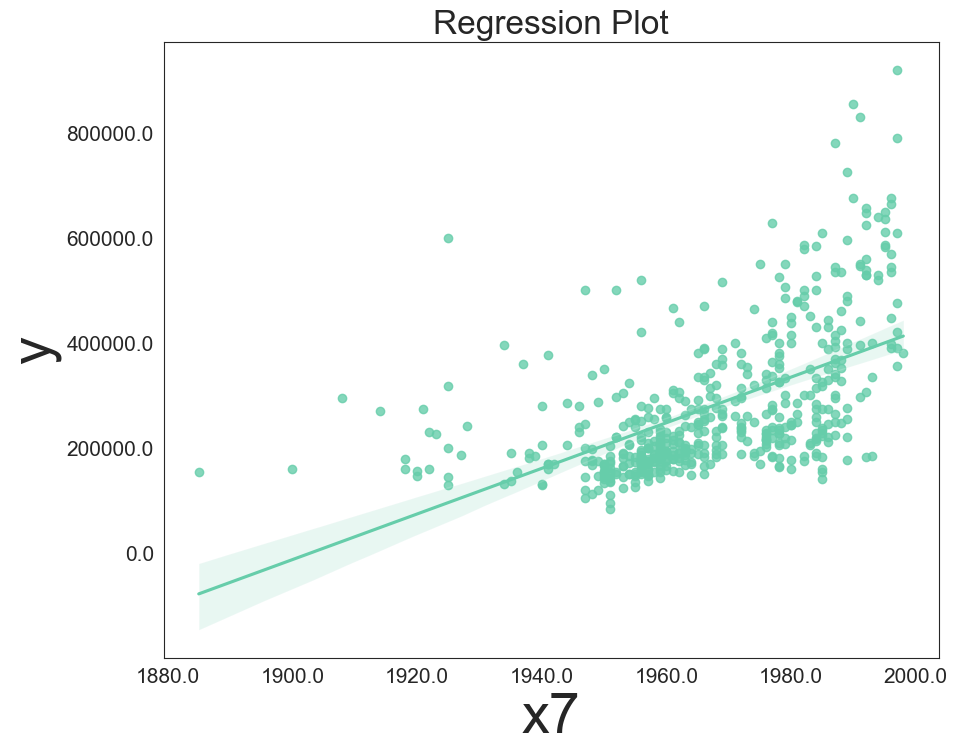

In [524]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x7'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

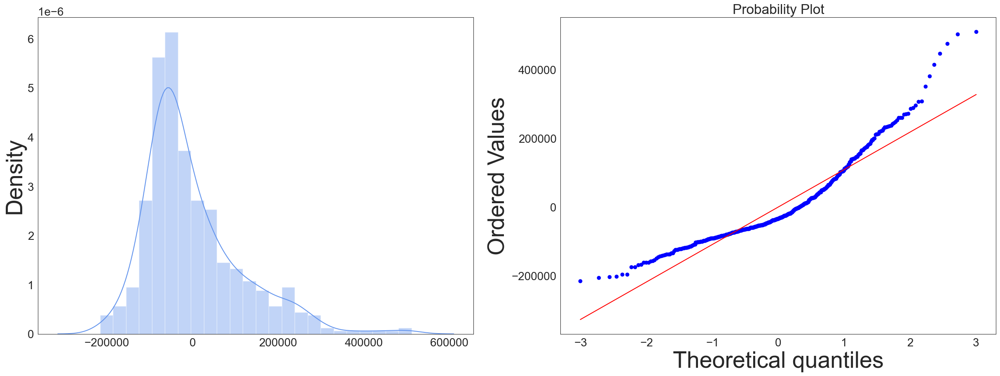

Text(0.5, 1.0, 'Residual plot')

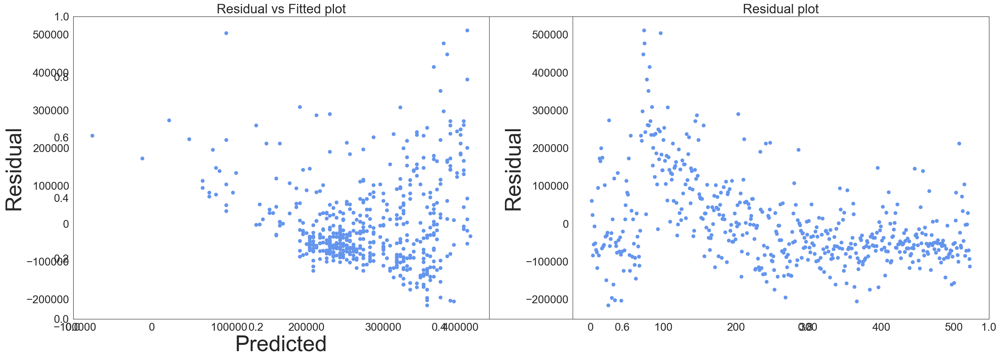

In [525]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue" )
plt.xlabel("Predicted")
plt.ylabel("Residual")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.scatter(range(1,len(residuals) + 1),residuals, color="cornflowerblue")
plt.ylabel("Residual")
plt.title("Residual plot")

# Y VS X10

In [526]:
#fit simple linear regression model
X = data['x10']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.048
Method:                 Least Squares   F-statistic:                     27.51
Date:                Sat, 27 Apr 2024   Prob (F-statistic):           2.27e-07
Time:                        00:38:35   Log-Likelihood:                -6904.3
No. Observations:                 522   AIC:                         1.381e+04
Df Residuals:                     520   BIC:                         1.382e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.134e+05   1.36e+04     15.655      0.0

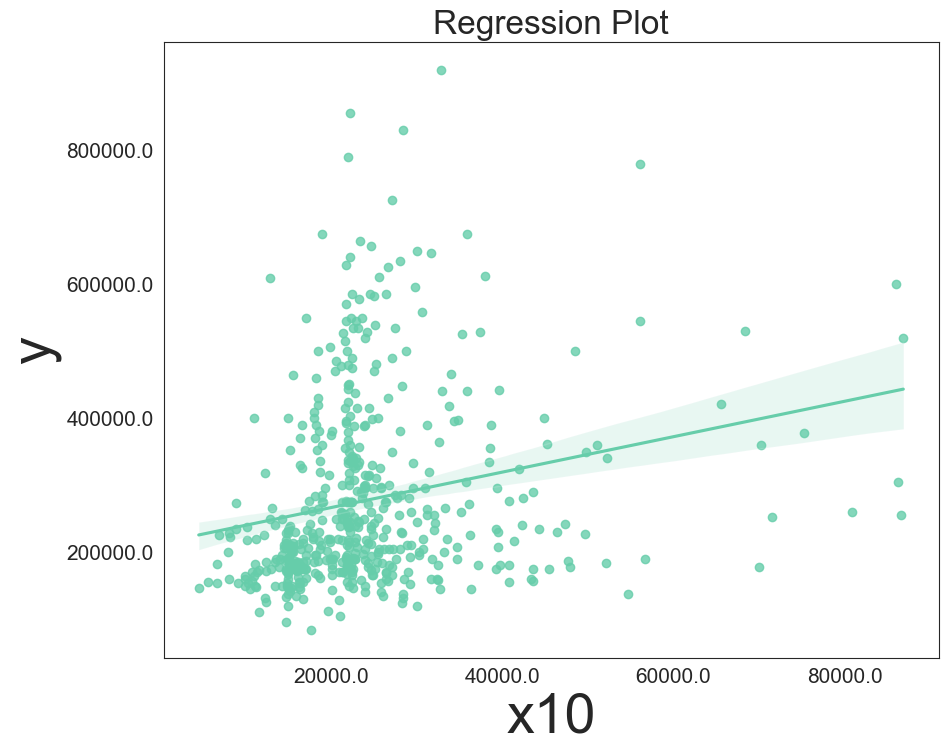

In [527]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x10'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

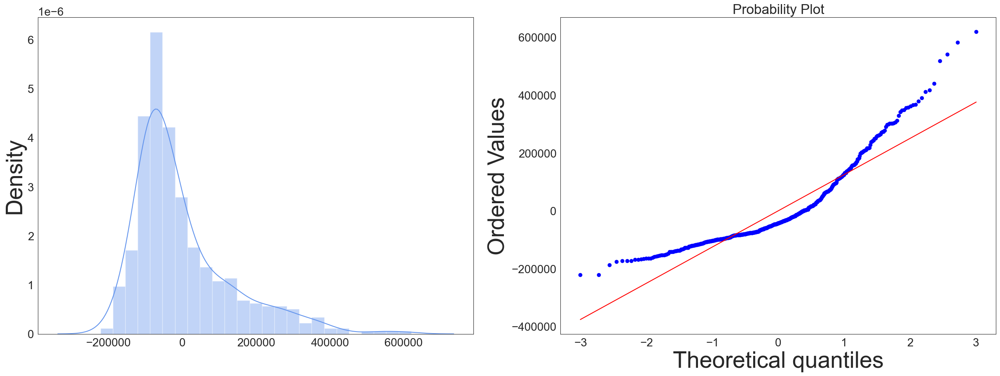

Text(0.5, 1.0, 'Residual plot')

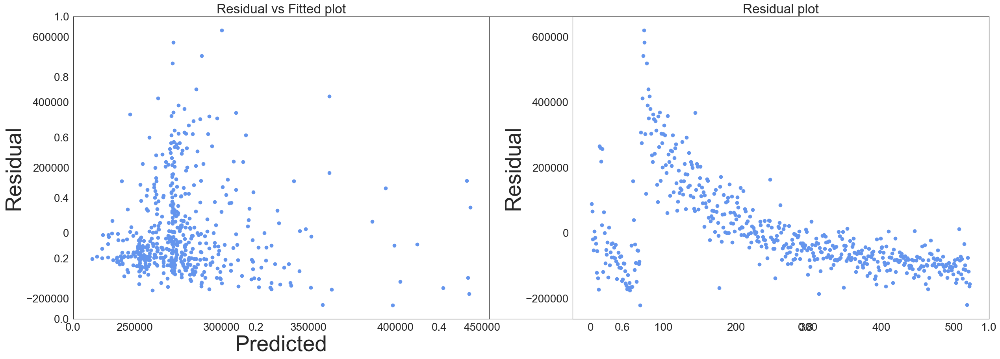

In [528]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.xlabel("Predicted")
plt.ylabel("Residual")
plt.title("Residual vs Fitted plot")



# plt.subplot(1, 2, 2)
# plt.plot(residuals, color="cornflowerblue")
# plt.ylabel("Residual")
# plt.title("Residual plot")

plt.subplot(1, 2, 2)
plt.scatter(range(1,len(residuals) + 1),residuals, color="cornflowerblue")
plt.ylabel("Residual")
plt.title("Residual plot")

# ~~~~~~~~~~~~~~~~GROUPING~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [847]:
# Define the mapping for grouping
group_mapping = {0: 0, 1: 0, 2: 1, 3: 1, 4: 0, 5:0, 6: 1, 7: 1}

# Apply the grouping
data['gr_x2'] = data['x2'].replace(group_mapping)

# Validate the results
print(data[['x2', 'gr_x2']].head(10))  # Check the first 10 rows to verify the grouping

   x2  gr_x2
0   4      0
1   4      0
2   4      0
3   4      0
4   4      0
5   4      0
6   3      1
7   2      1
8   3      1
9   3      1


In [848]:
data['gr_x2'].value_counts()

1    281
0    241
Name: gr_x2, dtype: int64

In [849]:
# Define the mapping for grouping
group_mapping = {0: 0, 1: 0, 2: 0, 3: 1, 4: 1, 5:1, 6: 1, 7: 0}

# Apply the grouping
data['gr_x3'] = data['x3'].replace(group_mapping)

# Validate the results
print(data[['x3', 'gr_x3']].head(10))  # Check the first 10 rows to verify the grouping

   x3  gr_x3
0   4      1
1   2      0
2   3      1
3   2      0
4   3      1
5   3      1
6   2      0
7   1      0
8   2      0
9   3      1


In [850]:
data['gr_x3'].value_counts()

1    277
0    245
Name: gr_x3, dtype: int64

In [851]:
# Define the mapping for grouping
group_mapping = {0: 0, 1: 0, 2: 1, 3: 0, 4: 0, 5:1, 7: 1}

# Apply the grouping
data['gr_x5'] = data['x5'].replace(group_mapping)

# Validate the results
print(data[['x5', 'gr_x5']].head(10))  # Check the first 10 rows to verify the grouping

   x5  gr_x5
0   2      1
1   2      1
2   2      1
3   2      1
4   2      1
5   5      1
6   2      1
7   1      0
8   2      1
9   1      0


In [852]:
data['gr_x5'].value_counts()

1    355
0    167
Name: gr_x5, dtype: int64

In [853]:
data['x9'].value_counts()

1     214
7     136
3      64
2      58
5      18
6      18
4      11
10      1
9       1
11      1
Name: x9, dtype: int64

In [854]:
# Define the mapping for grouping
group_mapping = {1:1,3:1,5:1,4:1,9:1,7:0,2:0,6:0,10:0,11:0}

# Apply the grouping
data['gr_x9'] = data['x9'].replace(group_mapping)

# Validate the results
print(data[['x9', 'gr_x9']].head(10))  # Check the first 10 rows to verify the grouping

   x9  gr_x9
0   1      1
1   1      1
2   1      1
3   1      1
4   7      0
5   1      1
6   7      0
7   1      1
8   1      1
9   1      1


In [855]:
data['gr_x9'].value_counts()

1    308
0    214
Name: gr_x9, dtype: int64

In [856]:
data

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,gr_x2,gr_x3,gr_x5,gr_x9
0,360000,3032,4,4,1,2,0,1972,2,1,22221,0,0,1,1,1
1,340000,2058,4,2,1,2,0,1976,2,1,22912,0,0,0,1,1
2,250000,1780,4,3,1,2,0,1980,2,1,21345,0,0,1,1,1
3,205500,1638,4,2,1,2,0,1963,2,1,17342,0,0,0,1,1
4,275500,2196,4,3,1,2,0,1968,2,7,21786,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517,137000,1655,2,1,0,1,0,1935,3,1,54651,0,1,0,0,1
518,185000,1944,3,2,1,2,0,1939,3,6,17999,0,1,0,1,0
519,133500,1922,3,1,0,2,0,1950,3,1,14805,0,1,0,1,1
520,124000,1480,3,2,1,2,0,1953,3,1,28351,0,1,0,1,1


In [857]:
data.drop(columns = ['x2','x3','x5','x9'])

,y,x1,x4,x6,x7,x8,x10,x11,gr_x2,gr_x3,gr_x5,gr_x9
0,360000,3032,1,0,1972,2,22221,0,0,1,1,1
1,340000,2058,1,0,1976,2,22912,0,0,0,1,1
2,250000,1780,1,0,1980,2,21345,0,0,1,1,1
3,205500,1638,1,0,1963,2,17342,0,0,0,1,1
4,275500,2196,1,0,1968,2,21786,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
517,137000,1655,0,0,1935,3,54651,0,1,0,0,1
518,185000,1944,1,0,1939,3,17999,0,1,0,1,0
519,133500,1922,0,0,1950,3,14805,0,1,0,1,1
520,124000,1480,1,0,1953,3,28351,0,1,0,1,1


In [858]:
data['x2'] = data['gr_x2']
data['x3'] = data['gr_x3']
data['x5'] = data['gr_x5']
data['x9'] = data['gr_x9']

In [859]:
data.drop(columns=['gr_x2', 'gr_x3', 'gr_x5', 'gr_x9'], inplace=True)
data

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11
0,360000,3032,0,1,1,1,0,1972,2,1,22221,0
1,340000,2058,0,0,1,1,0,1976,2,1,22912,0
2,250000,1780,0,1,1,1,0,1980,2,1,21345,0
3,205500,1638,0,0,1,1,0,1963,2,1,17342,0
4,275500,2196,0,1,1,1,0,1968,2,0,21786,0
...,...,...,...,...,...,...,...,...,...,...,...,...
517,137000,1655,1,0,0,0,0,1935,3,1,54651,0
518,185000,1944,1,0,1,1,0,1939,3,0,17999,0
519,133500,1922,1,0,0,1,0,1950,3,1,14805,0
520,124000,1480,1,0,1,1,0,1953,3,1,28351,0


In [860]:
data.nunique()

y      337
x1     415
x2       2
x3       2
x4       2
x5       2
x6       2
x7      74
x8       3
x9       2
x10    515
x11      2
dtype: int64

In [861]:
# After grouping my main data is in 'data'

# ~~~~~~~~~~~~~~~~~ENCODING~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [862]:
# Perform one-hot encoding using get_dummies()
data = pd.get_dummies(data,columns=['x8'] , drop_first = True)
data

,y,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3
0,360000,3032,0,1,1,1,0,1972,1,22221,0,1,0
1,340000,2058,0,0,1,1,0,1976,1,22912,0,1,0
2,250000,1780,0,1,1,1,0,1980,1,21345,0,1,0
3,205500,1638,0,0,1,1,0,1963,1,17342,0,1,0
4,275500,2196,0,1,1,1,0,1968,0,21786,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
517,137000,1655,1,0,0,0,0,1935,1,54651,0,0,1
518,185000,1944,1,0,1,1,0,1939,0,17999,0,0,1
519,133500,1922,1,0,0,1,0,1950,1,14805,0,0,1
520,124000,1480,1,0,1,1,0,1953,1,28351,0,0,1


In [863]:
data.nunique()

y       337
x1      415
x2        2
x3        2
x4        2
x5        2
x6        2
x7       74
x9        2
x10     515
x11       2
x8_2      2
x8_3      2
dtype: int64

In [864]:
data.shape

(522, 13)

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# TRAIN - TEST SPLIT

In [865]:
y = data['y']
#y #dependent column

In [866]:
X = data.drop(columns= 'y')
#X #independent columns

In [867]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [868]:
# Merge x_train and y_train
train_df = pd.concat([X_train,y_train], axis=1)
train_df

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3,y
220,2280,0,0,1,1,0,1956,1,25543,0,1,0,251010
69,4000,1,1,1,0,1,1979,0,23595,0,0,0,549900
374,2132,0,1,1,1,0,1976,1,41332,0,1,0,216000
305,2030,1,1,1,1,0,1959,1,21914,0,1,0,209900
173,3630,0,1,1,1,0,1969,0,23283,0,1,0,357500
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,3889,0,1,1,0,0,1991,0,28378,0,0,0,830000
106,3516,0,1,1,0,0,1979,0,19867,0,0,0,505500
270,2400,0,1,1,1,0,1976,0,44347,0,1,0,235000
435,1728,1,0,1,0,0,1950,1,10999,0,0,1,164900


# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# Y Variable Transformation

(array([0.e+00, 1.e-06, 2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06, 7.e-06]),
 [Text(0, 0.0, '0'),
  Text(0, 1e-06, '1'),
  Text(0, 2e-06, '2'),
  Text(0, 3e-06, '3'),
  Text(0, 4e-06, '4'),
  Text(0, 4.9999999999999996e-06, '5'),
  Text(0, 6e-06, '6'),
  Text(0, 7e-06, '7')])

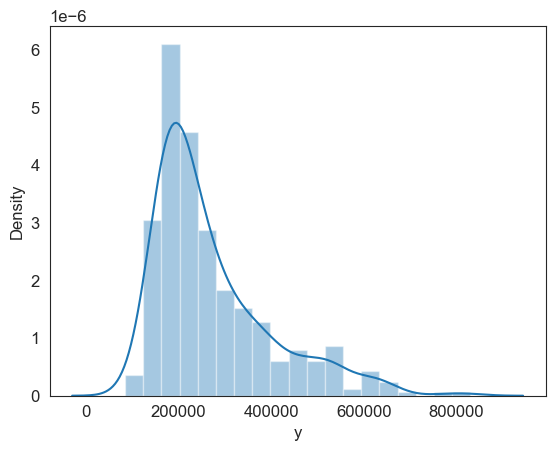

In [869]:
# Plotting the distribution
sns.distplot(train_df['y'])

# Adjusting the font size of x and y labels
plt.xlabel('y', fontsize=12)
plt.ylabel('Density', fontsize=12)
# Adjusting tick font size
plt.xticks(fontsize=12)  
plt.yticks(fontsize=12)  

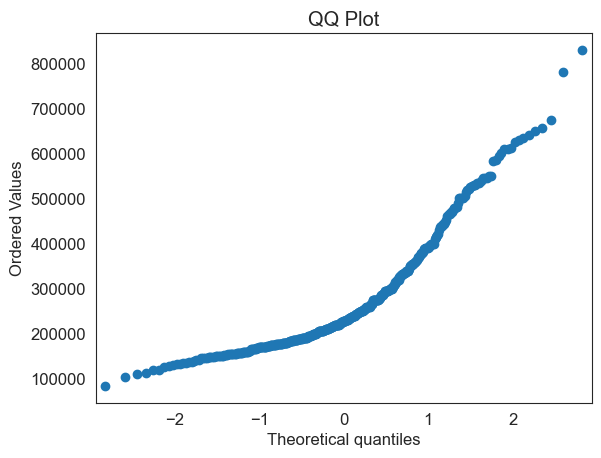

In [870]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm

# Assuming y_train is defined and contains the data you want to plot

# Create QQ plot
fig = sm.qqplot(train_df['y'] ) # line = 45

# Customize the plot (optional)
plt.title('QQ Plot')
plt.xlabel('Theoretical quantiles',fontsize=12)
plt.ylabel('Ordered Values',fontsize=12)

plt.xticks(fontsize=12)  
plt.yticks(fontsize=12) 

# Show the plot
plt.show()

# Apply Box-Cox Tranformation

In [871]:
import numpy as np
from scipy import stats


# Apply Box-Cox transformation
transformed_data, lambda_value = stats.boxcox(train_df['y'])

# Print the lambda value
print("Lambda value:", lambda_value)
y_box = transformed_data
y_box

Lambda value: -0.5925131974405559


array([1.68665974, 1.68705607, 1.68656047, 1.68654052, 1.68686133,
       1.68656666, 1.68653411, 1.68681932, 1.68686771, 1.68668174,
       1.68667695, 1.68684061, 1.68691096, 1.68599678, 1.68667935,
       1.68648671, 1.68666965, 1.68675704, 1.68655726, 1.68652381,
       1.68646844, 1.68663639, 1.68711083, 1.68646844, 1.68676645,
       1.6864275 , 1.68650609, 1.6866298 , 1.68592873, 1.68655468,
       1.68648006, 1.6862316 , 1.68671805, 1.68638696, 1.686448  ,
       1.68618615, 1.68658214, 1.68668411, 1.68687121, 1.68664169,
       1.68689204, 1.68660305, 1.68672661, 1.686964  , 1.68667935,
       1.68671566, 1.68644388, 1.68694007, 1.68642707, 1.68675704,
       1.68682777, 1.68655403, 1.68646331, 1.68629981, 1.68640564,
       1.68711368, 1.6864704 , 1.68659839, 1.68622153, 1.68659131,
       1.68673703, 1.68655077, 1.68665209, 1.68705287, 1.68641669,
       1.68635879, 1.68652172, 1.68638229, 1.68646687, 1.68627935,
       1.68652554, 1.6864232 , 1.68624939, 1.68664169, 1.68700

(array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.,
        1800.]),
 [Text(0, 0.0, '0'),
  Text(0, 200.0, '200'),
  Text(0, 400.0, '400'),
  Text(0, 600.0, '600'),
  Text(0, 800.0, '800'),
  Text(0, 1000.0, '1000'),
  Text(0, 1200.0, '1200'),
  Text(0, 1400.0, '1400'),
  Text(0, 1600.0, '1600'),
  Text(0, 1800.0, '1800')])

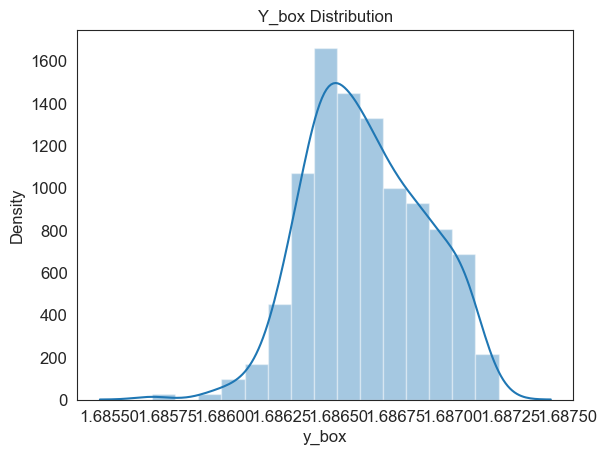

In [872]:
sns.distplot(y_box)
plt.title('Y_box Distribution',fontsize=12)
plt.xlabel('y_box',fontsize=12)
plt.ylabel('Density',fontsize=12)

plt.xticks(fontsize=12)  
plt.yticks(fontsize=12) 

In [873]:
train_df['y_box'] = y_box
train_df

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3,y,y_box
220,2280,0,0,1,1,0,1956,1,25543,0,1,0,251010,1.686660
69,4000,1,1,1,0,1,1979,0,23595,0,0,0,549900,1.687056
374,2132,0,1,1,1,0,1976,1,41332,0,1,0,216000,1.686560
305,2030,1,1,1,1,0,1959,1,21914,0,1,0,209900,1.686541
173,3630,0,1,1,1,0,1969,0,23283,0,1,0,357500,1.686861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,3889,0,1,1,0,0,1991,0,28378,0,0,0,830000,1.687201
106,3516,0,1,1,0,0,1979,0,19867,0,0,0,505500,1.687022
270,2400,0,1,1,1,0,1976,0,44347,0,1,0,235000,1.686617
435,1728,1,0,1,0,0,1950,1,10999,0,0,1,164900,1.686358


In [874]:
train_df.drop(columns = 'y')

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3,y_box
220,2280,0,0,1,1,0,1956,1,25543,0,1,0,1.686660
69,4000,1,1,1,0,1,1979,0,23595,0,0,0,1.687056
374,2132,0,1,1,1,0,1976,1,41332,0,1,0,1.686560
305,2030,1,1,1,1,0,1959,1,21914,0,1,0,1.686541
173,3630,0,1,1,1,0,1969,0,23283,0,1,0,1.686861
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,3889,0,1,1,0,0,1991,0,28378,0,0,0,1.687201
106,3516,0,1,1,0,0,1979,0,19867,0,0,0,1.687022
270,2400,0,1,1,1,0,1976,0,44347,0,1,0,1.686617
435,1728,1,0,1,0,0,1950,1,10999,0,0,1,1.686358


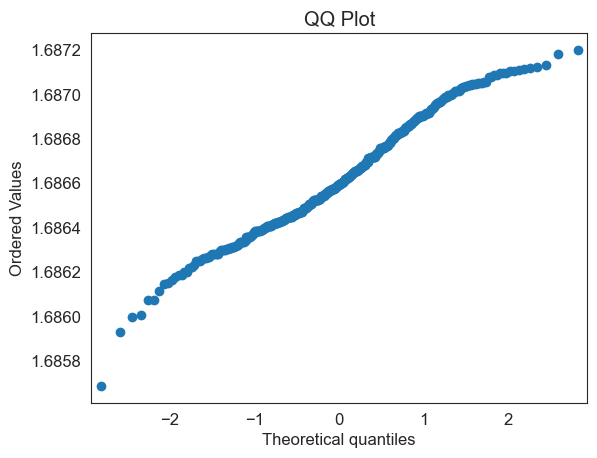

In [875]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm

# Assuming y_train is defined and contains the data you want to plot

# Create QQ plot
fig = sm.qqplot(train_df['y_box']) #,line='45'

# Customize the plot (optional)
plt.title('QQ Plot')
plt.xlabel('Theoretical quantiles',fontsize=12)
plt.ylabel('Ordered Values',fontsize=12)


plt.xticks(fontsize=12)  
plt.yticks(fontsize=12) 

# Show the plot
plt.show()

# ASSUMPTIONS

# 1) LINEARITY

In [876]:
#since,there is no linearity between numerical x's and y do,We need to transform x using Box Tidwell Test

In [877]:
# Define the Box-Tidwell transformation function
def box_tidwell_transform(x):
    return np.log(x)

# Apply the Box-Tidwell transformation to the predictor variable 'x'
train_df['x1'] = box_tidwell_transform(train_df['x1'])
train_df['x7'] = box_tidwell_transform(train_df['x7'])
train_df['x10'] = box_tidwell_transform(train_df['x10'])
train_df

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3,y,y_box
220,7.731931,0,0,1,1,0,7.578657,1,10.148119,0,1,0,251010,1.686660
69,8.294050,1,1,1,0,1,7.590347,0,10.068790,0,0,0,549900,1.687056
374,7.664816,0,1,1,1,0,7.588830,1,10.629392,0,1,0,216000,1.686560
305,7.615791,1,1,1,1,0,7.580189,1,9.994881,0,1,0,209900,1.686541
173,8.196988,0,1,1,1,0,7.585281,0,10.055479,0,1,0,357500,1.686861
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,8.265907,0,1,1,0,0,7.596392,0,10.253369,0,0,0,830000,1.687201
106,8.165079,0,1,1,0,0,7.590347,0,9.896815,0,0,0,505500,1.687022
270,7.783224,0,1,1,1,0,7.588830,0,10.699800,0,1,0,235000,1.686617
435,7.454720,1,0,1,0,0,7.575585,1,9.305560,0,0,1,164900,1.686358


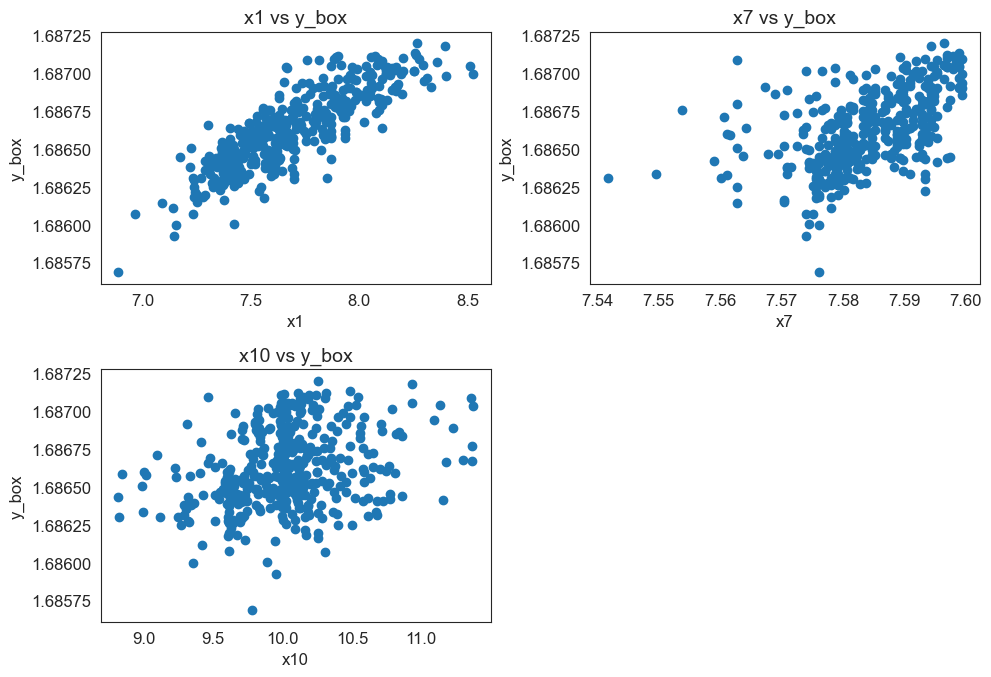

In [878]:
import matplotlib.pyplot as plt

def scatter(x, fig):
    plt.subplot(6, 2, fig)
    plt.scatter(train_df[x], train_df['y_box'])
    plt.title(x + ' vs y_box', fontsize=14)  
    plt.ylabel('y_box', fontsize=12)  
    plt.xlabel(x, fontsize=12)  
    plt.xticks(fontsize=12)  
    plt.yticks(fontsize=12) 

plt.figure(figsize=(10, 20))

scatter('x1', 1)
scatter('x7', 2)
scatter('x10', 3)

plt.tight_layout()
plt.show()

#  MULTIPLE LINEAR REGRESSION
Since x2 , x3,x4,x5,x6,x8,x9,x11 are qualitative predictors in our dataset. To fit the multiple linear regression model on the dataset we quatify the qualitative variable .

x2_1 = 1

In [879]:
train_data = train_df.drop(columns = 'y') 
train_data

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3,y_box
220,7.731931,0,0,1,1,0,7.578657,1,10.148119,0,1,0,1.686660
69,8.294050,1,1,1,0,1,7.590347,0,10.068790,0,0,0,1.687056
374,7.664816,0,1,1,1,0,7.588830,1,10.629392,0,1,0,1.686560
305,7.615791,1,1,1,1,0,7.580189,1,9.994881,0,1,0,1.686541
173,8.196988,0,1,1,1,0,7.585281,0,10.055479,0,1,0,1.686861
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,8.265907,0,1,1,0,0,7.596392,0,10.253369,0,0,0,1.687201
106,8.165079,0,1,1,0,0,7.590347,0,9.896815,0,0,0,1.687022
270,7.783224,0,1,1,1,0,7.588830,0,10.699800,0,1,0,1.686617
435,7.454720,1,0,1,0,0,7.575585,1,9.305560,0,0,1,1.686358


In [880]:
# Fit simple linear regression model
X = train_data.drop(columns='y_box')
Y = train_data['y_box']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - pred
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                  y_box   R-squared:                       0.838
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     174.7
Date:                Sat, 27 Apr 2024   Prob (F-statistic):          1.57e-151
Time:                        01:26:55   Log-Likelihood:                 3239.6
No. Observations:                 417   AIC:                            -6453.
Df Residuals:                     404   BIC:                            -6401.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6498      0.006    273.294      0.0

# 2) HOMOSCEDASTICITY

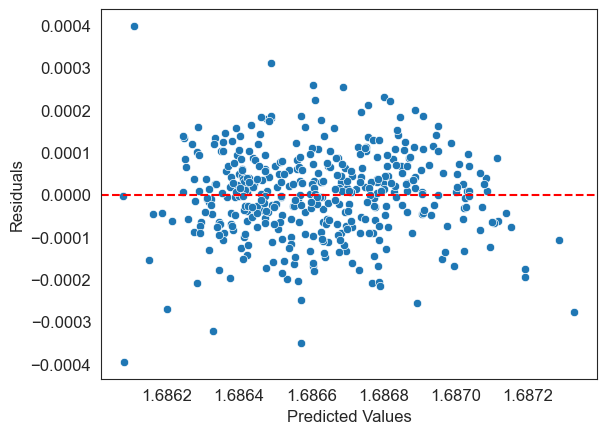

In [881]:
# Predict the values using the fitted model
pred1 = model.predict(X)

# Get the residuals
resid1 = model.resid

# Plot residuals against predicted values
sns.scatterplot(x=pred1, y=resid1)
# Draw a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values",fontsize=12)
plt.ylabel("Residuals",fontsize=12)
plt.show()

In [882]:
# Since the points are scattered randomly around the x_axis , our model follows the property of homoscedasticity

# 3) NORMALITY

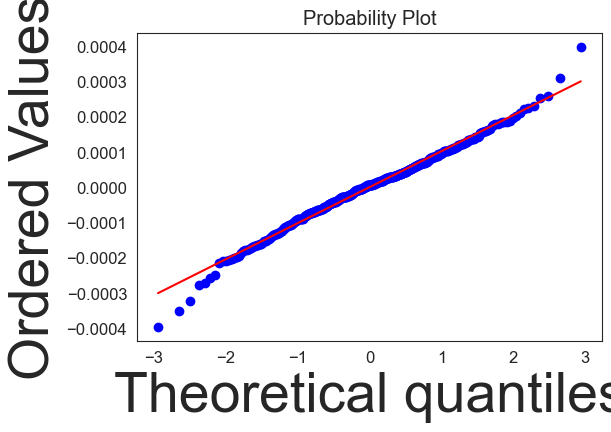

In [883]:
# QQ Plot

import scipy as sp

fig, ax = plt.subplots(figsize=(6,4))
sp.stats.probplot(resid1, plot=ax, fit=True)

plt.show()

#1. Linear Relationship

In [884]:
# plt.scatter(train_data['x1'], train_data['y_box'])
# plt.title("x1")
# plt.show()

# plt.scatter(train_data['x7'], train_data['y_box'])
# plt.title("x7")
# plt.show()

# plt.scatter(train_data['x10'], train_data['y_box'])
# plt.title("x10")
# plt.show()

# 4. Multicollinearity

In [885]:
train_data

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3,y_box
220,7.731931,0,0,1,1,0,7.578657,1,10.148119,0,1,0,1.686660
69,8.294050,1,1,1,0,1,7.590347,0,10.068790,0,0,0,1.687056
374,7.664816,0,1,1,1,0,7.588830,1,10.629392,0,1,0,1.686560
305,7.615791,1,1,1,1,0,7.580189,1,9.994881,0,1,0,1.686541
173,8.196988,0,1,1,1,0,7.585281,0,10.055479,0,1,0,1.686861
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,8.265907,0,1,1,0,0,7.596392,0,10.253369,0,0,0,1.687201
106,8.165079,0,1,1,0,0,7.590347,0,9.896815,0,0,0,1.687022
270,7.783224,0,1,1,1,0,7.588830,0,10.699800,0,1,0,1.686617
435,7.454720,1,0,1,0,0,7.575585,1,9.305560,0,0,1,1.686358


In [886]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = []
X_ind = train_data.drop(columns = ['y_box'])
for i in range(X_ind.shape[1]):
    vif.append(variance_inflation_factor(X_ind, i))

In [887]:
X_ind

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3
220,7.731931,0,0,1,1,0,7.578657,1,10.148119,0,1,0
69,8.294050,1,1,1,0,1,7.590347,0,10.068790,0,0,0
374,7.664816,0,1,1,1,0,7.588830,1,10.629392,0,1,0
305,7.615791,1,1,1,1,0,7.580189,1,9.994881,0,1,0
173,8.196988,0,1,1,1,0,7.585281,0,10.055479,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
71,8.265907,0,1,1,0,0,7.596392,0,10.253369,0,0,0
106,8.165079,0,1,1,0,0,7.590347,0,9.896815,0,0,0
270,7.783224,0,1,1,1,0,7.588830,0,10.699800,0,1,0
435,7.454720,1,0,1,0,0,7.575585,1,9.305560,0,0,1


In [888]:
pd.DataFrame({'vif': vif}, index=X_ind.columns[0:37])

,vif
x1,2032.668059
x2,2.597682
x3,4.751334
x4,8.168962
x5,4.073482
x6,1.129948
x7,2446.421264
x9,3.495814
x10,636.608772
x11,1.051283


# 5. Autocorrelation of Residuals

In [889]:
from statsmodels.stats.stattools import durbin_watson

dw_statistic = durbin_watson(residuals)
print("Durbin-Watson Test Statistic:", dw_statistic)

Durbin-Watson Test Statistic: 1.983608452425504


# MODEL SELECTION

In [890]:
train_data

,x1,x2,x3,x4,x5,x6,x7,x9,x10,x11,x8_2,x8_3,y_box
220,7.731931,0,0,1,1,0,7.578657,1,10.148119,0,1,0,1.686660
69,8.294050,1,1,1,0,1,7.590347,0,10.068790,0,0,0,1.687056
374,7.664816,0,1,1,1,0,7.588830,1,10.629392,0,1,0,1.686560
305,7.615791,1,1,1,1,0,7.580189,1,9.994881,0,1,0,1.686541
173,8.196988,0,1,1,1,0,7.585281,0,10.055479,0,1,0,1.686861
...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,8.265907,0,1,1,0,0,7.596392,0,10.253369,0,0,0,1.687201
106,8.165079,0,1,1,0,0,7.590347,0,9.896815,0,0,0,1.687022
270,7.783224,0,1,1,1,0,7.588830,0,10.699800,0,1,0,1.686617
435,7.454720,1,0,1,0,0,7.575585,1,9.305560,0,0,1,1.686358


Size of the Feature Space:

- Forward selection tends to be preferable when you have a large number of potential predictor variables but a relatively small sample size. Starting with a small set of predictors and gradually adding them helps prevent overfitting.
- Backward elimination may be more suitable when you have a smaller number of potential predictors and a larger sample size, as it starts with a full model and removes predictors iteratively.

In [891]:
from sklearn.metrics import mean_squared_error

In [892]:
def fit_linear_reg(X,Y,X_full):
    #Fit linear regression model and return RSS and R squared values
    model_k = linear_model.LinearRegression(fit_intercept = True)
    model_k.fit(X,Y)
    SSEp = mean_squared_error(Y,model_k.predict(X)) * (len(Y)-X.shape[1]-1)
    R_squared = model_k.score(X,Y)
    Ad_R_squared = 1 - ( 1-model_k.score(X, Y) ) * ( len(Y) - 1 ) / ( len(Y) - X.shape[1] - 1 )
    
    Xx = sm.add_constant(X)
    modelx = sm.OLS(Y, Xx).fit()
    AIC = modelx.aic
    BIC = modelx.bic
    
    ## Mallow C_p
    model_temp = linear_model.LinearRegression(fit_intercept = True)
    model_temp.fit(X_full, Y)
    y_pred = model_temp.predict(X_full)
    mse = mean_squared_error(Y, y_pred)
    Cp = (SSEp/mse)-(len(Y)- (2*X.shape[1]))
    
    return SSEp, R_squared , Ad_R_squared, AIC, BIC, Cp

In [893]:
from sklearn import linear_model
[128]
#Importing tqdm for the progress bar
from tqdm import tnrange, tqdm_notebook
import itertools

X1 = train_data.drop('y_box', axis=1)
y1 = train_data.y_box

#Initialization variables
k = X1.shape[1]
SSEp_list, R_squared_list, Adj_R_squared_list,feature_list, AIC_list, BIC_list, Cp_list = [],[],[],[],[],[],[]
numb_features = []

X1 = train_data.drop('y_box', axis=1)
y1 = train_data.y_box

#Looping over k = 1 to k = 11 features in X
for k in tnrange(1,len(X1.columns) + 1, desc = 'Loop...'):

    #Looping over all possible combinations: from 11 choose k
    for combo in itertools.combinations(X1.columns,k):
        tmp_result = fit_linear_reg(X1[list(combo)],y1, X1)   #Store temp result 
        SSEp_list.append(tmp_result[0])                  #Append lists
        R_squared_list.append(tmp_result[1])
        Adj_R_squared_list.append(tmp_result[2])
        AIC_list.append(tmp_result[3])
        BIC_list.append(tmp_result[4])
        Cp_list.append(tmp_result[5])
        feature_list.append(combo)
        numb_features.append(len(combo))   

#Store in DataFrame
Subset_df = pd.DataFrame({'features':feature_list, 'p': numb_features,'SSEp': SSEp_list, 'R_squared':R_squared_list,'Adj_R_squared':Adj_R_squared_list, 'AIC':AIC_list, 'BIC':BIC_list, 'Cp':Cp_list})

Loop...:   0%|          | 0/12 [00:00<?, ?it/s]

In [894]:
Subset_df

,features,p,SSEp,R_squared,Adj_R_squared,AIC,BIC,Cp
0,"(x1,)",1,0.000008,0.720427,0.719754,-6246.576505,-6238.510333,303.020106
1,"(x2,)",1,0.000024,0.112804,0.110666,-5765.023449,-5756.957276,1863.564831
2,"(x3,)",1,0.000014,0.481240,0.479990,-5988.795872,-5980.729700,917.319314
3,"(x4,)",1,0.000022,0.180216,0.178241,-5797.976976,-5789.910804,1690.431722
4,"(x5,)",1,0.000025,0.051055,0.048769,-5736.965773,-5728.899600,2022.152575
...,...,...,...,...,...,...,...,...
4090,"(x1, x2, x3, x5, x6, x7, x9, x10, x11, x8_2, x...",11,0.000004,0.832819,0.828279,-6440.992622,-6392.595588,24.020057
4091,"(x1, x2, x4, x5, x6, x7, x9, x10, x11, x8_2, x...",11,0.000005,0.827556,0.822873,-6428.067280,-6379.670245,37.211397
4092,"(x1, x3, x4, x5, x6, x7, x9, x10, x11, x8_2, x...",11,0.000004,0.837518,0.833105,-6452.881340,-6404.484305,12.242435
4093,"(x2, x3, x4, x5, x6, x7, x9, x10, x11, x8_2, x...",11,0.000007,0.732988,0.725735,-6245.744926,-6197.347891,274.237285


In [895]:
Best_subset={}

Best_subset['min_SSEp'] = Subset_df[Subset_df.groupby('p')['SSEp'].transform(min) == Subset_df['SSEp']]
Best_subset['max_R2'] = Subset_df[Subset_df.groupby('p')['R_squared'].transform(max) == Subset_df['R_squared']]
Best_subset['max_adj_R2'] = Subset_df[Subset_df.groupby('p')['Adj_R_squared'].transform(max) == Subset_df['Adj_R_squared']]
Best_subset['min_AIC'] = Subset_df[Subset_df.groupby('p')['AIC'].transform(min) == Subset_df['AIC']]
Best_subset['min_BIC'] = Subset_df[Subset_df.groupby('p')['BIC'].transform(min) == Subset_df['BIC']]
Best_subset['min_Cp'] = Subset_df[Subset_df.groupby('p')['Cp'].transform(min) == Subset_df['Cp']]

In [896]:
Best_subset['min_SSEp']

,features,p,SSEp,R_squared,Adj_R_squared,AIC,BIC,Cp
0,"(x1,)",1,0.000008,0.720427,0.719754,-6246.576505,-6238.510333,303.020106
17,"(x1, x7)",2,0.000006,0.760867,0.759712,-6309.729837,-6297.630578,199.679539
119,"(x1, x7, x10)",3,0.000006,0.792525,0.791018,-6366.948390,-6350.816045,119.284007
365,"(x1, x3, x7, x10)",4,0.000005,0.807816,0.805950,-6396.872184,-6376.706753,81.013342
977,"(x1, x3, x7, x9, x10)",5,0.000005,0.817019,0.814793,-6415.335416,-6391.136899,58.415235
1831,"(x1, x3, x4, x7, x9, x10)",6,0.000005,0.823527,0.820945,-6428.437049,-6400.205446,42.769676
2824,"(x1, x3, x4, x7, x10, x8_2, x8_3)",7,0.000005,0.829554,0.826637,-6440.926129,-6408.661439,28.423836
3563,"(x1, x3, x4, x7, x9, x10, x8_2, x8_3)",8,0.000004,0.835011,0.831776,-6452.496267,-6416.198491,15.589242
3939,"(x1, x3, x4, x6, x7, x9, x10, x8_2, x8_3)",9,0.000004,0.837273,0.833675,-6456.253197,-6415.922335,10.870448
4039,"(x1, x2, x3, x4, x6, x7, x9, x10, x8_2, x8_3)",10,0.000004,0.838194,0.834209,-6456.618737,-6412.254789,9.550578


(x1, x2, x3, x4, x6, x7, x9, x10, x8_2, x8_3) best subset according to the R squared and adjusted r squared

In [897]:
Best_subset['max_adj_R2'].loc[Best_subset['max_adj_R2']['Adj_R_squared'].idxmax()]['p']

10

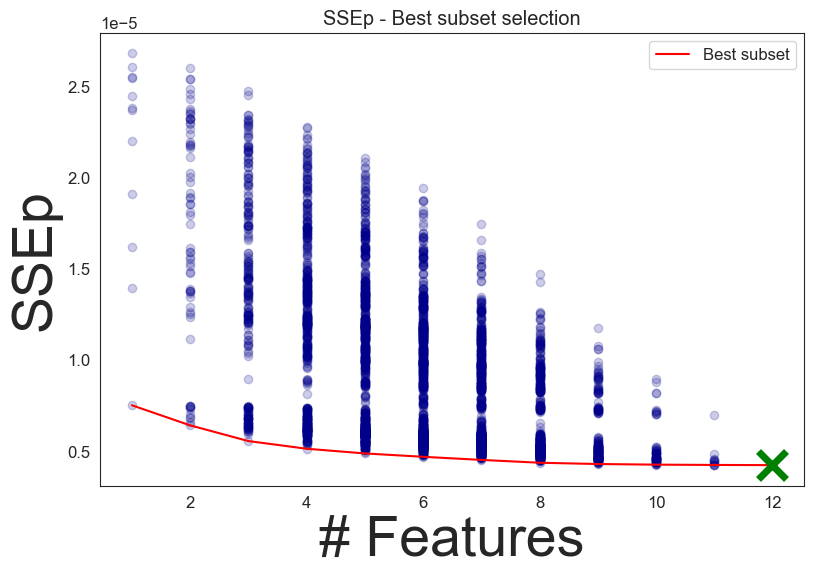

In [898]:
import matplotlib.pyplot as plt

# Plots for variable selection criteria
fig = plt.figure(figsize=(20, 20))
#plt.rcParams['font.size'] = '20'

ax = fig.add_subplot(3, 2, 1)
ax.scatter(Subset_df.p, Subset_df.SSEp, alpha=0.2, color='darkblue')
ax.set_xlabel('# Features')
ax.set_ylabel('SSEp')
ax.set_title('SSEp - Best subset selection')
ax.plot(range(1, len(Best_subset['min_SSEp']) + 1), Best_subset['min_SSEp']['SSEp'], color='r', label='Best subset')
ax.plot(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp']['SSEp'].idxmin()]['p'],
        Best_subset['min_SSEp']['SSEp'].min(), marker='x', markersize=20, color='green', markeredgewidth=5)
ax.legend()

# Repeat the same process for other subplots...


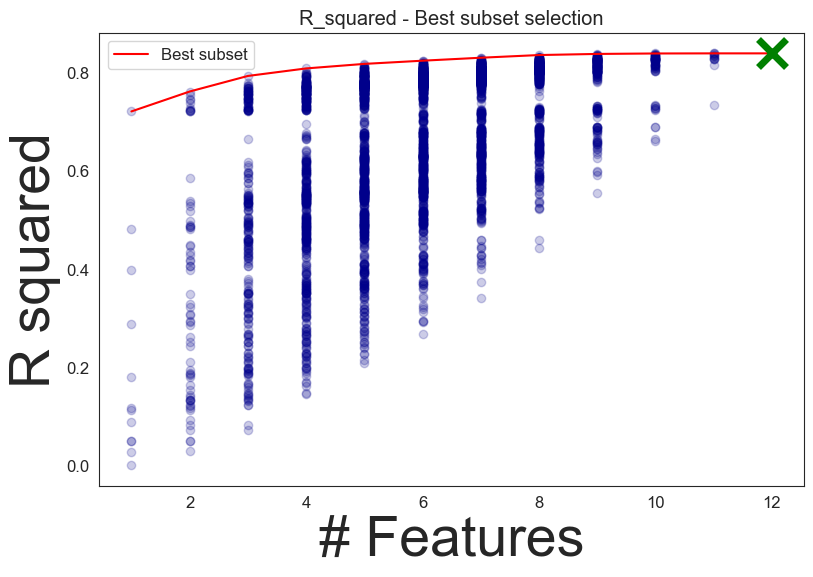

In [899]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(3, 2, 2)
ax.scatter(Subset_df.p, Subset_df.R_squared, alpha=0.2, color='darkblue')
ax.plot(range(1, len(Best_subset['max_R2']) + 1), Best_subset['max_R2']['R_squared'], color='r', label='Best subset')
ax.plot(Best_subset['max_R2'].loc[Best_subset['max_R2']['R_squared'].idxmax()]['p'],
        Best_subset['max_R2']['R_squared'].max(), marker='x', markersize=20, color='green', markeredgewidth=5)
ax.set_xlabel('# Features')
ax.set_ylabel('R squared')
ax.set_title('R_squared - Best subset selection')
ax.legend()

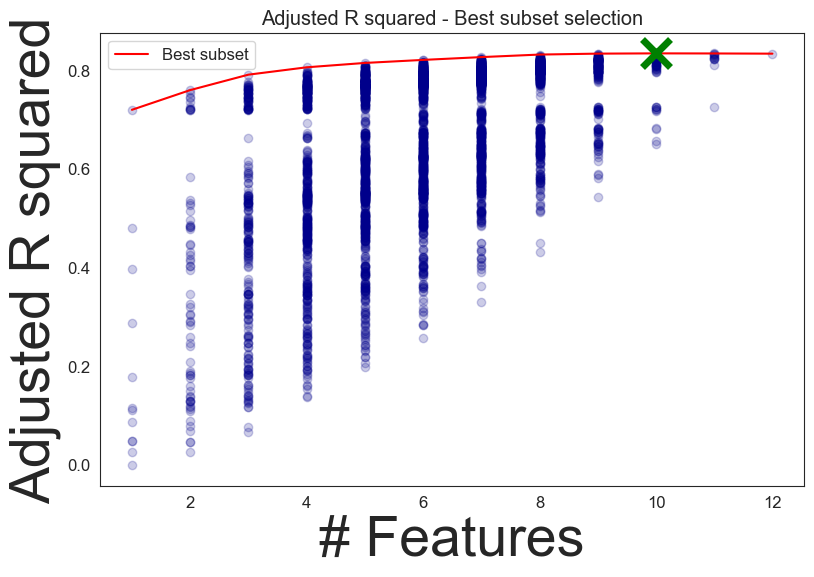

In [900]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(3, 2, 3)
ax.scatter(Subset_df.p, Subset_df.Adj_R_squared, alpha=0.2, color='darkblue')
ax.set_xlabel('# Features')
ax.set_ylabel('Adjusted R squared')
ax.set_title('Adjusted R squared - Best subset selection')
ax.plot(range(1, len(Best_subset['max_adj_R2']) + 1), Best_subset['max_adj_R2']['Adj_R_squared'], color='r', label='Best subset')
ax.plot(Best_subset['max_adj_R2'].loc[Best_subset['max_adj_R2']['Adj_R_squared'].idxmax()]['p'],
        Best_subset['max_adj_R2']['Adj_R_squared'].max(), marker='x', markersize=20, color='green',
        markeredgewidth=5)
ax.legend()

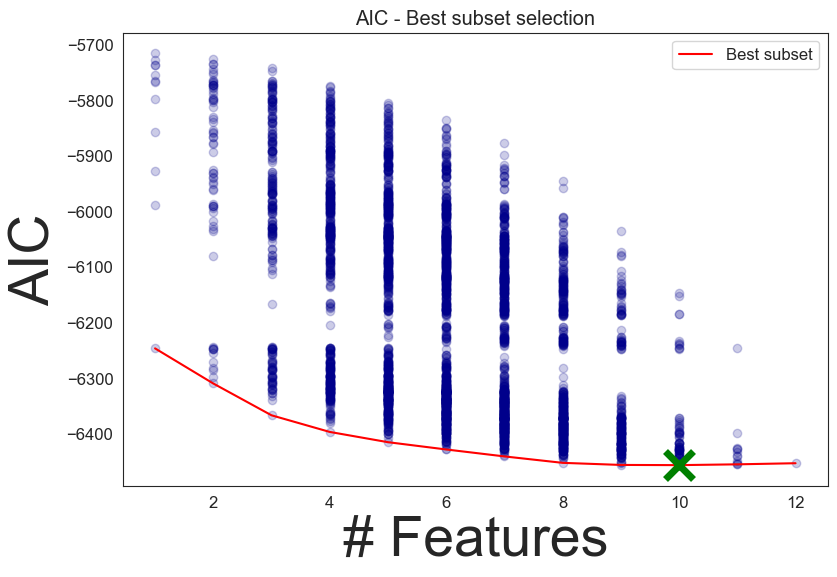

In [901]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(3, 2, 4)
ax.scatter(Subset_df.p, Subset_df.AIC, alpha=0.2, color='darkblue')
ax.set_xlabel('# Features')
ax.set_ylabel('AIC')
ax.set_title('AIC - Best subset selection')
ax.plot(range(1, len(Best_subset['min_AIC']) + 1), Best_subset['min_AIC']['AIC'], color='r', label='Best subset')
ax.plot(Best_subset['min_AIC'].loc[Best_subset['min_AIC']['AIC'].idxmin()]['p'],
        Best_subset['min_AIC']['AIC'].min(), marker='x', markersize=20, color='green', markeredgewidth=5)
ax.legend()

In [902]:
# fig = plt.figure(figsize=(20, 20))

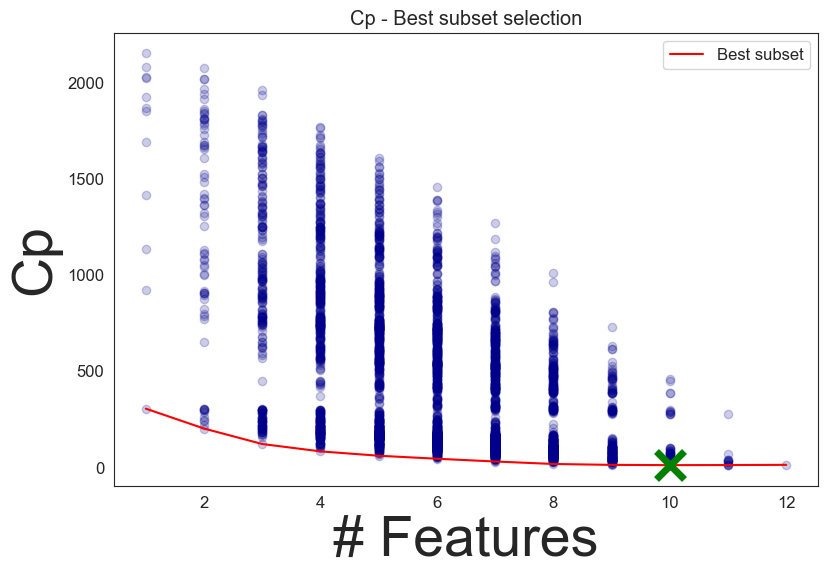

In [903]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(3, 2, 6)
ax.scatter(Subset_df.p, Subset_df.Cp, alpha=0.2, color='darkblue')
ax.set_xlabel('# Features')
ax.set_ylabel('Cp')
ax.set_title('Cp - Best subset selection')
ax.plot(range(1, len(Best_subset['min_Cp']) + 1), Best_subset['min_Cp']['Cp'], color='r', label='Best subset')
ax.plot(Best_subset['min_Cp'].loc[Best_subset['min_Cp']['Cp'].idxmin()]['p'],
        Best_subset['min_Cp']['Cp'].min(), marker='x', markersize=20, color='green', markeredgewidth=5)
ax.legend()

plt.show()

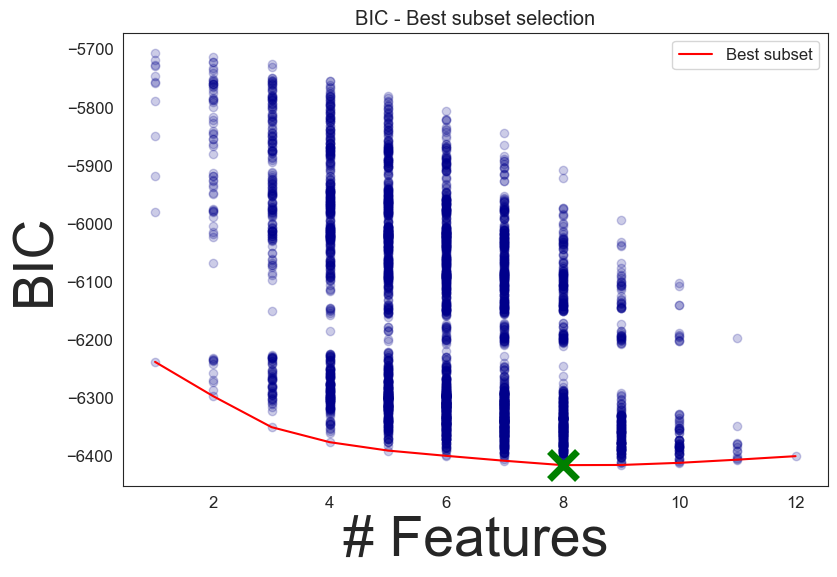

In [904]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(3, 2, 5)
ax.scatter(Subset_df.p, Subset_df.BIC, alpha=0.2, color='darkblue')
ax.set_xlabel('# Features')
ax.set_ylabel('BIC')
ax.set_title('BIC - Best subset selection')
ax.plot(range(1, len(Best_subset['min_BIC']) + 1), Best_subset['min_BIC']['BIC'], color='r', label='Best subset')
ax.plot(Best_subset['min_BIC'].loc[Best_subset['min_BIC']['BIC'].idxmin()]['p'],
        Best_subset['min_BIC']['BIC'].min(), marker='x', markersize=20, color='green', markeredgewidth=5)
ax.legend()

In [905]:
prams = ['R_squared', 'Adj_R_squared', 'AIC', 'BIC', 'Cp']
value = []
num_var = []
variables = []

for cols in prams:
    if cols == 'R_squared' or cols == 'Adj_R_squared':
        value.append(max(Best_subset['min_SSEp'][cols]))
        num_var.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmax()]['p'])
        variables.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmax()]['features'])
    else:
        value.append(min(Best_subset['min_SSEp'][cols]))
        num_var.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmin()]['p'])
        variables.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmin()]['features'])
    
subsets_df = pd.DataFrame({'Parameter':prams, 'Value':value, 'p': num_var, 'Features':variables})   

In [906]:
subsets_df

,Parameter,Value,p,Features
0,R_squared,0.838413,12,"(x1, x2, x3, x4, x5, x6, x7, x9, x10, x11, x8_..."
1,Adj_R_squared,0.834209,10,"(x1, x2, x3, x4, x6, x7, x9, x10, x8_2, x8_3)"
2,AIC,-6456.618737,10,"(x1, x2, x3, x4, x6, x7, x9, x10, x8_2, x8_3)"
3,BIC,-6416.198491,8,"(x1, x3, x4, x7, x9, x10, x8_2, x8_3)"
4,Cp,9.550578,10,"(x1, x2, x3, x4, x6, x7, x9, x10, x8_2, x8_3)"


In [908]:
taken_features = ['x1', 'x2', 'x3', 'x4', 'x6', 'x7', 'x9', 'x10', 'x8_2', 'x8_3']

# Stepwise feature selection

In [907]:
import itertools
import pandas as pd
from sklearn.metrics import mean_squared_error
from sklearn import linear_model
import statsmodels.api as sm

X = X1
y = y1

def stepwise_selection(X, y, initial_list=[], threshold_in=0.05, threshold_out=0.05, verbose=True):
    """ Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed = False
        # forward step
        excluded = list(set(X.columns) - set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, pd.DataFrame(X[included + [new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed = True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, pd.DataFrame(X[included])).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max()  # null if pvalues is empty
        if worst_pval > threshold_out:
            changed = True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

result = stepwise_selection(X, y)

print('resulting features:')
print(result)

Add  x7                             with p-value 0.0
Add  x8_3                           with p-value 3.97408e-28
Add  x4                             with p-value 2.56704e-09
Add  x10                            with p-value 1.87426e-07
Add  x8_2                           with p-value 5.66021e-09
Add  x11                            with p-value 0.0183369
Add  x5                             with p-value 0.0289354
Add  x1                             with p-value 0.0369417
Add  x3                             with p-value 0.0231816
resulting features:
['x7', 'x8_3', 'x4', 'x10', 'x8_2', 'x11', 'x5', 'x1', 'x3']


In [777]:
# Fit simple linear regression model
X_sw =  X1[['x1', 'x2', 'x3', 'x4', 'x6', 'x7', 'x9', 'x10', 'x8_2', 'x8_3']]
Y_sw =  y1
X_sw = sm.add_constant(X_sw)
model_sw = sm.OLS(Y_sw, X_sw).fit()
pred_sw = model_sw.predict(X_sw)
residuals_sw = Y_sw - pred_sw
summary = model_sw.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                  y_box   R-squared:                       0.838
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     210.3
Date:                Sat, 27 Apr 2024   Prob (F-statistic):          9.82e-154
Time:                        01:15:31   Log-Likelihood:                 3239.3
No. Observations:                 417   AIC:                            -6457.
Df Residuals:                     406   BIC:                            -6412.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6504      0.006    277.644      0.0

In [778]:
residuals_sw.index = range(1,418)

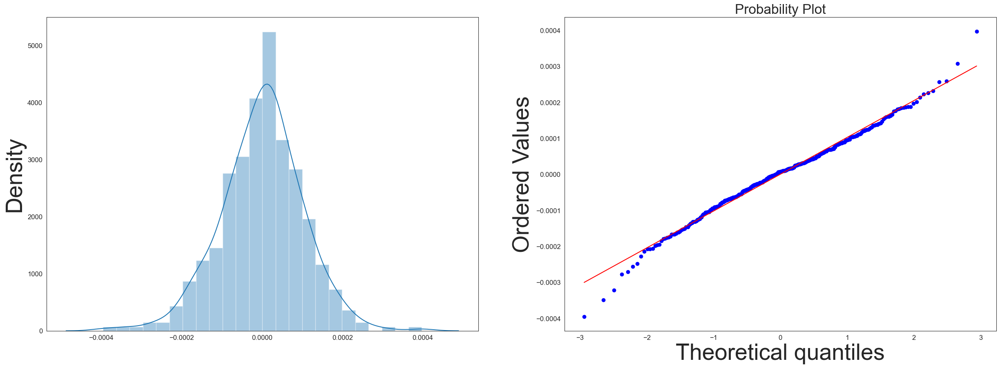

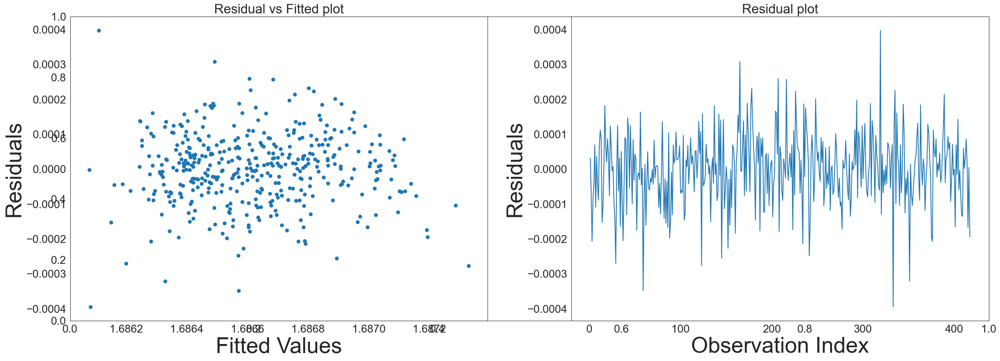

In [779]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_sw, ax=ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals_sw, plot=ax2, fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred_sw, residuals_sw)  # Assuming pred_sw is defined somewhere
plt.title("Residual vs Fitted plot")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")

plt.subplot(1, 2, 2)
plt.plot(residuals_sw)
plt.title("Residual plot")
plt.xlabel("Observation Index")
plt.ylabel("Residuals")
plt.show()

- From the Residual density plot we can see that it is bell-shaped and symmetric around 0.
- From the normal probability plot we can see that there is not much departure from normality except for some extreme values which we will deal with later
- The Residual vs Fitted plot shows a random scattering of points around the zero line, indicating that the model's predictions are unbiased on average across the range of fitted values.
- Error terms seem to have constant variance except for some extreme values

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# Added variable plot

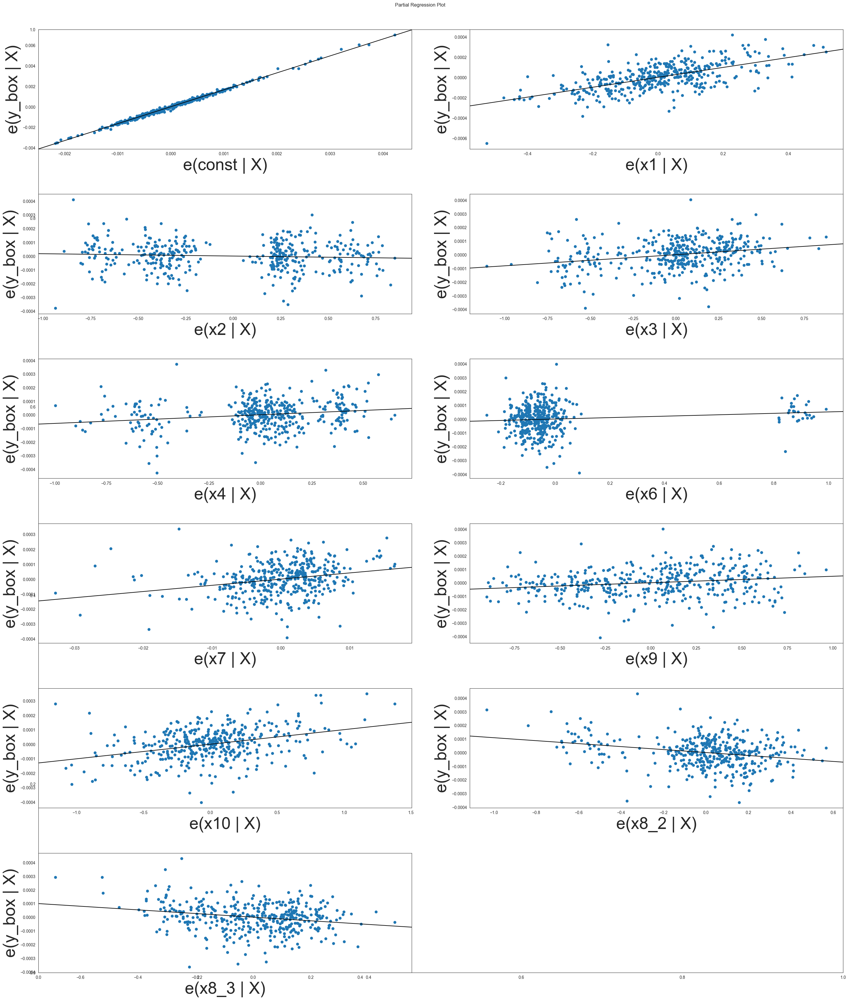

In [784]:
fig = plt.figure(figsize=(30, 35))
ax = fig.add_subplot(111)
sm.graphics.plot_partregress_grid(model_sw, fig=fig)
fig.tight_layout(pad=5)

# Adjust the font size of x and y axis labels
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(10)  # Adjust 10 to your desired font size

plt.show()

Observing the above plots ,['x1', 'x2', 'x3', 'x4', 'x6', 'x7', 'x9', 'x10', 'x8_2', 'x8_3']  inclusion of  columns in the model seems to be reasonable

# X1

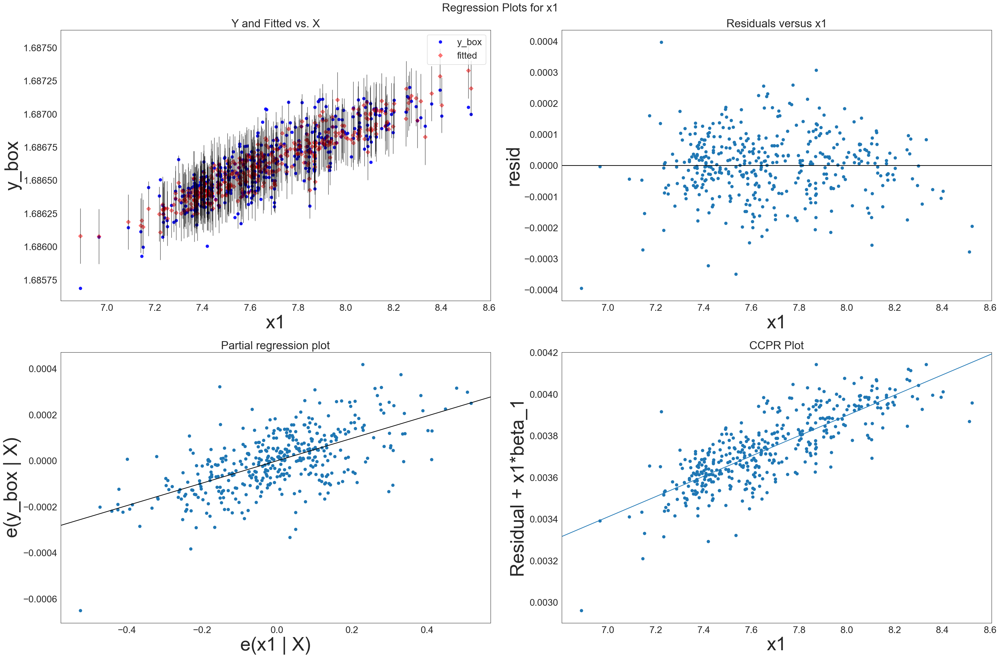

In [785]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '20'
sm.graphics.plot_regress_exog(model_sw, "x1", fig = fig)
fig.tight_layout(pad=1.0)

This residual ·plot suggests that a linear relation for X1 is appropriate in the model already
containing other variables.
From the Partial regression plot, we can observe a positive linear relation for variable X1.

# X7

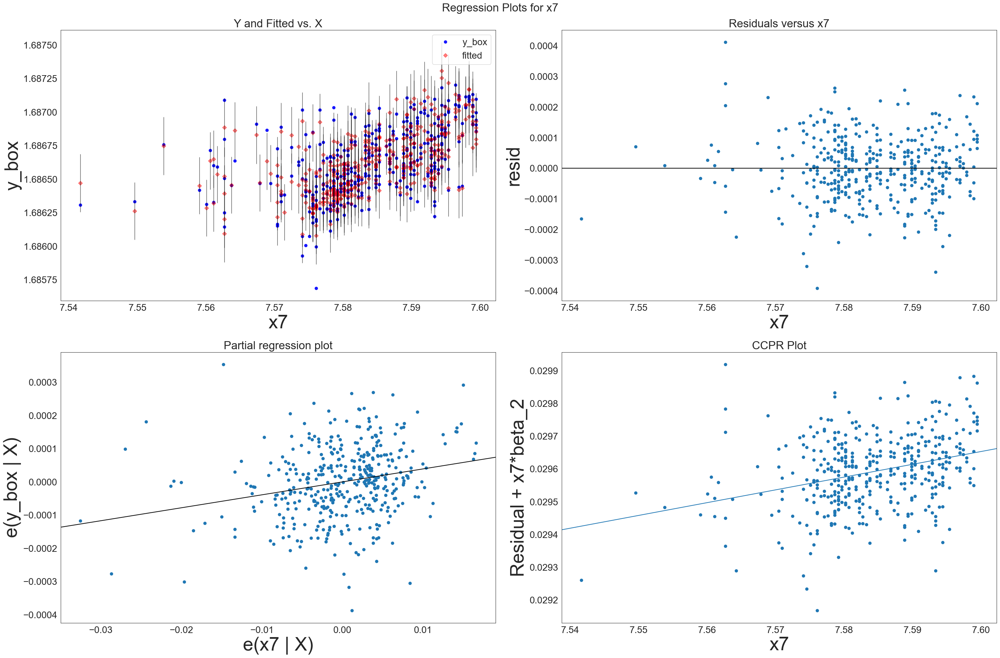

In [605]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '20'
sm.graphics.plot_regress_exog(model_sw, "x7", fig = fig)
fig.tight_layout(pad=1.0)

This residual ·plot suggests that a linear relation for X7 is appropriate in the model already
containing other variables.
From the Partial regression plot, we can observe a positive linear relation for variable X7.

# X10

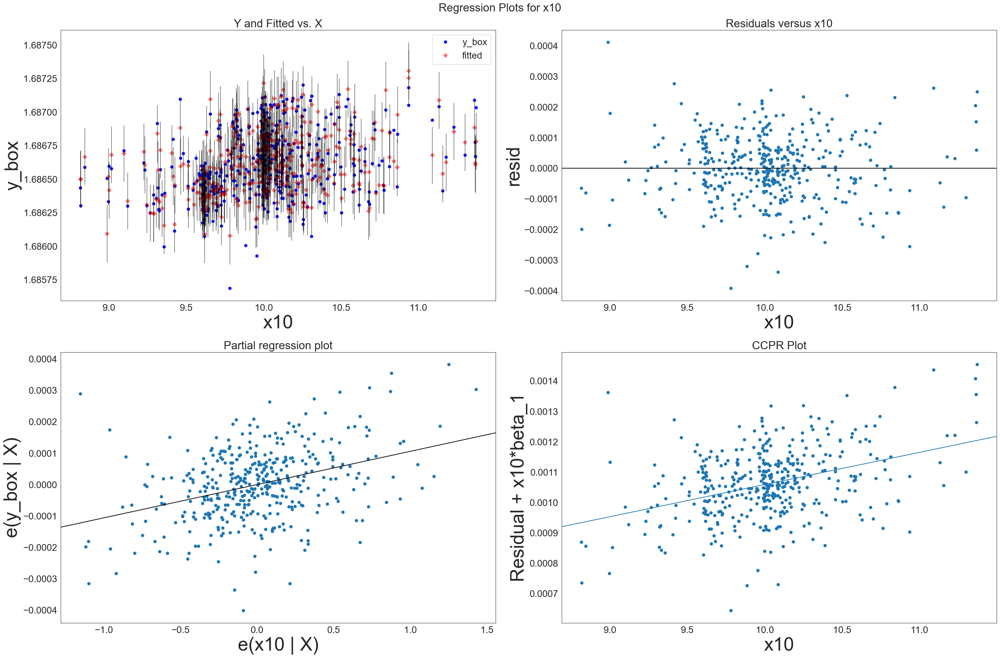

In [606]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '20'
sm.graphics.plot_regress_exog(model_sw, "x10", fig = fig)
fig.tight_layout(pad=1.0)

- This residual ·plot suggests that a linear relation for X10 is appropriate in the model already
  containing other variables.
  From the Partial regression plot, we can observe a positive linear relation for variable X10.

- For categorical predictor variables, added variable plots are not typically used because the concept of adding one unit of a     categorical variable does not apply in the same way as it does for continuous variables.

# Checking for possible interaction terms

In [790]:
final1_X = X_sw
#final1_X.drop(columns = 'const' , inplace=True)
final1_X = final1_X[['x1', 'x2', 'x3', 'x4', 'x6', 'x7', 'x9', 'x10', 'x8_2', 'x8_3']]
final1_X

,x1,x2,x3,x4,x6,x7,x9,x10,x8_2,x8_3
220,7.731931,0,0,1,0,7.578657,1,10.148119,1,0
69,8.294050,1,1,1,1,7.590347,0,10.068790,0,0
374,7.664816,0,1,1,0,7.588830,1,10.629392,1,0
305,7.615791,1,1,1,0,7.580189,1,9.994881,1,0
173,8.196988,0,1,1,0,7.585281,0,10.055479,1,0
...,...,...,...,...,...,...,...,...,...,...
71,8.265907,0,1,1,0,7.596392,0,10.253369,0,0
106,8.165079,0,1,1,0,7.590347,0,9.896815,0,0
270,7.783224,0,1,1,0,7.588830,0,10.699800,1,0
435,7.454720,1,0,1,0,7.575585,1,9.305560,0,1


In [787]:
# scaler = StandardScaler()
# scaled_data = scaler.fit_transform(final1_X)
# final1_standardized = pd.DataFrame(scaled_data, columns=final1_X[['x1','x7','x10']])

# # # Assuming final1_X is your DataFrame containing the original data

for cols in ['x1','x7','x10']:
    final1_X[cols] = final1_X[cols]/np.sqrt(final1_X.shape[0]-1)

In [788]:
final1_standardized = final1_X

In [789]:
final1_standardized

,x1,x2,x3,x4,x6,x7,x9,x10,x8_2,x8_3
220,0.379089,0,0,1,0,0.371574,1,0.497552,1,0
69,0.406649,1,1,1,1,0.372147,0,0.493663,0,0
374,0.375799,0,1,1,0,0.372073,1,0.521149,1,0
305,0.373395,1,1,1,0,0.371649,1,0.490039,1,0
173,0.401890,0,1,1,0,0.371899,0,0.493010,1,0
...,...,...,...,...,...,...,...,...,...,...
71,0.405269,0,1,1,0,0.372444,0,0.502713,0,0
106,0.400326,0,1,1,0,0.372147,0,0.485231,0,0
270,0.381604,0,1,1,0,0.372073,0,0.524601,1,0
435,0.365498,1,0,1,0,0.371424,1,0.456243,0,1


In [791]:
import numpy as np

numerical_cols = ['x1', 'x7', 'x10']
categorical_cols = [ 'x2', 'x3', 'x4', 'x6', 'x9', 'x8_2', 'x8_3']

# Adding squared terms for numerical columns
for col in numerical_cols:
    squared_col = f"{col}^2"
    if squared_col not in final1_standardized.columns:
        final1_standardized[squared_col] = np.square(final1_standardized[col])

# Adding interaction terms
for num_col in numerical_cols:
    for cat_col in categorical_cols:
        interaction_col = f"{num_col}*{cat_col}"
        if interaction_col not in final1_standardized.columns:
            # Convert categorical column to numerical representation
            numerical_cat_col = pd.Categorical(final1_standardized[cat_col]).codes
            final1_standardized[interaction_col] = final1_standardized[num_col] * numerical_cat_col

# Adding interaction terms between numerical columns
for col1 in numerical_cols:
    for col2 in numerical_cols:
        if col1 != col2:
            interaction_col = f"{col1}*{col2}"
            if interaction_col not in final1_standardized.columns:
                final1_standardized[interaction_col] = final1_standardized[col1] * final1_standardized[col2]


In [792]:
#final1_standardized.drop(columns='const')
final1_standardized

,x1,x2,x3,x4,x6,x7,x9,x10,x8_2,x8_3,...,x10*x6,x10*x9,x10*x8_2,x10*x8_3,x1*x7,x1*x10,x7*x1,x7*x10,x10*x1,x10*x7
220,0.379089,0,0,1,0,0.371574,1,0.497552,1,0,...,0.000000,0.497552,0.497552,0.000000,0.140860,0.188617,0.140860,0.184878,0.188617,0.184878
69,0.406649,1,1,1,1,0.372147,0,0.493663,0,0,...,0.493663,0.000000,0.000000,0.000000,0.151333,0.200748,0.151333,0.183715,0.200748,0.183715
374,0.375799,0,1,1,0,0.372073,1,0.521149,1,0,...,0.000000,0.521149,0.521149,0.000000,0.139824,0.195847,0.139824,0.193905,0.195847,0.193905
305,0.373395,1,1,1,0,0.371649,1,0.490039,1,0,...,0.000000,0.490039,0.490039,0.000000,0.138772,0.182978,0.138772,0.182123,0.182978,0.182123
173,0.401890,0,1,1,0,0.371899,0,0.493010,1,0,...,0.000000,0.000000,0.493010,0.000000,0.149463,0.198136,0.149463,0.183350,0.198136,0.183350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0.405269,0,1,1,0,0.372444,0,0.502713,0,0,...,0.000000,0.000000,0.000000,0.000000,0.150940,0.203734,0.150940,0.187232,0.203734,0.187232
106,0.400326,0,1,1,0,0.372147,0,0.485231,0,0,...,0.000000,0.000000,0.000000,0.000000,0.148980,0.194251,0.148980,0.180578,0.194251,0.180578
270,0.381604,0,1,1,0,0.372073,0,0.524601,1,0,...,0.000000,0.000000,0.524601,0.000000,0.141985,0.200190,0.141985,0.195190,0.200190,0.195190
435,0.365498,1,0,1,0,0.371424,1,0.456243,0,1,...,0.000000,0.456243,0.000000,0.456243,0.135754,0.166756,0.135754,0.169459,0.166756,0.169459


In [613]:
Y_sw

220    1.686660
69     1.687056
374    1.686560
305    1.686541
173    1.686861
         ...   
71     1.687201
106    1.687022
270    1.686617
435    1.686358
102    1.686999
Name: y_box, Length: 417, dtype: float64

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [793]:
from sklearn.preprocessing import StandardScaler

# Assuming X_sw contains your numerical features
scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X_sw)

Y_std = (scaler.fit_transform(pd.DataFrame(Y_sw))/np.sqrt(len(Y_sw)-1))

In [794]:
# Assuming Y_stanadrdized contains your standardized target variable
Y_std = pd.DataFrame(Y_std, columns=['y_std'])
Y_std

,y_std
0,0.007695
1,0.084061
2,-0.011432
3,-0.015277
4,0.046538
...,...
412,0.112008
413,0.077458
414,-0.000488
415,-0.050387


In [795]:
# Resetting indices for Y_std and final1_standardized
Y_std.reset_index(drop=True, inplace=True)
final1_standardized.reset_index(drop=True, inplace=True)

# Fitting the model
model_itr = sm.OLS(Y_std, final1_standardized).fit()
pred_itr = model_itr.predict(final1_standardized)

# Calculating residuals
residuals_itr = Y_std - pred_itr  # Use Y_std instead of Y_stanadrdized

# Get summary of the model
summary_itr = model_itr.summary()
print(summary_itr)

                                 OLS Regression Results                                
Dep. Variable:                  y_std   R-squared (uncentered):                   0.857
Model:                            OLS   Adj. R-squared (uncentered):              0.843
Method:                 Least Squares   F-statistic:                              61.59
Date:                Sat, 27 Apr 2024   Prob (F-statistic):                   2.31e-137
Time:                        01:22:21   Log-Likelihood:                          1071.3
No. Observations:                 417   AIC:                                     -2069.
Df Residuals:                     380   BIC:                                     -1919.
Df Model:                          37                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [796]:
attributes =[]
pval = []
for attribute in final1_standardized.columns:
    if model_itr.pvalues[attribute] > 0.05 and attribute in X_sw.columns:
        attributes.append(attribute)
        pval.append(model_itr.pvalues[attribute])

In [797]:
itr_tab = pd.DataFrame({"Attribute":attributes, "p-value":pval})
itr_tab

,Attribute,p-value
0,x1,0.148904
1,x2,0.810697
2,x3,0.346551
3,x4,0.425291
4,x6,0.484970
5,x9,0.217643
6,x10,0.232622
7,x8_2,0.079680


In [798]:
def stepwise_selection(X, y, 
                           initial_list=[], 
                           threshold_in=0.05, 
                           threshold_out = 0.05, 
                           verbose=True):
        """ Perform a forward-backward feature selection 
        based on p-value from statsmodels.api.OLS
        Arguments:
            X - pandas.DataFrame with candidate features
            y - list-like with the target
            initial_list - list of features to start with (column names of X)
            threshold_in - include a feature if its p-value < threshold_in
            threshold_out - exclude a feature if its p-value > threshold_out
            verbose - whether to print the sequence of inclusions and exclusions
        Returns: list of selected features 
        Always set threshold_in < threshold_out to avoid infinite looping.
        See https://en.wikipedia.org/wiki/Stepwise_regression for the details
        """
        included = list(initial_list)
        while True:
            changed=False
            # forward step
            excluded = list(set(X.columns)-set(included))
            new_pval = pd.Series(index=excluded)
            for new_column in excluded:
                model = sm.OLS(y,(pd.DataFrame(X[included+[new_column]]))).fit()
                new_pval[new_column] = model.pvalues[new_column]
            best_pval = new_pval.min()
            if best_pval < threshold_in:
                best_feature = new_pval.idxmin()
                included.append(best_feature)
                changed=True
                if verbose:
                    print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

            # backward step
            model = sm.OLS(y,(pd.DataFrame(X[included]))).fit()
            # use all coefs except intercept
            pvalues = model.pvalues.iloc[1:]
            worst_pval = pvalues.max() # null if pvalues is empty
            if worst_pval > threshold_out:
                changed=True
                worst_feature = pvalues.idxmax()
                included.remove(worst_feature)
                if verbose:
                    print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
            if not changed:
                break
        return included

result = stepwise_selection(final1_standardized, Y_std)

print('resulting features:')
print(result)

Add  x8_3                           with p-value 2.77515e-30
Add  x1*x3                          with p-value 2.01598e-41
Add  x3                             with p-value 6.05992e-33
Add  x1*x8_3                        with p-value 7.5847e-16
Add  x8_2                           with p-value 1.4539e-16
Add  x10^2                          with p-value 5.93475e-09
Add  x1*x8_2                        with p-value 1.64804e-20
Drop x1*x3                          with p-value 0.564178
Add  x7*x8_3                        with p-value 1.29545e-06
Add  x7*x8_2                        with p-value 0.000119883
Add  x10*x9                         with p-value 0.00261394
Add  x10*x4                         with p-value 0.0044034
Add  x10*x8_2                       with p-value 0.00216371
Add  x6                             with p-value 0.00440038
resulting features:
['x8_3', 'x3', 'x1*x8_3', 'x8_2', 'x10^2', 'x1*x8_2', 'x7*x8_3', 'x7*x8_2', 'x10*x9', 'x10*x4', 'x10*x8_2', 'x6']


In [799]:
final_features = ['x8_3', 'x3', 'x1*x8_3', 'x8_2', 'x10^2', 'x1*x8_2', 'x7*x8_3', 'x7*x8_2', 'x10*x9', 'x10*x4', 'x10*x8_2', 'x6']

## These are the final model features with interaction terms
final_features

['x8_3',
 'x3',
 'x1*x8_3',
 'x8_2',
 'x10^2',
 'x1*x8_2',
 'x7*x8_3',
 'x7*x8_2',
 'x10*x9',
 'x10*x4',
 'x10*x8_2',
 'x6']

In [800]:
model_itr2 = sm.OLS(Y_std, final1_standardized[final_features]).fit()
summary_itr2 = model_itr2.summary()
print(summary_itr2)

                                 OLS Regression Results                                
Dep. Variable:                  y_std   R-squared (uncentered):                   0.849
Model:                            OLS   Adj. R-squared (uncentered):              0.845
Method:                 Least Squares   F-statistic:                              190.4
Date:                Sat, 27 Apr 2024   Prob (F-statistic):                   4.39e-158
Time:                        01:23:06   Log-Likelihood:                          1060.4
No. Observations:                 417   AIC:                                     -2097.
Df Residuals:                     405   BIC:                                     -2048.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [801]:
pred_itr2 = model_itr2.predict(final1_standardized[final_features])
pred_itr2 = pd.DataFrame(pred_itr2, columns=['predictions'])
pred_itr2

,predictions
0,-0.000379
1,0.084788
2,0.026662
3,0.000153
4,0.057532
...,...
412,0.075920
413,0.072073
414,0.033004
415,-0.045409


In [802]:
np.array(Y_std)

array([[ 7.69474887e-03],
       [ 8.40613222e-02],
       [-1.14318025e-02],
       [-1.52766732e-02],
       [ 4.65377762e-02],
       [-1.02389662e-02],
       [-1.65108153e-02],
       [ 3.84446801e-02],
       [ 4.77682225e-02],
       [ 1.19344999e-02],
       [ 1.10116603e-02],
       [ 4.25465948e-02],
       [ 5.61008486e-02],
       [-1.20046301e-01],
       [ 1.14744987e-02],
       [-2.56452929e-02],
       [ 9.60583447e-03],
       [ 2.64433740e-02],
       [-1.20501883e-02],
       [-1.84964518e-02],
       [-2.91649941e-02],
       [ 3.19576901e-03],
       [ 9.46123290e-02],
       [-2.91649941e-02],
       [ 2.82571157e-02],
       [-3.70539757e-02],
       [-2.19107916e-02],
       [ 1.92598538e-03],
       [-1.33158443e-01],
       [-1.25482044e-02],
       [-2.69259679e-02],
       [-7.48005705e-02],
       [ 1.89305539e-02],
       [-4.48648932e-02],
       [-3.31034763e-02],
       [-8.35565632e-02],
       [-7.25660904e-03],
       [ 1.23916921e-02],
       [ 4.8

In [803]:
final_features

['x8_3',
 'x3',
 'x1*x8_3',
 'x8_2',
 'x10^2',
 'x1*x8_2',
 'x7*x8_3',
 'x7*x8_2',
 'x10*x9',
 'x10*x4',
 'x10*x8_2',
 'x6']

In [804]:
# Assuming Y_std is a DataFrame or Series and model_itr2.predict() returns a 1D array

# Convert the predicted values to a DataFrame or Series for easier handling
predictions = pd.Series(model_itr2.predict(final1_standardized[final_features]))

# Ensure the shapes are consistent for subtraction
if isinstance(Y_std, pd.DataFrame):
    m = np.array(Y_std.iloc[:, 0]) - np.array(predictions)
elif isinstance(Y_std, pd.Series):
    m = np.array(Y_std) - np.array(predictions)
else:
    raise ValueError("Unsupported data type for Y_std. Must be DataFrame or Series.")

# Create a DataFrame from the residuals
residuals_df = pd.DataFrame(m)
residuals_itr2 =residuals_df


The regression model shows a good overall fit, with approximately 84.3% of the variance in the dependent variable explained by the predictors. The model is statistically significant, indicating that at least one of the predictors has a significant effect on the dependent variable.

Among the predictors, variables such as x8_3, x3, x1*x8_3, x8_2, x10^2, x1*x8_2, x7*x8_3, x7*x8_2, x10*x4, and x10*x8_2 demonstrate significant effects on the dependent variable, as their p-values are less than 0.05. These coefficients provide insights into how each predictor influences the dependent variable, holding other variables constant.

However, there are some potential issues to address. The Jarque-Bera test suggests that the residuals may not be normally distributed, and the large condition number indicates potential multicollinearity problems. Additionally, the Durbin-Watson statistic suggests possible autocorrelation in the residuals.

Overall, while the model shows promise in explaining the variance in the dependent variable, further investigation and potentially model refinement are warranted to address the issues identified.

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [805]:
residuals_itr2

,0
0,0.008073
1,-0.000726
2,-0.038094
3,-0.015430
4,-0.010995
...,...
412,0.036088
413,0.005385
414,-0.033492
415,-0.004978


In [806]:
pred_itr2

,predictions
0,-0.000379
1,0.084788
2,0.026662
3,0.000153
4,0.057532
...,...
412,0.075920
413,0.072073
414,0.033004
415,-0.045409


# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

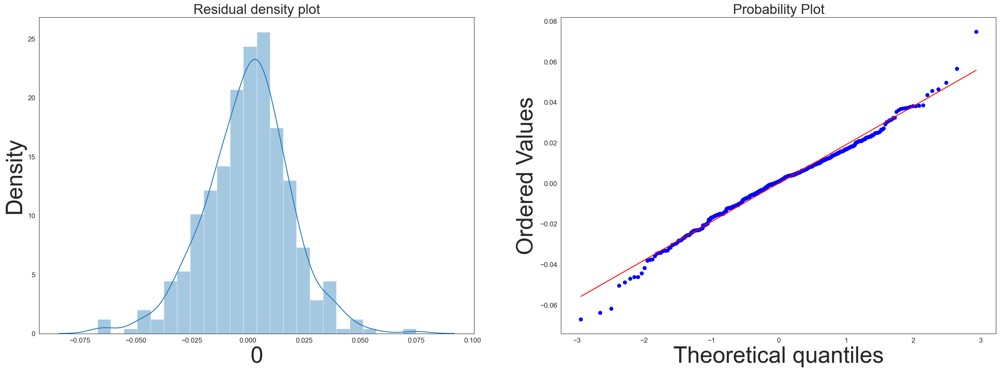

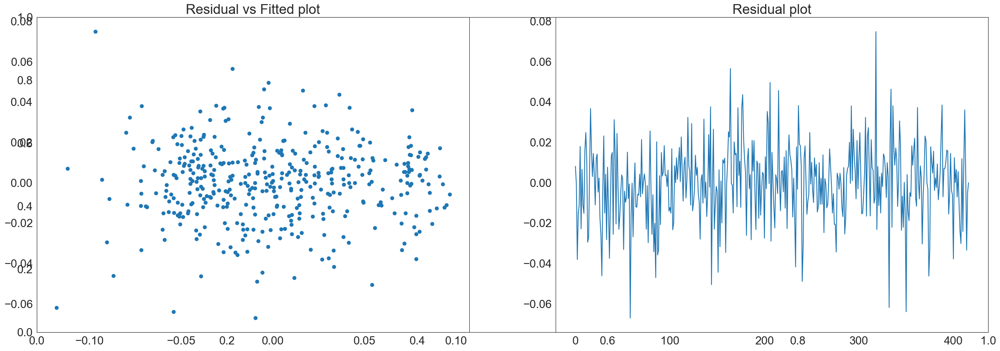

In [909]:
import scipy.stats as stats

# Assuming residuals_itr2 is a DataFrame or Series
if isinstance(residuals_itr2, pd.DataFrame):
    residuals_itr2 = residuals_itr2.iloc[:, 0]  # Extracting the first column if it's a DataFrame
elif not isinstance(residuals_itr2, pd.Series):
    raise ValueError("residuals_itr2 must be a DataFrame or Series.")

# Plotting the Q-Q plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_itr2, ax=ax1)
ax1.set_title("Residual density plot")

stats.probplot(residuals_itr2, plot=ax2, fit=True)
plt.show()

# Plotting Residual vs Fitted and Residual plot
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'

plt.subplot(1, 2, 1)
plt.scatter(pred_itr2, residuals_itr2)
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals_itr2)
plt.title("Residual plot")
plt.show()


- This will be our final model have features ['x8_3', 'x3', 'x1*x8_3', 'x8_2', 'x10^2', 'x1*x8_2', 'x7*x8_3', 'x7*x8_2', 'x10*x9', 'x10*x4', 'x10*x8_2', 'x6']

# OUTLIER DETECTION

In [808]:
import itertools
from itertools import chain, combinations
import statsmodels.formula.api as sm
import scipy.stats as scipystats
import statsmodels.api as sm
import statsmodels.stats.stattools as stools
import statsmodels.stats as stats 
from statsmodels.graphics.regressionplots import *
import copy
from sklearn.model_selection import train_test_split
import math
import time

In [809]:
## Hat matrix diagonal entries
final_model = model_itr2
influence = final_model.get_influence()
h_ii = pd.Series(influence.hat_matrix_diag)

In [810]:
influence = model_itr2.get_influence()
inf_sum = influence.summary_frame()
inf_sum = pd.DataFrame(inf_sum)

In [811]:
inf_sum

,dfb_x8_3,dfb_x3,dfb_x1*x8_3,dfb_x8_2,dfb_x10^2,dfb_x1*x8_2,dfb_x7*x8_3,dfb_x7*x8_2,dfb_x10*x9,dfb_x10*x4,dfb_x10*x8_2,dfb_x6,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.002713,-0.037968,0.004563,0.020609,0.008943,0.022103,-0.002971,-0.021431,0.019908,0.011583,-0.002345,-0.004386,3.155581e-04,0.422580,0.020765,0.061536,0.422151,0.061474
1,-0.000031,0.000207,0.000671,0.000174,-0.003132,0.000781,0.000010,-0.000194,0.001689,0.000189,0.000097,-0.006834,6.874356e-06,-0.038638,0.052362,-0.009083,-0.038591,-0.009071
2,-0.017477,-0.092292,-0.012370,0.088318,0.089045,0.054128,0.018056,-0.085905,-0.110437,-0.028357,-0.203692,0.016948,7.242891e-03,-1.994529,0.021381,-0.294813,-2.001921,-0.295906
3,-0.007274,-0.058683,-0.004235,-0.050604,0.046223,0.029708,0.007455,0.049439,-0.045117,-0.010479,0.012253,0.017148,9.155380e-04,-0.805918,0.016634,-0.104816,-0.805568,-0.104771
4,-0.002049,0.008117,0.002125,-0.008824,-0.001613,-0.074431,0.001985,0.011359,0.008145,-0.009040,0.004841,0.015732,7.093833e-04,-0.576718,0.024955,-0.092264,-0.576242,-0.092188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,-0.013435,0.007776,-0.032182,0.017319,0.174219,-0.030732,0.014531,-0.016029,-0.110588,0.005908,-0.034178,-0.047343,7.620192e-03,1.892889,0.024886,0.302394,1.898969,0.303366
413,-0.001164,0.003854,-0.004774,0.003005,0.021649,-0.005197,0.001327,-0.002806,-0.015013,0.002235,-0.004251,-0.006823,1.479204e-04,0.281996,0.021834,0.042131,0.281675,0.042083
414,-0.010074,-0.033848,0.028949,0.062317,0.010628,0.032767,0.008893,-0.058690,0.113863,-0.031986,-0.215064,0.028622,6.141462e-03,-1.755352,0.023359,-0.271473,-1.759891,-0.272175
415,-0.011789,-0.002181,-0.000622,-0.002735,0.018129,-0.000842,0.011882,0.002876,-0.004694,-0.021531,-0.004471,0.001434,8.826070e-05,-0.259862,0.015442,-0.032544,-0.259563,-0.032507


In [812]:
student_resid = influence.resid_studentized_external
(cooks, p) = influence.cooks_distance
(dffits, p) = influence.dffits
leverage = influence.hat_matrix_diag

In [813]:
inf_sum = inf_sum[['standard_resid', 'student_resid', 'hat_diag', 'cooks_d', 'dffits_internal', 'dffits']]
inf_sum

,standard_resid,student_resid,hat_diag,cooks_d,dffits_internal,dffits
0,0.422580,0.422151,0.020765,3.155581e-04,0.061536,0.061474
1,-0.038638,-0.038591,0.052362,6.874356e-06,-0.009083,-0.009071
2,-1.994529,-2.001921,0.021381,7.242891e-03,-0.294813,-0.295906
3,-0.805918,-0.805568,0.016634,9.155380e-04,-0.104816,-0.104771
4,-0.576718,-0.576242,0.024955,7.093833e-04,-0.092264,-0.092188
...,...,...,...,...,...,...
412,1.892889,1.898969,0.024886,7.620192e-03,0.302394,0.303366
413,0.281996,0.281675,0.021834,1.479204e-04,0.042131,0.042083
414,-1.755352,-1.759891,0.023359,6.141462e-03,-0.271473,-0.272175
415,-0.259862,-0.259563,0.015442,8.826070e-05,-0.032544,-0.032507


In [814]:
inf_sum['y'] = (Y_std)

In [815]:
inf_sum

,standard_resid,student_resid,hat_diag,cooks_d,dffits_internal,dffits,y
0,0.422580,0.422151,0.020765,3.155581e-04,0.061536,0.061474,0.007695
1,-0.038638,-0.038591,0.052362,6.874356e-06,-0.009083,-0.009071,0.084061
2,-1.994529,-2.001921,0.021381,7.242891e-03,-0.294813,-0.295906,-0.011432
3,-0.805918,-0.805568,0.016634,9.155380e-04,-0.104816,-0.104771,-0.015277
4,-0.576718,-0.576242,0.024955,7.093833e-04,-0.092264,-0.092188,0.046538
...,...,...,...,...,...,...,...
412,1.892889,1.898969,0.024886,7.620192e-03,0.302394,0.303366,0.112008
413,0.281996,0.281675,0.021834,1.479204e-04,0.042131,0.042083,0.077458
414,-1.755352,-1.759891,0.023359,6.141462e-03,-0.271473,-0.272175,-0.000488
415,-0.259862,-0.259563,0.015442,8.826070e-05,-0.032544,-0.032507,-0.050387


Text(0, 0.5, 'Studentized Residuals')

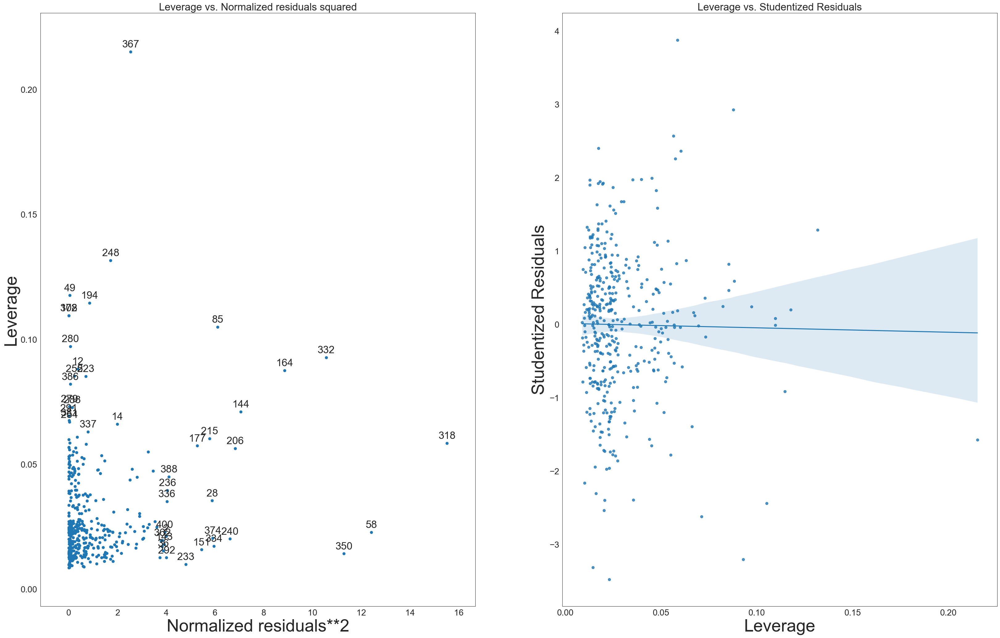

In [816]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 25))
plt.rcParams['font.size'] = '20'
plt.rc('axes', labelsize = 40)
plot_leverage_resid2(final_model, ax=ax1)

plt.rcParams['font.size'] = '20'
sns.regplot(x=leverage, y=final_model.resid_pearson, ax=ax2)
plt.title('Leverage vs. Studentized Residuals')
plt.xlabel('Leverage')
plt.ylabel('Studentized Residuals')

# Use of hat matrix for identifying outlying observations 
Considering the observations with large residuals and high leverage values as influential. We 
plotted the flowing plots to visualize the influential observations

We can clearly notice many outlying cases with high leverage values in plots. Any 
observation with leverage value greater than 2p/n is considered to be outlying in their X 
values. Given below are the values and index with leverage values greater than 2p/n –


# Residual Method

In [639]:
r = inf_sum.student_resid
print ('-'*30 + ' studentized residual ' + '-'*30)
print (r.describe())
print ('\n')

r_sort = inf_sum.sort_values(by = 'student_resid')
print ('-'*20 + ' top 5 most negative stundentized residuals ' + '-'*20)
print (r_sort['student_resid'].head())
print ('\n')

print ('-'*20 + ' top 5 most positive studentized residuals ' + '-'*20)
print (r_sort['student_resid'].tail())

------------------------------ studentized residual ------------------------------
count    417.000000
mean      -0.003332
std        1.008495
min       -3.462294
25%       -0.612257
50%        0.044455
75%        0.572323
max        4.028973
Name: student_resid, dtype: float64


-------------------- top 5 most negative stundentized residuals --------------------
332   -3.462294
58    -3.367213
350   -3.268387
144   -2.572425
240   -2.464184
Name: student_resid, dtype: float64


-------------------- top 5 most positive studentized residuals --------------------
177    2.365062
215    2.514388
334    2.523808
164    2.774231
318    4.028973
Name: student_resid, dtype: float64


In [817]:
## printing y values which is outlier

print (inf_sum.y[abs(r) > 2])

28    -0.133158
58    -0.076741
85    -0.035421
144    0.003452
151   -0.050293
159   -0.055240
164    0.034401
176    0.035230
177    0.079713
206    0.047197
215    0.061923
233   -0.008407
236    0.007203
240   -0.057656
292    0.060631
318   -0.021911
332   -0.179878
334    0.041508
350   -0.118280
362    0.078947
374   -0.085527
388    0.067296
Name: y, dtype: float64


Now that we identified outliers, we need to see which observations can be considered to have leverage values. As discussed earlier, the leverage cutoff can be calculated as (2k+2)/n where k is the number of predictors and n is the sample size.

In [818]:
final_features

['x8_3',
 'x3',
 'x1*x8_3',
 'x8_2',
 'x10^2',
 'x1*x8_2',
 'x7*x8_3',
 'x7*x8_2',
 'x10*x9',
 'x10*x4',
 'x10*x8_2',
 'x6']

In [819]:
#Identify high leverage
#point with leverage = (2k+2)/n 
#k = number of predictors (11)
#n = number of observations (506)
# ((2*12)+2)/264 = 0.09848 any numbner higher than this is high leverage
thres_hii= 2*(len(final_features)+1)/len(inf_sum.y)
inf_hii = pd.DataFrame(inf_sum[['y', 'hat_diag']][abs(inf_sum.hat_diag) > thres_hii])
inf_hii

,y,hat_diag
12,0.056101,0.088251
14,0.011474,0.066160
49,0.026443,0.117646
85,-0.035421,0.105051
108,-0.091658,0.109598
144,0.003452,0.071055
164,0.034401,0.087630
194,-0.003284,0.114673
223,0.018092,0.085310
248,-0.055140,0.131688


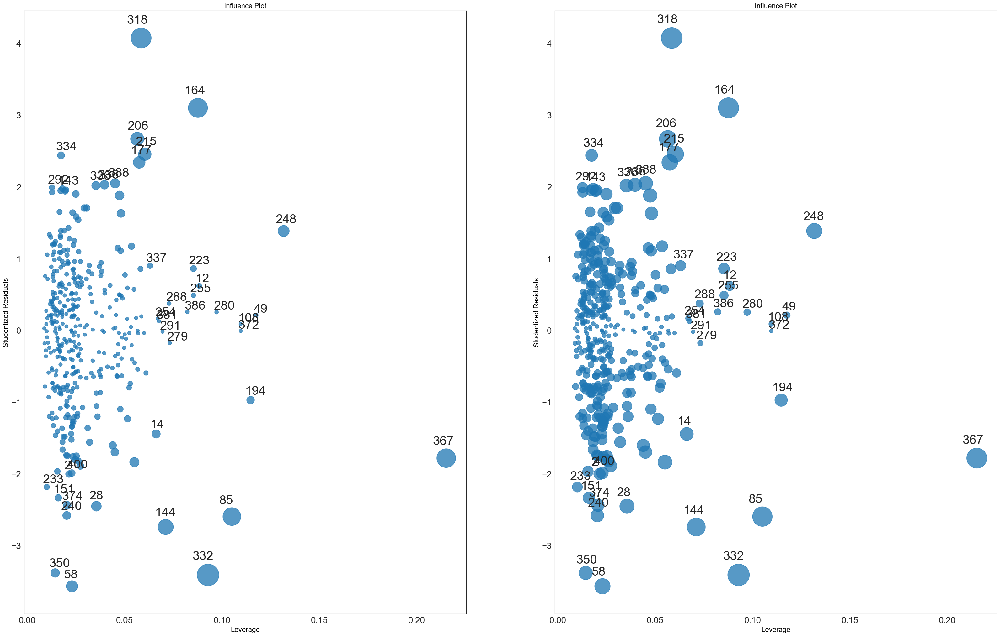

In [820]:
#Plot influential observations by cooks distance
#Use residual squared to restrict the graph but preserve the relative position of observations

from statsmodels.graphics.regressionplots import *
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 25))
plt.rcParams['font.size'] = '20'
plt.rc('figure', titlesize = 30)
influence_plot(final_model, ax=ax1, size=50)


plt.rcParams['font.size'] = '20'
influence_plot(final_model, ax=ax2, size=50, criterion='DFFITS')
plt.show()

# Identifying Influential Cases-DFFITS, Cook's Distance~ and DFBETAS Measures
- DFFITS :
As a guideline for identifying influential cases, we suggest considering a case influential 
if the absolute value of DFFITS exceeds 1 for small to medium data sets and 2*root(P/n). In for 
large data sets.


- Cook's Distance :
We have used the thumb rule that Cook's Distance of more than 3 times the mean is a possible outlier. Based on the rule we have decided.

- DFBETAS :
As a guideline for identifying influential cases, 
we recommend considering a case influential if the absolute value of DFBETAS exceeds 1 
for small to medium data sets and 2/root(n) for large data sets.


# DFFITS

In [821]:
## Influential cases by DFFITS
print(final_features)
thres_dfts = 2*math.sqrt((len(final_features)+1)/len(inf_sum.y))
inf_dffits = pd.DataFrame(inf_sum[['y','dffits']][abs(inf_sum.dffits) > thres_dfts])
inf_dffits                         

['x8_3', 'x3', 'x1*x8_3', 'x8_2', 'x10^2', 'x1*x8_2', 'x7*x8_3', 'x7*x8_2', 'x10*x9', 'x10*x4', 'x10*x8_2', 'x6']


,y,dffits
14,0.011474,-0.384249
28,-0.133158,-0.470008
58,-0.076741,-0.545586
85,-0.035421,-0.889146
144,0.003452,-0.757892
164,0.034401,0.960644
177,0.079713,0.577747
203,-0.004351,0.419179
206,0.047197,0.652410
215,0.061923,0.622109


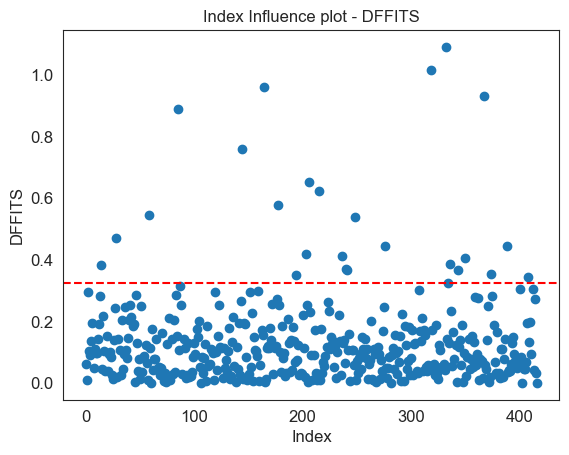

In [822]:
import matplotlib.pyplot as plt

thres_dfts = 0.3248

plt.scatter(x=range(0, len(inf_sum.y)), y=abs(inf_sum.dffits))
plt.axhline(y=thres_dfts, color='r', linestyle='--')

plt.xlabel("Index", fontsize=12)  # Set xlabel with fontsize
plt.ylabel("DFFITS", fontsize=12)  # Set ylabel with fontsize
plt.title("Index Influence plot - DFFITS", fontsize=12)  # Set title with fontsize

plt.xticks(fontsize=12)  # Set x-axis tick font size
plt.yticks(fontsize=12)  # Set y-axis tick font size

plt.show()

Observations above the red line are Influential cases according to DFFITS.

# COOK'S DISTANCE

In [823]:
#Cook's D of more than 3 times the mean is a possible outlier

import scipy
thres_cooks = 3*inf_sum.cooks_d.mean()
inf_cooks=pd.DataFrame((inf_sum[['y', 'cooks_d']][abs(inf_sum.cooks_d) > thres_cooks]))
inf_cooks

,y,cooks_d
14,0.011474,0.012271
28,-0.133158,0.018184
58,-0.076741,0.024108
85,-0.035421,0.064962
144,0.003452,0.047110
164,0.034401,0.075303
177,0.079713,0.027512
194,-0.003284,0.010198
203,-0.004351,0.014552
206,0.047197,0.034942


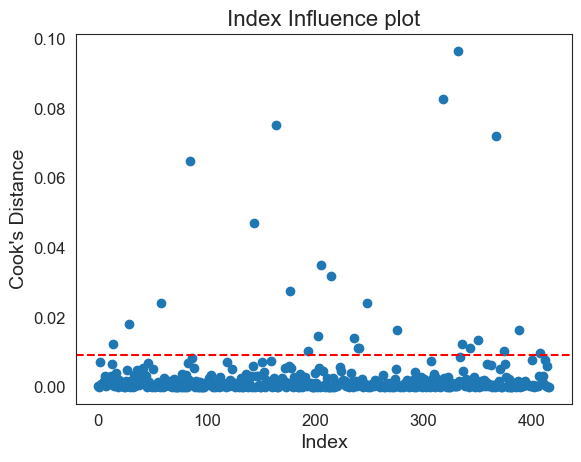

In [824]:
import matplotlib.pyplot as plt

plt.scatter(x=range(0, len(inf_sum.y)), y=inf_sum.cooks_d)
plt.axhline(y=thres_cooks, color='r', linestyle='--')

plt.xlabel("Index", fontsize=14)  # Adjust xlabel fontsize as needed
plt.ylabel("Cook's Distance", fontsize=14)  # Adjust ylabel fontsize as needed
plt.title("Index Influence plot", fontsize=16)  # Adjust title fontsize as needed

# Adjusting tick font size using rcParams
plt.rcParams['font.size'] = 12  # Adjust tick label fontsize as needed
plt.xticks(fontsize=12)  # Set x-axis tick font size
plt.yticks(fontsize=12)
plt.show()

In [825]:
thres_cooks

0.009289501296862332

# DFBETAS

In [826]:
# ## Influential cases by DFBETAS
# n=417
# thres_dfbts=2/math.sqrt(n) 
# inf_dfbts = pd.DataFrame(inf_sum[['y','df']][abs(inf_sum.dffits) > thres_dfts])
# inf_dffits    

In [827]:
# plt.scatter(x= range(0,len(inf_sum.y)), y = abs(inf_sum.dfbts))
# plt.axhline(y = thres_dfbts, color = 'r', linestyle = '--')
# plt.rcParams['font.size'] = '20'
# plt.xlabel("Index")
# plt.ylabel("DFBETAS")
# plt.title("Index Influece plot - DFBETAS")

In [828]:
final1_standardized[final_features]

,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6
0,0,0,0.000000,1,0.247558,0.379089,0.000000,0.371574,0.497552,0.497552,0.497552,0
1,0,1,0.000000,0,0.243703,0.000000,0.000000,0.000000,0.000000,0.493663,0.000000,1
2,0,1,0.000000,1,0.271596,0.375799,0.000000,0.372073,0.521149,0.521149,0.521149,0
3,0,1,0.000000,1,0.240139,0.373395,0.000000,0.371649,0.490039,0.490039,0.490039,0
4,0,1,0.000000,1,0.243059,0.401890,0.000000,0.371899,0.000000,0.493010,0.493010,0
...,...,...,...,...,...,...,...,...,...,...,...,...
412,0,1,0.000000,0,0.252720,0.000000,0.000000,0.000000,0.000000,0.502713,0.000000,0
413,0,1,0.000000,0,0.235449,0.000000,0.000000,0.000000,0.000000,0.485231,0.000000,0
414,0,1,0.000000,1,0.275206,0.381604,0.000000,0.372073,0.000000,0.524601,0.524601,0
415,1,0,0.365498,0,0.208157,0.000000,0.371424,0.000000,0.456243,0.456243,0.000000,0


# Removing outliers


In [829]:
X_final = final1_standardized[final_features].drop(list(inf_cooks.index), inplace= False)
X_final

,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6
0,0,0,0.000000,1,0.247558,0.379089,0.000000,0.371574,0.497552,0.497552,0.497552,0
1,0,1,0.000000,0,0.243703,0.000000,0.000000,0.000000,0.000000,0.493663,0.000000,1
2,0,1,0.000000,1,0.271596,0.375799,0.000000,0.372073,0.521149,0.521149,0.521149,0
3,0,1,0.000000,1,0.240139,0.373395,0.000000,0.371649,0.490039,0.490039,0.490039,0
4,0,1,0.000000,1,0.243059,0.401890,0.000000,0.371899,0.000000,0.493010,0.493010,0
...,...,...,...,...,...,...,...,...,...,...,...,...
412,0,1,0.000000,0,0.252720,0.000000,0.000000,0.000000,0.000000,0.502713,0.000000,0
413,0,1,0.000000,0,0.235449,0.000000,0.000000,0.000000,0.000000,0.485231,0.000000,0
414,0,1,0.000000,1,0.275206,0.381604,0.000000,0.372073,0.000000,0.524601,0.524601,0
415,1,0,0.365498,0,0.208157,0.000000,0.371424,0.000000,0.456243,0.456243,0.000000,0


In [830]:
Y_final = pd.DataFrame(Y_std)
Y_final

,y_std
0,0.007695
1,0.084061
2,-0.011432
3,-0.015277
4,0.046538
...,...
412,0.112008
413,0.077458
414,-0.000488
415,-0.050387


In [831]:
Y_final.drop(list(inf_cooks.index) , inplace = True)
Y_final

,y_std
0,0.007695
1,0.084061
2,-0.011432
3,-0.015277
4,0.046538
...,...
412,0.112008
413,0.077458
414,-0.000488
415,-0.050387


In [832]:
X_final

,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6
0,0,0,0.000000,1,0.247558,0.379089,0.000000,0.371574,0.497552,0.497552,0.497552,0
1,0,1,0.000000,0,0.243703,0.000000,0.000000,0.000000,0.000000,0.493663,0.000000,1
2,0,1,0.000000,1,0.271596,0.375799,0.000000,0.372073,0.521149,0.521149,0.521149,0
3,0,1,0.000000,1,0.240139,0.373395,0.000000,0.371649,0.490039,0.490039,0.490039,0
4,0,1,0.000000,1,0.243059,0.401890,0.000000,0.371899,0.000000,0.493010,0.493010,0
...,...,...,...,...,...,...,...,...,...,...,...,...
412,0,1,0.000000,0,0.252720,0.000000,0.000000,0.000000,0.000000,0.502713,0.000000,0
413,0,1,0.000000,0,0.235449,0.000000,0.000000,0.000000,0.000000,0.485231,0.000000,0
414,0,1,0.000000,1,0.275206,0.381604,0.000000,0.372073,0.000000,0.524601,0.524601,0
415,1,0,0.365498,0,0.208157,0.000000,0.371424,0.000000,0.456243,0.456243,0.000000,0


# ~~~~~~~~~~~~~~~Building Final Model~~~~~~~~~~~~~~~~~~~~

In [833]:
my_model_final = sm.OLS(Y_final['y_std'], X_final[final_features]).fit()
my_pred_final = my_model_final.predict(X_final[final_features])
my_residuals_final = Y_final['y_std'] - my_model_final.predict(X_final[final_features])
my_summary_final = my_model_final.summary()
print(my_summary_final)

                                 OLS Regression Results                                
Dep. Variable:                  y_std   R-squared (uncentered):                   0.888
Model:                            OLS   Adj. R-squared (uncentered):              0.885
Method:                 Least Squares   F-statistic:                              252.1
Date:                Sat, 27 Apr 2024   Prob (F-statistic):                   1.43e-172
Time:                        01:24:32   Log-Likelihood:                          1067.8
No. Observations:                 392   AIC:                                     -2112.
Df Residuals:                     380   BIC:                                     -2064.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

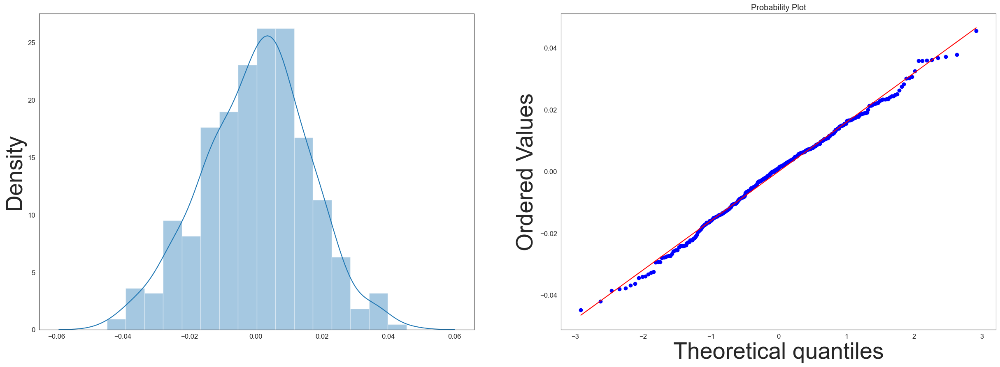

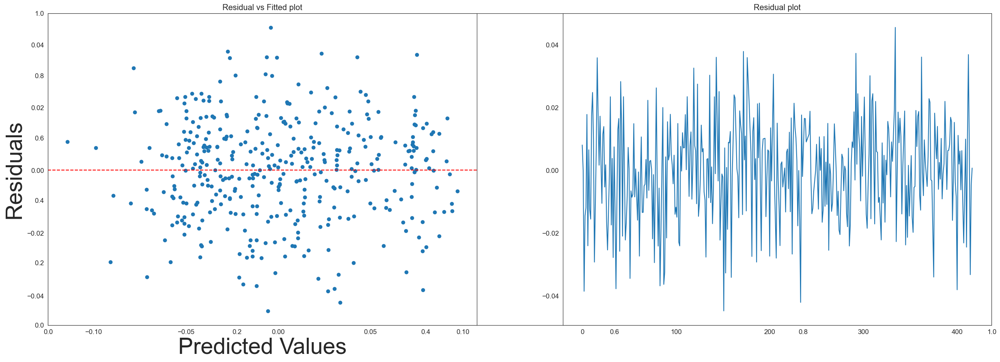

In [834]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
#plt.rcParams['font.size'] = '20'
sns.distplot(my_residuals_final, ax = ax1)
plt.title("Residual density plot")

sp.stats.probplot(my_residuals_final,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
#plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(my_pred_final,my_residuals_final)
plt.title("Residual vs Fitted plot")
# Draw a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")


plt.subplot(1, 2, 2)
plt.plot(my_residuals_final)
plt.title("Residual plot")
plt.show()

# Multicollinearity Detection

In [835]:
X_final

,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6
0,0,0,0.000000,1,0.247558,0.379089,0.000000,0.371574,0.497552,0.497552,0.497552,0
1,0,1,0.000000,0,0.243703,0.000000,0.000000,0.000000,0.000000,0.493663,0.000000,1
2,0,1,0.000000,1,0.271596,0.375799,0.000000,0.372073,0.521149,0.521149,0.521149,0
3,0,1,0.000000,1,0.240139,0.373395,0.000000,0.371649,0.490039,0.490039,0.490039,0
4,0,1,0.000000,1,0.243059,0.401890,0.000000,0.371899,0.000000,0.493010,0.493010,0
...,...,...,...,...,...,...,...,...,...,...,...,...
412,0,1,0.000000,0,0.252720,0.000000,0.000000,0.000000,0.000000,0.502713,0.000000,0
413,0,1,0.000000,0,0.235449,0.000000,0.000000,0.000000,0.000000,0.485231,0.000000,0
414,0,1,0.000000,1,0.275206,0.381604,0.000000,0.372073,0.000000,0.524601,0.524601,0
415,1,0,0.365498,0,0.208157,0.000000,0.371424,0.000000,0.456243,0.456243,0.000000,0


In [836]:
# Function to calculate VIF
def calculate_vif(data):
    vif_df = pd.DataFrame(columns = ['Var', 'Vif'])
    x_var_names = data.columns
    for i in range(0, x_var_names.shape[0]):
        y = data[x_var_names[i]]
        x = data[x_var_names.drop([x_var_names[i]])]
        r_squared = sm.OLS(y,x).fit().rsquared
        vif = round(1/(1-r_squared),2)
        vif_df.loc[i] = [x_var_names[i], vif]
    return vif_df.sort_values(by = 'Vif', axis = 0, ascending=False, inplace=False)

lm = sm.OLS(Y_final['y_std'], X_final).fit()
calculate_vif(X_final)

,Var,Vif
0,x8_3,2008491.62
6,x7*x8_3,1986220.71
3,x8_2,1358710.37
7,x7*x8_2,1349106.68
2,x1*x8_3,2972.42
5,x1*x8_2,1557.23
10,x10*x8_2,900.91
4,x10^2,26.66
9,x10*x4,9.67
1,x3,5.24


- x8_3 and x8_2 seem to have extremely high VIF values, indicating severe multicollinearity.
The interaction terms involving x7 and x8_3, as well as x7 and x8_2, also have high VIF values, suggesting further multicollinearity issues.

In [837]:
vif_df = pd.DataFrame(calculate_vif(X_final))
vif_df

,Var,Vif
0,x8_3,2008491.62
6,x7*x8_3,1986220.71
3,x8_2,1358710.37
7,x7*x8_2,1349106.68
2,x1*x8_3,2972.42
5,x1*x8_2,1557.23
10,x10*x8_2,900.91
4,x10^2,26.66
9,x10*x4,9.67
1,x3,5.24


In [936]:
# Assuming you have your VIF values stored in a DataFrame named vif_df with columns 'Var' and 'Vif'
# Example:
# vif_df = your_dataframe_containing_vif_values

# Set a threshold for high VIF values
threshold = 10

# Filter out variables with VIF values above the threshold
high_vif_variables = vif_df[vif_df['Vif'] > threshold]['Var'].tolist()

# Print the variables with high VIF values
print("Variables with high VIF values:")
print(high_vif_variables)


Variables with high VIF values:
['x8_3', 'x7*x8_3', 'x8_2', 'x7*x8_2', 'x1*x8_3', 'x1*x8_2', 'x10*x8_2', 'x10^2']


In [937]:
# Assuming your DataFrame is named 'data'
# X_final = X_final.drop(columns=high_vif_variables)
# X_final
df=X_final.drop(columns=high_vif_variables)

In [840]:
df

,x3,x10*x9,x10*x4,x6
0,0,0.497552,0.497552,0
1,1,0.000000,0.493663,1
2,1,0.521149,0.521149,0
3,1,0.490039,0.490039,0
4,1,0.000000,0.493010,0
...,...,...,...,...
412,1,0.000000,0.502713,0
413,1,0.000000,0.485231,0
414,1,0.000000,0.524601,0
415,0,0.456243,0.456243,0


# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [938]:
ridge = Ridge(alpha=1.0)  # You can adjust the regularization strength (alpha) as needed
ridge.fit(X_final, Y_final)
ridge_pred = ridge.predict(X_final)


In [939]:
ridge_r2 = ridge.score(X_final, Y_final)
print("Ridge Regression - Train R-squared:", ridge_r2)

Ridge Regression - Train R-squared: 0.7206954756295029


In [940]:
ridge_model_final = Ridge(alpha=1.0)  # You can adjust the regularization strength (alpha) as needed
ridge_model_final.fit(X_final[final_features], Y_final['y_std'])

# Predict
my_pred_final = ridge_model_final.predict(X_final[final_features])

# Calculate residuals
my_residuals_final = Y_final['y_std'] - my_pred_final

# Create OLS summary-like output
X_final_with_const = sm.add_constant(X_final[final_features])
my_model_final = sm.OLS(Y_final['y_std'], X_final_with_const)
my_model_final_fitted = my_model_final.fit()

print(my_model_final_fitted.summary())

                            OLS Regression Results                            
Dep. Variable:                  y_std   R-squared:                       0.888
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     251.7
Date:                Sat, 27 Apr 2024   Prob (F-statistic):          3.53e-172
Time:                        02:20:39   Log-Likelihood:                 1068.2
No. Observations:                 392   AIC:                            -2110.
Df Residuals:                     379   BIC:                            -2059.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0153      0.017     -0.891      0.3

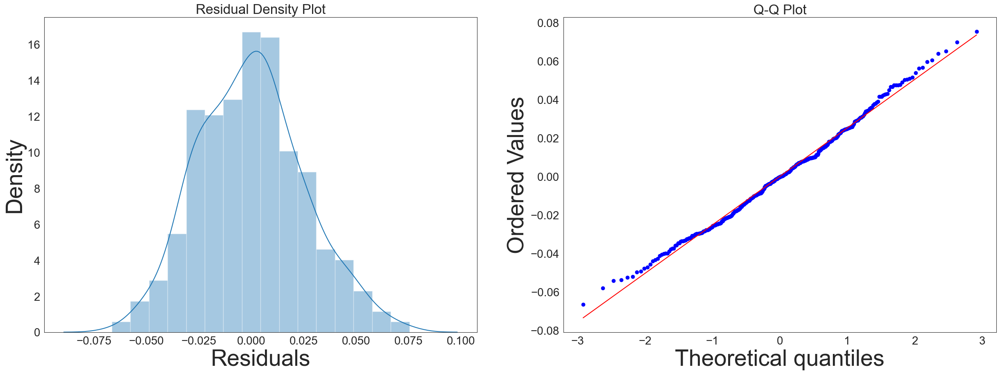

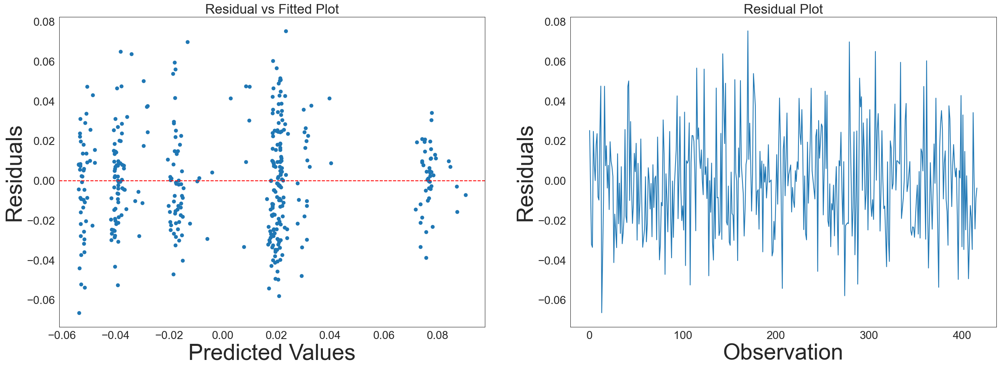

In [944]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sps

# Assuming my_residuals_final, my_pred_final are already computed

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

# Plot residual density plot
sns.distplot(my_residuals_final, ax=ax1)
ax1.set_title("Residual Density Plot")
ax1.set_xlabel("Residuals")
ax1.set_ylabel("Density")

# Q-Q plot
sps.probplot(my_residuals_final, plot=ax2, fit=True)
ax2.set_title("Q-Q Plot")

plt.show()

# Residual vs Fitted plot and Residual plot
plt.figure(figsize=(30, 10))

# Residual vs Fitted plot
plt.subplot(1, 2, 1)
plt.scatter(my_pred_final, my_residuals_final)
plt.title("Residual vs Fitted Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")

# Residual plot
plt.subplot(1, 2, 2)
plt.plot(my_residuals_final)
plt.title("Residual Plot")
plt.xlabel("Observation")
plt.ylabel("Residuals")

plt.show()


# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

# Ridge Regression

In [910]:
from numpy import arange
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import RepeatedKFold

In [911]:
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

#define model
model_ridge = RidgeCV(alphas=arange(0.01, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error')

#fit model
model_ridge.fit(X_final, Y_final['y_std'])

#display lambda that produced the lowest test MSE
print(model_ridge.alpha_)

0.01


In [913]:
X_final.columns

Index(['x8_3', 'x3', 'x1*x8_3', 'x8_2', 'x10^2', 'x1*x8_2', 'x7*x8_3',
       'x7*x8_2', 'x10*x9', 'x10*x4', 'x10*x8_2', 'x6'],
      dtype='object')

In [915]:
mod_coeff = []
lst=np.arange(0,1,0.05)
for i in range(len(lst)):
    model = Ridge(alpha=lst[i])
# fit model
    model.fit(X_final,Y_final['y_std'])
# define new data
    model_coeff=model.coef_
    mod_coeff.append(model_coeff)

In [916]:
mod_coeff

[array([-9.26315131e+00,  1.41353875e-02,  2.56048104e+00, -8.04354707e+00,
         2.68754462e-01,  2.13364095e+00,  2.21428303e+01,  1.90636432e+01,
         1.59115988e-02,  1.68752791e-02,  1.67018039e-01,  1.09809161e-02]),
 array([-0.12801911,  0.03066013,  0.17369957, -0.24565652,  0.30165626,
         0.53700453, -0.04465085, -0.08392908, -0.00412117,  0.03145705,
         0.03207799,  0.01071195]),
 array([-0.09678352,  0.03294474,  0.08228672, -0.1670572 ,  0.23990739,
         0.30053539, -0.03462494, -0.05853053, -0.00540404,  0.03043692,
         0.03576919,  0.01064668]),
 array([-0.08568915,  0.03393267,  0.04966577, -0.13350304,  0.19933884,
         0.20529871, -0.03099971, -0.04730699, -0.00569544,  0.02980535,
         0.03261934,  0.0105585 ]),
 array([-0.07995306,  0.03450156,  0.0327625 , -0.11433526,  0.17069452,
         0.15402975, -0.02910495, -0.04079554, -0.00575483,  0.02935739,
         0.02836163,  0.01048072]),
 array([-0.07641973,  0.03487973,  0.02237

In [917]:
Ridge_estimated_params = pd.DataFrame(mod_coeff,columns=final_features)
Ridge_estimated_params.insert(0,'C', lst )
Ridge_estimated_params

,C,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6
0,0.00,-9.263151,0.014135,2.560481,-8.043547,0.268754,2.133641,22.142830,19.063643,0.015912,0.016875,0.167018,0.010981
1,0.05,-0.128019,0.030660,0.173700,-0.245657,0.301656,0.537005,-0.044651,-0.083929,-0.004121,0.031457,0.032078,0.010712
2,0.10,-0.096784,0.032945,0.082287,-0.167057,0.239907,0.300535,-0.034625,-0.058531,-0.005404,0.030437,0.035769,0.010647
3,0.15,-0.085689,0.033933,0.049666,-0.133503,0.199339,0.205299,-0.031000,-0.047307,-0.005695,0.029805,0.032619,0.010558
4,0.20,-0.079953,0.034502,0.032762,-0.114335,0.170695,0.154030,-0.029105,-0.040796,-0.005755,0.029357,0.028362,0.010481
5,0.25,-0.076420,0.034880,0.022376,-0.101755,0.149344,0.122055,-0.027928,-0.036481,-0.005743,0.029013,0.024294,0.010415
6,0.30,-0.074006,0.035154,0.015331,-0.092792,0.132794,0.100236,-0.027119,-0.033388,-0.005707,0.028735,0.020690,0.010359
7,0.35,-0.072240,0.035365,0.010233,-0.086049,0.119578,0.084412,-0.026523,-0.031049,-0.005666,0.028501,0.017562,0.010312
8,0.40,-0.070881,0.035535,0.006373,-0.080773,0.108777,0.072419,-0.026063,-0.029213,-0.005624,0.028299,0.014857,0.010270
9,0.45,-0.069796,0.035676,0.003348,-0.076523,0.099782,0.063020,-0.025693,-0.027729,-0.005585,0.028120,0.012510,0.010233


In [919]:
# Function to calculate VIF
def calculate_vif(data):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = data.columns
    vif_data["VIF"] = [variance_inflation_factor(data.values, i) for i in range(data.shape[1])]
    return vif_data

# Your code snippet with slight modifications
coeff_vif = []
for c in lst:
    model_ridge = Ridge(alpha=c)
    model_ridge.fit(X_final[final_features], Y_final['y_std'])
    
    # Calculate VIF for the current feature set
    vif_values = calculate_vif(X_final[final_features])
    
    # Append VIF values along with the R^2 score from Ridge regression
    temp = list(vif_values["VIF"])
    temp.append(model_ridge.score(X_final[final_features], Y_final['y_std']))
    
    coeff_vif.append(temp)


In [920]:
col_names

['x8_3',
 'x3',
 'x1*x8_3',
 'x8_2',
 'x10^2',
 'x1*x8_2',
 'x7*x8_3',
 'x7*x8_2',
 'x10*x4',
 'x10*x8_2',
 'R2']

In [921]:
col_names = final_features.copy()
col_names.append("R2")
coeff_vif_ridge = pd.DataFrame(coeff_vif,columns=col_names)
coeff_vif_ridge.insert(0,'C', lst )
coeff_vif_ridge

,C,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6,R2
0,0.00,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.888498
1,0.05,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.789409
2,0.10,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.766250
3,0.15,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.754747
4,0.20,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.747534
5,0.25,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.742468
6,0.30,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.738664
7,0.35,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.735683
8,0.40,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.733271
9,0.45,2.008492e+06,5.242935,2972.423801,1.358710e+06,26.663947,1557.230608,1.986221e+06,1.349107e+06,3.347916,9.669872,900.911245,1.12706,0.731273


In [922]:
def vif_ridge(corr_x, pen_factors, is_corr=True):
    """variance inflation factor for Ridge regression

    assumes penalization is on standardized variables
    data should not include a constant

    Parameters
    ----------
    corr_x : array_like
        correlation matrix if is_corr=True or original data if is_corr is False.
    pen_factors : iterable
        iterable of Ridge penalization factors
    is_corr : bool
        Boolean to indicate how corr_x is interpreted, see corr_x

    Returns
    -------
    vif : ndarray
        variance inflation factors for parameters in columns and ridge
        penalization factors in rows

    could be optimized for repeated calculations
    """
    corr_x = np.asarray(corr_x)
    if not is_corr:
        corr = np.corrcoef(corr_x, rowvar=0, bias=True)
    else:
        corr = corr_x
    
    eye = np.eye(corr.shape[1])
    res = []
    for k in pen_factors:
        minv = np.linalg.inv(corr + (k * eye))
        vif = np.matmul(minv,corr)
        vif = np.matmul(vif,minv)
        res.append(np.diag(vif))
    return np.asarray(res)

In [923]:
vif_ridge_coeff = vif_ridge(X_final[final_features].corr(),lst, is_corr=True)
#vif_ridge_coeff

In [924]:
vif_values_ridge = pd.DataFrame(vif_ridge_coeff,columns=col_names)
vif_values_ridge.insert(0,'C', lst )
vif_values_ridge['R^2'] = list(coeff_vif_ridge['R2'])
vif_values_ridge

ValueError: Shape of passed values is (20, 12), indices imply (20, 13)

In [925]:
final_features

['x8_3',
 'x3',
 'x1*x8_3',
 'x8_2',
 'x10^2',
 'x1*x8_2',
 'x7*x8_3',
 'x7*x8_2',
 'x10*x9',
 'x10*x4',
 'x10*x8_2',
 'x6']

In [926]:
model_ridge2= Ridge(alpha = 0.01)
model_ridge2.fit(X_final[final_features], Y_final['y_std'])
pred_ridge2 = model_ridge2.predict(X_final[final_features])
residuals_ridge2 = Y_final['y_std'] - pred_ridge2
model_ridge2.score(X_final[final_features],Y_final['y_std'])

0.8447200477319546

In [927]:
from sklearn import linear_model

n_alphas = 200
alphas = np.arange(0.001,1,0.001)

coefs = []
for a in alphas:
    ridge = linear_model.Ridge(alpha=a, fit_intercept=False)
    ridge.fit(X_final, Y_final['y_std'])
    coefs.append(ridge.coef_)

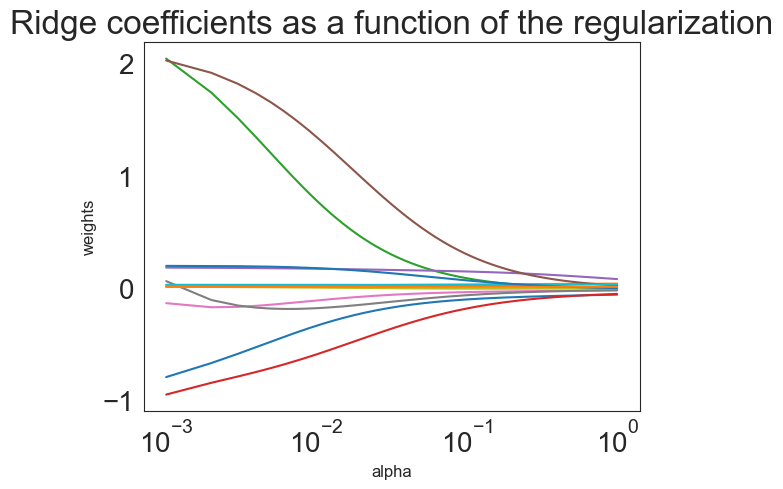

In [928]:
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale("log")
#ax.set_xlim(ax.get_xlim()[::-1])  # reverse axis
plt.xlabel("alpha",fontsize=12)
plt.ylabel("weights",fontsize = 12)
plt.title("Ridge coefficients as a function of the regularization")
plt.axis("tight")
plt.show()

In [930]:
from sklearn.linear_model import Ridge
def ridge_regression(X, Y, alpha, models_to_plot={}):
    #Fit the model
    ridgereg = Ridge(alpha=alpha)
    ridgereg.fit(X,Y)
    y_pred = ridgereg.predict(X)
    
    #Check if a plot is to be made for the entered alpha
    if alpha in models_to_plot:
        plt.subplot(models_to_plot[alpha])
        plt.tight_layout()
        plt.plot(data['x'],y_pred)
        plt.plot(data['x'],data['y'],'.')
        plt.title('Plot for alpha: %.3g'%alpha)
    
    #Return the result in pre-defined format
    rss = sum((y_pred-data['y'])**2)
    ret = [rss]
    ret.extend([ridgereg.intercept_])
    ret.extend(ridgereg.coef_)
    return ret

In [379]:
# predictors=final_features
# alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]
# models_to_plot = {1e-15: 231, 1e-10: 232, 1e-4: 233, 1e-3: 234, 1e-2: 235, 5: 236}
# for i in range(10):
#     coef_matrix_ridge.iloc[i,] = ridge_regression(data, predictors, alpha_ridge[i], models_to_plot)


In [931]:
data = pd.concat([X_final,Y_final], axis=1)
data

,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6,y_std
0,0,0,0.000000,1,0.247558,0.379089,0.000000,0.371574,0.497552,0.497552,0.497552,0,0.007695
1,0,1,0.000000,0,0.243703,0.000000,0.000000,0.000000,0.000000,0.493663,0.000000,1,0.084061
2,0,1,0.000000,1,0.271596,0.375799,0.000000,0.372073,0.521149,0.521149,0.521149,0,-0.011432
3,0,1,0.000000,1,0.240139,0.373395,0.000000,0.371649,0.490039,0.490039,0.490039,0,-0.015277
4,0,1,0.000000,1,0.243059,0.401890,0.000000,0.371899,0.000000,0.493010,0.493010,0,0.046538
...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,0,1,0.000000,0,0.252720,0.000000,0.000000,0.000000,0.000000,0.502713,0.000000,0,0.112008
413,0,1,0.000000,0,0.235449,0.000000,0.000000,0.000000,0.000000,0.485231,0.000000,0,0.077458
414,0,1,0.000000,1,0.275206,0.381604,0.000000,0.372073,0.000000,0.524601,0.524601,0,-0.000488
415,1,0,0.365498,0,0.208157,0.000000,0.371424,0.000000,0.456243,0.456243,0.000000,0,-0.050387


# Model Vallidation 

In [932]:
from sklearn.model_selection import cross_val_score

# Define the Ridge regression model
ridge_model = Ridge()

# Perform cross-validation
cv_scores = cross_val_score(ridge_model, X_final, Y_final, cv=5, scoring='neg_mean_squared_error')

# Convert negative mean squared errors to positive
cv_scores_positive = -cv_scores

# Calculate mean and standard deviation of cross-validation scores
mean_cv_score = cv_scores_positive.mean()
std_cv_score = cv_scores_positive.std()

print("Mean Cross-Validation Score:", mean_cv_score)
print("Standard Deviation of Cross-Validation Scores:", std_cv_score)

Mean Cross-Validation Score: 0.0006546124401912946
Standard Deviation of Cross-Validation Scores: 5.898418208852651e-05


In [933]:
X_final

,x8_3,x3,x1*x8_3,x8_2,x10^2,x1*x8_2,x7*x8_3,x7*x8_2,x10*x9,x10*x4,x10*x8_2,x6
0,0,0,0.000000,1,0.247558,0.379089,0.000000,0.371574,0.497552,0.497552,0.497552,0
1,0,1,0.000000,0,0.243703,0.000000,0.000000,0.000000,0.000000,0.493663,0.000000,1
2,0,1,0.000000,1,0.271596,0.375799,0.000000,0.372073,0.521149,0.521149,0.521149,0
3,0,1,0.000000,1,0.240139,0.373395,0.000000,0.371649,0.490039,0.490039,0.490039,0
4,0,1,0.000000,1,0.243059,0.401890,0.000000,0.371899,0.000000,0.493010,0.493010,0
...,...,...,...,...,...,...,...,...,...,...,...,...
412,0,1,0.000000,0,0.252720,0.000000,0.000000,0.000000,0.000000,0.502713,0.000000,0
413,0,1,0.000000,0,0.235449,0.000000,0.000000,0.000000,0.000000,0.485231,0.000000,0
414,0,1,0.000000,1,0.275206,0.381604,0.000000,0.372073,0.000000,0.524601,0.524601,0
415,1,0,0.365498,0,0.208157,0.000000,0.371424,0.000000,0.456243,0.456243,0.000000,0


In [934]:
model_ridge = Ridge(alpha=0.05)
model_ridge.fit(X_final[final_features],Y_final['y_std'])

Ridge(alpha=0.05)

In [935]:
model_ridge.score(X_final[final_features],Y_final['y_std'])

0.789408660949192

In [472]:
yhat = model.predict(X_final)
#yhat

# ~~~~~~~~~~~~~~~~~~MODEL2~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [127]:
model2_features = train_data[['x1', 'x3', 'x4', 'x7', 'x9', 'x10', 'x8_2', 'x8_3']]
model2_features

,x1,x3,x4,x7,x9,x10,x8_2,x8_3
220,7.731931,0,1,7.578657,1,10.148119,1,0
69,8.294050,1,1,7.590347,0,10.068790,0,0
374,7.664816,1,1,7.588830,1,10.629392,1,0
305,7.615791,1,1,7.580189,1,9.994881,1,0
173,8.196988,1,1,7.585281,0,10.055479,1,0
...,...,...,...,...,...,...,...,...
71,8.265907,1,1,7.596392,0,10.253369,0,0
106,8.165079,1,1,7.590347,0,9.896815,0,0
270,7.783224,1,1,7.588830,0,10.699800,1,0
435,7.454720,0,1,7.575585,1,9.305560,0,1


In [128]:
# Fit simple linear regression model
X_sw2 =  model2_features
Y_sw2 =  y1
X_sw2 = sm.add_constant(X_sw2)
model_sw2 = sm.OLS(Y_sw2, X_sw2).fit()
pred_sw2 = model_sw2.predict(X_sw2)
residuals_sw2 = Y_sw2 - pred_sw2
summary = model_sw2.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                  y_box   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.832
Method:                 Least Squares   F-statistic:                     258.1
Date:                Sat, 20 Apr 2024   Prob (F-statistic):          1.95e-154
Time:                        00:40:38   Log-Likelihood:                 3235.2
No. Observations:                 417   AIC:                            -6452.
Df Residuals:                     408   BIC:                            -6416.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6511      0.006    276.296      0.0

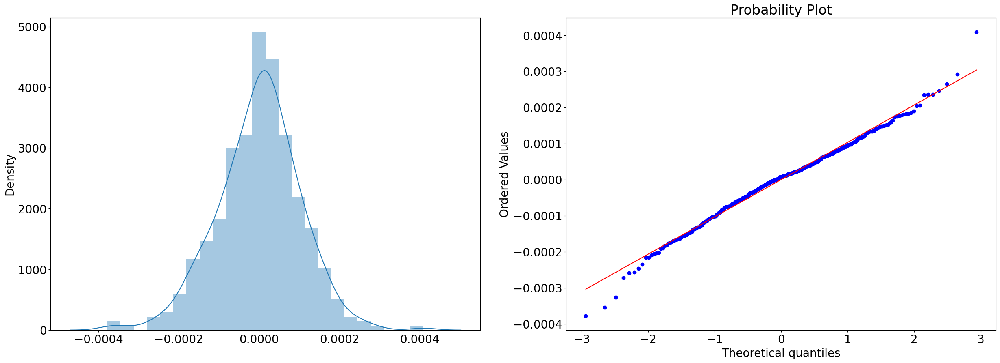

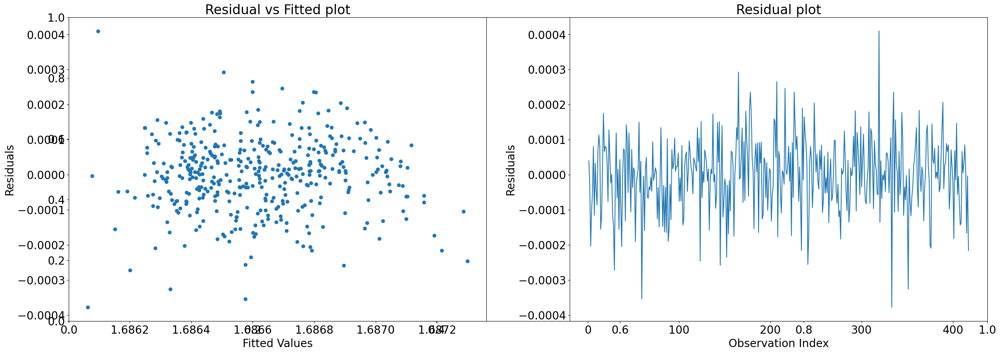

In [129]:
residuals_sw2.index = range(1,418)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_sw2, ax=ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals_sw2, plot=ax2, fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred_sw2, residuals_sw2)  # Assuming pred_sw is defined somewhere
plt.title("Residual vs Fitted plot")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")

plt.subplot(1, 2, 2)
plt.plot(residuals_sw2)
plt.title("Residual plot")
plt.xlabel("Observation Index")
plt.ylabel("Residuals")
plt.show()

# Added variable plot

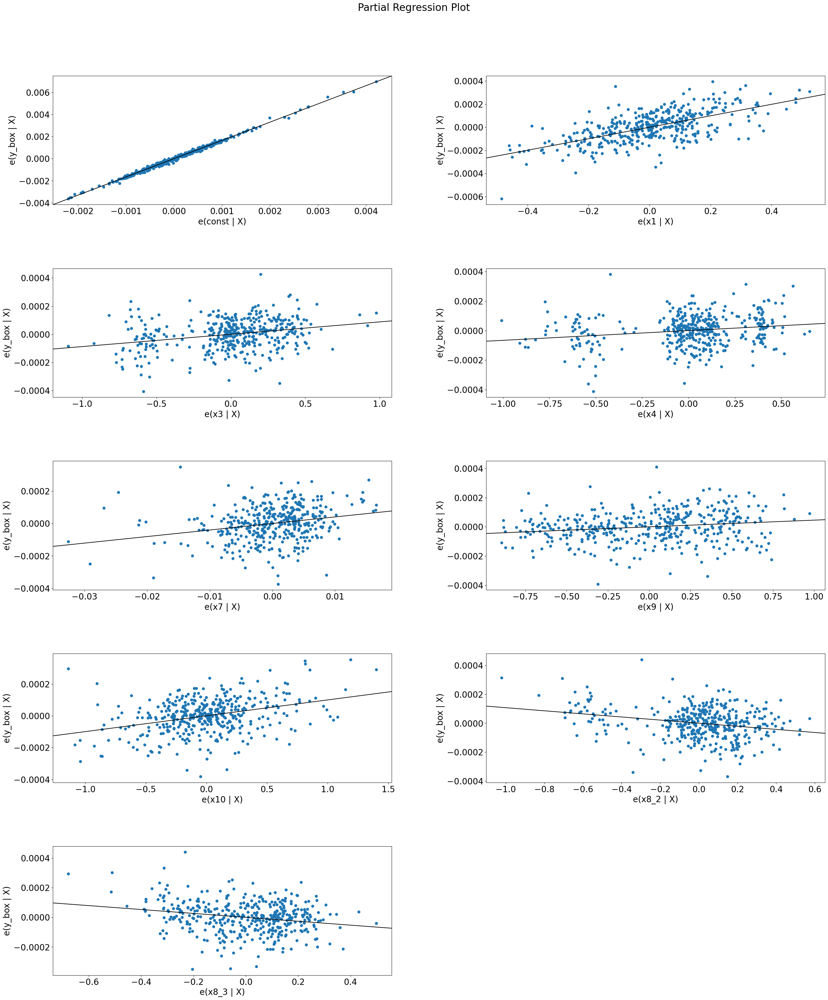

In [130]:
fig = plt.figure(figsize=(30, 35))
sm.graphics.plot_partregress_grid(model_sw2, fig=fig)
fig.tight_layout(pad=5)
plt.show()

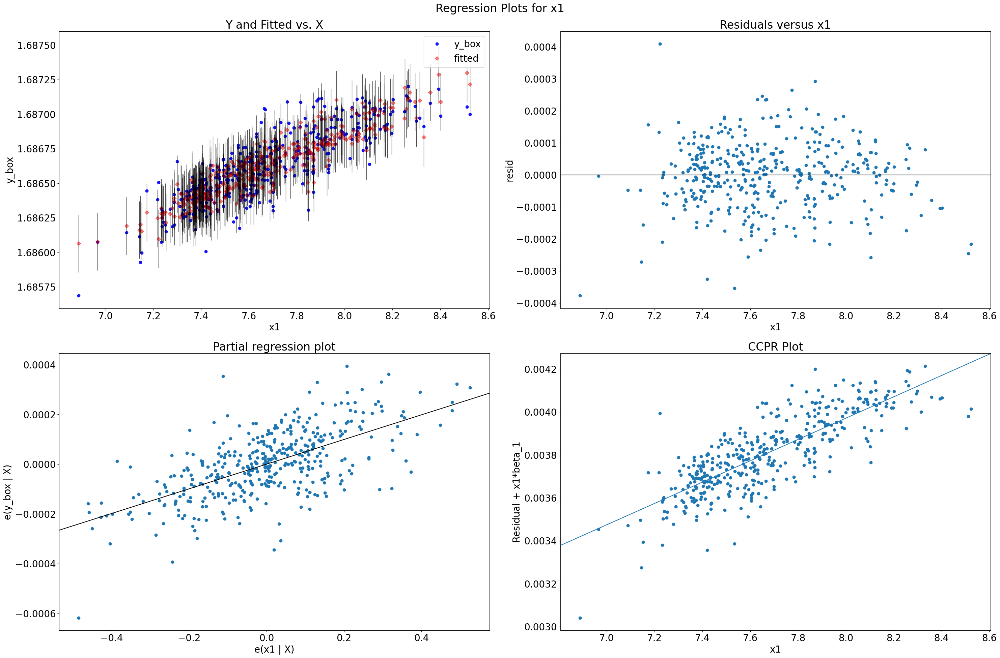

In [131]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '20'
sm.graphics.plot_regress_exog(model_sw2, "x1", fig = fig)
fig.tight_layout(pad=1.0)

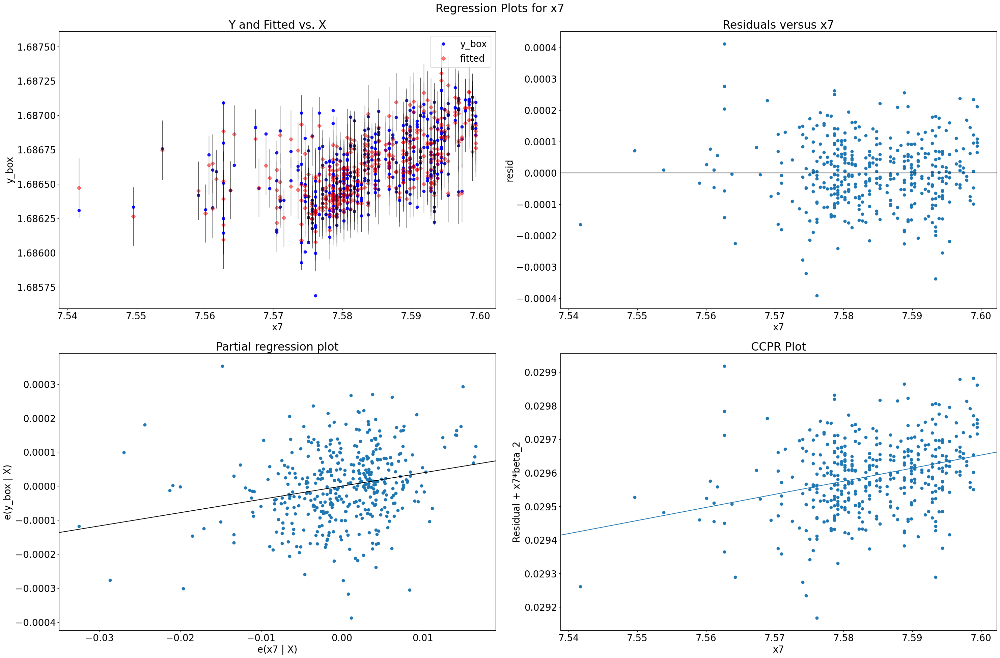

In [132]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '20'
sm.graphics.plot_regress_exog(model_sw, "x7", fig = fig)
fig.tight_layout(pad=1.0)

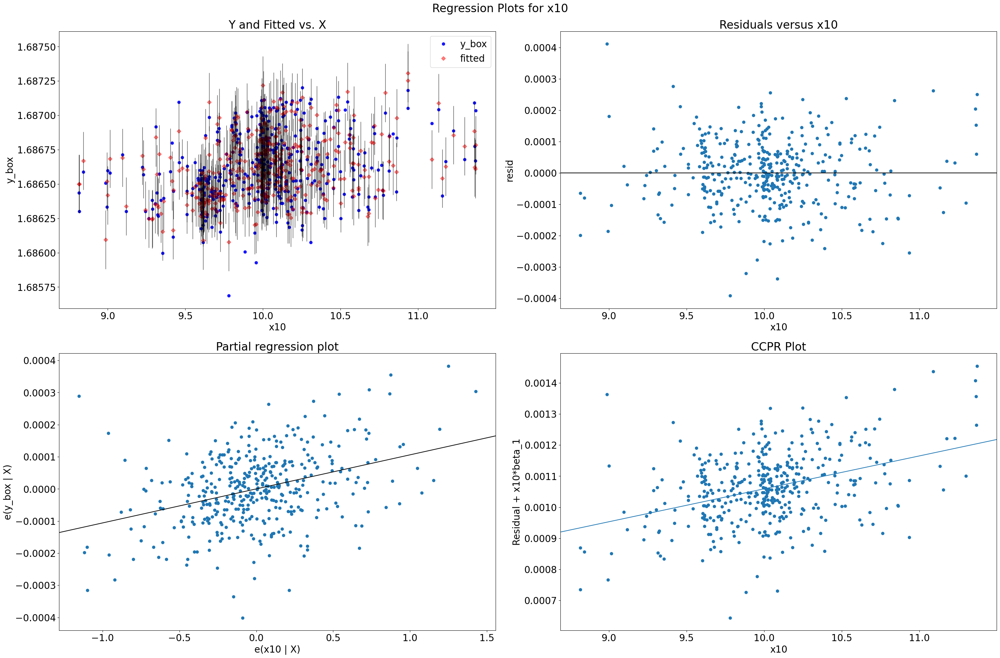

In [133]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '20'
sm.graphics.plot_regress_exog(model_sw, "x10", fig = fig)
fig.tight_layout(pad=1.0)

# Checking for possible interaction terms

In [134]:
final2_X = X_sw2
#final2_X.drop(columns = 'const' , inplace=True)
final2_X

,x1,x3,x4,x7,x9,x10,x8_2,x8_3
220,7.731931,0,1,7.578657,1,10.148119,1,0
69,8.294050,1,1,7.590347,0,10.068790,0,0
374,7.664816,1,1,7.588830,1,10.629392,1,0
305,7.615791,1,1,7.580189,1,9.994881,1,0
173,8.196988,1,1,7.585281,0,10.055479,1,0
...,...,...,...,...,...,...,...,...
71,8.265907,1,1,7.596392,0,10.253369,0,0
106,8.165079,1,1,7.590347,0,9.896815,0,0
270,7.783224,1,1,7.588830,0,10.699800,1,0
435,7.454720,0,1,7.575585,1,9.305560,0,1


In [135]:
for cols in ['x1','x7','x10']:
    final2_X[cols] = final2_X[cols]/np.sqrt(final2_X.shape[0]-1)

In [136]:
final2_standardized = final2_X

In [137]:
final2_standardized

,x1,x3,x4,x7,x9,x10,x8_2,x8_3
220,0.379089,0,1,0.371574,1,0.497552,1,0
69,0.406649,1,1,0.372147,0,0.493663,0,0
374,0.375799,1,1,0.372073,1,0.521149,1,0
305,0.373395,1,1,0.371649,1,0.490039,1,0
173,0.401890,1,1,0.371899,0,0.493010,1,0
...,...,...,...,...,...,...,...,...
71,0.405269,1,1,0.372444,0,0.502713,0,0
106,0.400326,1,1,0.372147,0,0.485231,0,0
270,0.381604,1,1,0.372073,0,0.524601,1,0
435,0.365498,0,1,0.371424,1,0.456243,0,1


In [138]:
import numpy as np

numerical_cols = ['x1', 'x7', 'x10']
categorical_cols = ['x8_3', 'x8_2', 'x4', 'x3', 'x9']

# Adding squared terms for numerical columns
for col in numerical_cols:
    squared_col = f"{col}^2"
    if squared_col not in final2_standardized.columns:
        final2_standardized[squared_col] = np.square(final2_standardized[col])

# Adding interaction terms
for num_col in numerical_cols:
    for cat_col in categorical_cols:
        interaction_col = f"{num_col}*{cat_col}"
        if interaction_col not in final2_standardized.columns:
            # Convert categorical column to numerical representation
            numerical_cat_col = pd.Categorical(final2_standardized[cat_col]).codes
            final2_standardized[interaction_col] = final2_standardized[num_col] * numerical_cat_col

# Adding interaction terms between numerical columns
for col1 in numerical_cols:
    for col2 in numerical_cols:
        if col1 != col2:
            interaction_col = f"{col1}*{col2}"
            if interaction_col not in final2_standardized.columns:
                final2_standardized[interaction_col] = final2_standardized[col1] * final2_standardized[col2]


In [139]:
#final1_standardized.drop(columns='const')
final2_standardized

,x1,x3,x4,x7,x9,x10,x8_2,x8_3,x1^2,x7^2,...,x10*x8_2,x10*x4,x10*x3,x10*x9,x1*x7,x1*x10,x7*x1,x7*x10,x10*x1,x10*x7
220,0.379089,0,1,0.371574,1,0.497552,1,0,0.143709,0.138067,...,0.497552,0.497552,0.000000,0.497552,0.140860,0.188617,0.140860,0.184878,0.188617,0.184878
69,0.406649,1,1,0.372147,0,0.493663,0,0,0.165364,0.138494,...,0.000000,0.493663,0.493663,0.000000,0.151333,0.200748,0.151333,0.183715,0.200748,0.183715
374,0.375799,1,1,0.372073,1,0.521149,1,0,0.141225,0.138438,...,0.521149,0.521149,0.521149,0.521149,0.139824,0.195847,0.139824,0.193905,0.195847,0.193905
305,0.373395,1,1,0.371649,1,0.490039,1,0,0.139424,0.138123,...,0.490039,0.490039,0.490039,0.490039,0.138772,0.182978,0.138772,0.182123,0.182978,0.182123
173,0.401890,1,1,0.371899,0,0.493010,1,0,0.161516,0.138309,...,0.493010,0.493010,0.493010,0.000000,0.149463,0.198136,0.149463,0.183350,0.198136,0.183350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0.405269,1,1,0.372444,0,0.502713,0,0,0.164243,0.138714,...,0.000000,0.502713,0.502713,0.000000,0.150940,0.203734,0.150940,0.187232,0.203734,0.187232
106,0.400326,1,1,0.372147,0,0.485231,0,0,0.160261,0.138494,...,0.000000,0.485231,0.485231,0.000000,0.148980,0.194251,0.148980,0.180578,0.194251,0.180578
270,0.381604,1,1,0.372073,0,0.524601,1,0,0.145622,0.138438,...,0.524601,0.524601,0.524601,0.000000,0.141985,0.200190,0.141985,0.195190,0.200190,0.195190
435,0.365498,0,1,0.371424,1,0.456243,0,1,0.133589,0.137955,...,0.000000,0.456243,0.000000,0.456243,0.135754,0.166756,0.135754,0.169459,0.166756,0.169459


In [140]:
Y_sw2

220    1.686660
69     1.687056
374    1.686560
305    1.686541
173    1.686861
         ...   
71     1.687201
106    1.687022
270    1.686617
435    1.686358
102    1.686999
Name: y_box, Length: 417, dtype: float64

In [141]:
from sklearn.preprocessing import StandardScaler

# Assuming X_sw contains your numerical features
scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X_sw)

Y_std2 = (scaler.fit_transform(pd.DataFrame(Y_sw2))/np.sqrt(len(Y_sw2)-1))
# Assuming Y_stanadrdized contains your standardized target variable
Y_std2 = pd.DataFrame(Y_std2, columns=['y_std2'])
Y_std2

,y_std2
0,0.007695
1,0.084061
2,-0.011432
3,-0.015277
4,0.046538
...,...
412,0.112008
413,0.077458
414,-0.000488
415,-0.050387


In [142]:
# Resetting indices for Y_std and final1_standardized
Y_std2.reset_index(drop=True, inplace=True)
final2_standardized.reset_index(drop=True, inplace=True)

# Fitting the model
model_itr2 = sm.OLS(Y_std2, final2_standardized).fit()
pred_itr2 = model_itr2.predict(final2_standardized)

# Calculating residuals
residuals_itr2 = Y_std2 - pred_itr2  # Use Y_std instead of Y_stanadrdized

# Get summary of the model
summary_itr2 = model_itr2.summary()
print(summary_itr2)

                                 OLS Regression Results                                
Dep. Variable:                 y_std2   R-squared (uncentered):                   0.853
Model:                            OLS   Adj. R-squared (uncentered):              0.842
Method:                 Least Squares   F-statistic:                              77.73
Date:                Sat, 20 Apr 2024   Prob (F-statistic):                   1.51e-142
Time:                        00:41:14   Log-Likelihood:                          1065.7
No. Observations:                 417   AIC:                                     -2073.
Df Residuals:                     388   BIC:                                     -1956.
Df Model:                          29                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [143]:
# Initialize empty lists to store attributes and p-values
attributes = []
p_values = []

# Iterate over each attribute in the final1_standardized columns
for attribute in final2_standardized.columns:
    # Check if the p-value for the attribute is greater than 0.05 and if the attribute is present in X_sw.columns
    if model_itr2.pvalues[attribute] > 0.05 and attribute in X_sw2.columns:
        # Append the attribute name and its p-value to the respective lists
        attributes.append(attribute)
        p_values.append(model_itr2.pvalues[attribute])

# Create a DataFrame from the lists of attributes and p-values
itr_tab = pd.DataFrame({"Attribute": attributes, "p-value": p_values})

In [144]:
itr_tab 

,Attribute,p-value
0,x1,0.143467
1,x3,0.371007
2,x4,0.350379
3,x9,0.290302
4,x10,0.146028
5,x8_2,0.058603
6,x1^2,0.731911
7,x10^2,0.504100
8,x1*x4,0.272232
9,x1*x3,0.540847


In [ ]:
# def stepwise_selection(X, y, 
#                            initial_list=[], 
#                            threshold_in=0.05, 
#                            threshold_out = 0.05, 
#                            verbose=True):
#         """ Perform a forward-backward feature selection 
#         based on p-value from statsmodels.api.OLS
#         Arguments:
#             X - pandas.DataFrame with candidate features
#             y - list-like with the target
#             initial_list - list of features to start with (column names of X)
#             threshold_in - include a feature if its p-value < threshold_in
#             threshold_out - exclude a feature if its p-value > threshold_out
#             verbose - whether to print the sequence of inclusions and exclusions
#         Returns: list of selected features 
#         Always set threshold_in < threshold_out to avoid infinite looping.
#         See https://en.wikipedia.org/wiki/Stepwise_regression for the details
#         """
#         included = list(initial_list)
#         while True:
#             changed=False
#             # forward step
#             excluded = list(set(X.columns)-set(included))
#             new_pval = pd.Series(index=excluded)
#             for new_column in excluded:
#                 model = sm.OLS(y,(pd.DataFrame(X[included+[new_column]]))).fit()
#                 new_pval[new_column] = model.pvalues[new_column]
#             best_pval = new_pval.min()
#             if best_pval < threshold_in:
#                 best_feature = new_pval.idxmin()
#                 included.append(best_feature)
#                 changed=True
#                 if verbose:
#                     print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

#             # backward step
#             model = sm.OLS(y,(pd.DataFrame(X[included]))).fit()
#             # use all coefs except intercept
#             pvalues = model.pvalues.iloc[1:]
#             worst_pval = pvalues.max() # null if pvalues is empty
#             if worst_pval > threshold_out:
#                 changed=True
#                 worst_feature = pvalues.idxmax()
#                 included.remove(worst_feature)
#                 if verbose:
#                     print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
#             if not changed:
#                 break
#         return included

# result = stepwise_selection(final1_standardized, Y_std)

# print('resulting features:')
# print(result)


In [ ]:
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

In [145]:
final_features2 = final2_standardized.columns
## These are the final model features with interaction terms
final_features2

Index(['x1', 'x3', 'x4', 'x7', 'x9', 'x10', 'x8_2', 'x8_3', 'x1^2', 'x7^2',
       'x10^2', 'x1*x8_3', 'x1*x8_2', 'x1*x4', 'x1*x3', 'x1*x9', 'x7*x8_3',
       'x7*x8_2', 'x7*x4', 'x7*x3', 'x7*x9', 'x10*x8_3', 'x10*x8_2', 'x10*x4',
       'x10*x3', 'x10*x9', 'x1*x7', 'x1*x10', 'x7*x1', 'x7*x10', 'x10*x1',
       'x10*x7'],
      dtype='object')

In [146]:
model_itr2_2 = sm.OLS(Y_std2, final2_standardized[final_features2]).fit()
summary_itr2_2 = model_itr2_2.summary()
print(summary_itr2_2)

                                 OLS Regression Results                                
Dep. Variable:                 y_std2   R-squared (uncentered):                   0.853
Model:                            OLS   Adj. R-squared (uncentered):              0.842
Method:                 Least Squares   F-statistic:                              77.73
Date:                Sat, 20 Apr 2024   Prob (F-statistic):                   1.51e-142
Time:                        00:41:17   Log-Likelihood:                          1065.7
No. Observations:                 417   AIC:                                     -2073.
Df Residuals:                     388   BIC:                                     -1956.
Df Model:                          29                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [147]:
pred_itr2_2 = model_itr2_2.predict(final2_standardized[final_features2])
pd.DataFrame(pred_itr2)

,0
0,-0.000222
1,0.075608
2,0.032272
3,0.002680
4,0.057077
...,...
412,0.080947
413,0.071907
414,0.036348
415,-0.045636


In [148]:
np.array(Y_std2)

array([[ 7.69474887e-03],
       [ 8.40613222e-02],
       [-1.14318025e-02],
       [-1.52766732e-02],
       [ 4.65377762e-02],
       [-1.02389662e-02],
       [-1.65108153e-02],
       [ 3.84446801e-02],
       [ 4.77682225e-02],
       [ 1.19344999e-02],
       [ 1.10116603e-02],
       [ 4.25465948e-02],
       [ 5.61008486e-02],
       [-1.20046301e-01],
       [ 1.14744987e-02],
       [-2.56452929e-02],
       [ 9.60583447e-03],
       [ 2.64433740e-02],
       [-1.20501883e-02],
       [-1.84964518e-02],
       [-2.91649941e-02],
       [ 3.19576901e-03],
       [ 9.46123290e-02],
       [-2.91649941e-02],
       [ 2.82571157e-02],
       [-3.70539757e-02],
       [-2.19107916e-02],
       [ 1.92598538e-03],
       [-1.33158443e-01],
       [-1.25482044e-02],
       [-2.69259679e-02],
       [-7.48005705e-02],
       [ 1.89305539e-02],
       [-4.48648932e-02],
       [-3.31034763e-02],
       [-8.35565632e-02],
       [-7.25660904e-03],
       [ 1.23916921e-02],
       [ 4.8

In [149]:
# Assuming Y_std is a DataFrame or Series and model_itr2.predict() returns a 1D array

# Convert the predicted values to a DataFrame or Series for easier handling
predictions_model2 = pd.Series(model_itr2_2.predict(final2_standardized[final_features2]))

# Ensure the shapes are consistent for subtraction
if isinstance(Y_std2, pd.DataFrame):
    m = np.array(Y_std2.iloc[:, 0]) - np.array(predictions_model2)
elif isinstance(Y_std2, pd.Series):
    m = np.array(Y_std2) - np.array(predictions_model2)
else:
    raise ValueError("Unsupported data type for Y_std. Must be DataFrame or Series.")

# Create a DataFrame from the residuals
residuals_df_model2 = pd.DataFrame(m)
residuals_itr2_model2 =residuals_df_model2

In [150]:
pred_itr2_2=pd.DataFrame(pred_itr2_2)
pred_itr2_2

residuals_itr2_model2

,0
0,0.007916
1,0.008453
2,-0.043704
3,-0.017957
4,-0.010539
...,...
412,0.031061
413,0.005551
414,-0.036836
415,-0.004751


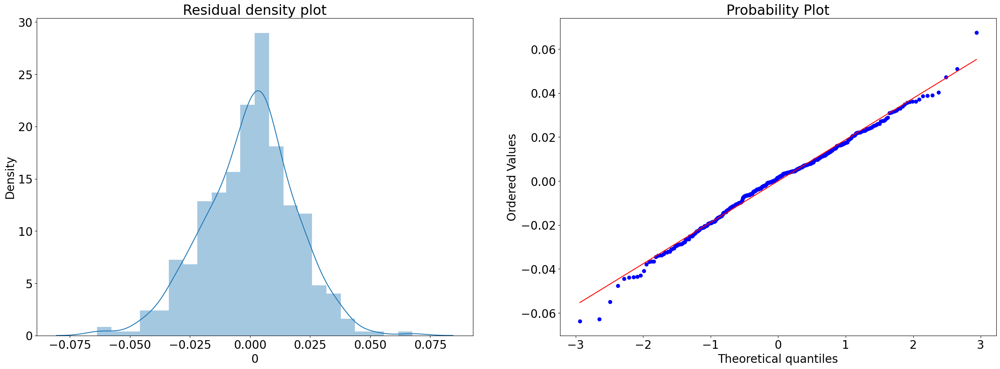

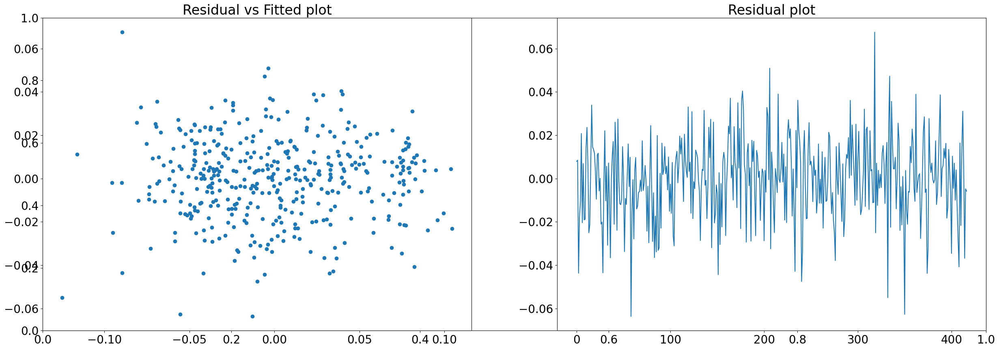

In [151]:
import scipy.stats as stats

# Assuming residuals_itr2 is a DataFrame or Series
if isinstance(residuals_itr2_model2, pd.DataFrame):
    residuals_itr2_model2 = residuals_itr2_model2.iloc[:, 0]  # Extracting the first column if it's a DataFrame
elif not isinstance(residuals_itr2_model2, pd.Series):
    raise ValueError("residuals_itr2 must be a DataFrame or Series.")

# Plotting the Q-Q plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_itr2_model2, ax=ax1)
ax1.set_title("Residual density plot")

stats.probplot(residuals_itr2_model2, plot=ax2, fit=True)
plt.show()

# Plotting Residual vs Fitted and Residual plot
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'

plt.subplot(1, 2, 1)
plt.scatter(pred_itr2_2, residuals_itr2_model2)
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals_itr2_model2)
plt.title("Residual plot")
plt.show()

# OUTLIER DETECTION

In [152]:
import itertools
from itertools import chain, combinations
import statsmodels.formula.api as sm
import scipy.stats as scipystats
import statsmodels.api as sm
import statsmodels.stats.stattools as stools
import statsmodels.stats as stats 
from statsmodels.graphics.regressionplots import *
import copy
from sklearn.model_selection import train_test_split
import math
import time

In [153]:
## Hat matrix diagonal entries
final_model2 = model_itr2_2
influence_m2 = final_model2.get_influence()
h_ii_m2 = pd.Series(influence_m2.hat_matrix_diag)

In [154]:
influence_m2 = model_itr2_2.get_influence()
inf_sum_m2 = influence_m2.summary_frame()
inf_sum_m2 = pd.DataFrame(inf_sum_m2)

In [155]:
inf_sum_m2

,dfb_x1,dfb_x3,dfb_x4,dfb_x7,dfb_x9,dfb_x10,dfb_x8_2,dfb_x8_3,dfb_x1^2,dfb_x7^2,...,dfb_x7*x1,dfb_x7*x10,dfb_x10*x1,dfb_x10*x7,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
0,0.010932,-0.028321,-0.000534,-0.012898,0.020384,0.007067,0.005316,-0.008679,-0.000553,0.012778,...,-0.010892,-0.006631,-0.000850,-0.006631,0.000220,0.414655,0.039254,0.083816,0.414212,0.083726
1,0.015680,0.000240,0.003329,-0.013241,-0.001394,0.001551,-0.023450,-0.010445,-0.003547,0.012897,...,-0.015225,-0.001104,-0.007256,-0.001104,0.000380,0.446988,0.057320,0.110221,0.446526,0.110107
2,-0.024004,0.063885,0.055054,-0.034380,0.131930,0.082418,0.048719,0.000406,0.031013,0.036303,...,0.020663,-0.083640,0.051721,-0.083640,0.008078,-2.298086,0.046664,-0.508433,-2.310904,-0.511269
3,0.029550,-0.046904,0.012479,-0.032124,-0.025505,0.011574,-0.016324,0.001859,0.015865,0.032700,...,-0.030414,-0.011464,-0.014804,-0.011464,0.000658,-0.933001,0.023633,-0.145155,-0.932845,-0.145130
4,-0.004738,0.003165,-0.003352,0.000792,0.010546,0.005792,-0.002370,0.000316,-0.056253,-0.001973,...,0.007816,-0.006751,0.015776,-0.006751,0.000432,-0.553161,0.043220,-0.117567,-0.552665,-0.117462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,0.003426,0.008633,0.008294,-0.051573,0.051483,0.062589,0.136847,0.090046,-0.050372,0.049346,...,0.000619,-0.061407,-0.017016,-0.061407,0.004666,1.638430,0.052686,0.386391,1.642008,0.387235
413,0.006807,0.000838,-0.001756,-0.000235,0.002926,-0.006915,-0.023108,-0.013438,-0.011879,0.000016,...,-0.006229,0.006782,0.003773,0.006782,0.000141,0.292413,0.050233,0.067249,0.292068,0.067169
414,-0.081198,0.029650,0.045719,0.031380,-0.075554,0.070429,0.000342,0.000375,0.101024,-0.028200,...,0.073453,-0.069792,0.095532,-0.069792,0.006443,-1.942220,0.051827,-0.454081,-1.949214,-0.455716
415,-0.011498,-0.000068,-0.007348,0.000528,-0.011779,0.018782,-0.002972,-0.012752,0.000502,-0.000325,...,0.011225,-0.019020,0.013892,-0.019020,0.000143,-0.252496,0.066754,-0.067530,-0.252191,-0.067448


In [156]:
student_resid_m2 = influence_m2.resid_studentized_external
(cooks, p) = influence_m2.cooks_distance
(dffits, p) = influence_m2.dffits
leverage = influence_m2.hat_matrix_diag

In [161]:
inf_sum_m2 = inf_sum_m2[['standard_resid', 'student_resid', 'hat_diag', 'cooks_d', 'dffits_internal', 'dffits']]
inf_sum_m2

,standard_resid,student_resid,hat_diag,cooks_d,dffits_internal,dffits
0,0.414655,0.414212,0.039254,0.000220,0.083816,0.083726
1,0.446988,0.446526,0.057320,0.000380,0.110221,0.110107
2,-2.298086,-2.310904,0.046664,0.008078,-0.508433,-0.511269
3,-0.933001,-0.932845,0.023633,0.000658,-0.145155,-0.145130
4,-0.553161,-0.552665,0.043220,0.000432,-0.117567,-0.117462
...,...,...,...,...,...,...
412,1.638430,1.642008,0.052686,0.004666,0.386391,0.387235
413,0.292413,0.292068,0.050233,0.000141,0.067249,0.067169
414,-1.942220,-1.949214,0.051827,0.006443,-0.454081,-0.455716
415,-0.252496,-0.252191,0.066754,0.000143,-0.067530,-0.067448


In [162]:
inf_sum_m2['y2'] = (Y_std2)
inf_sum_m2

,standard_resid,student_resid,hat_diag,cooks_d,dffits_internal,dffits,y2
0,0.414655,0.414212,0.039254,0.000220,0.083816,0.083726,0.007695
1,0.446988,0.446526,0.057320,0.000380,0.110221,0.110107,0.084061
2,-2.298086,-2.310904,0.046664,0.008078,-0.508433,-0.511269,-0.011432
3,-0.933001,-0.932845,0.023633,0.000658,-0.145155,-0.145130,-0.015277
4,-0.553161,-0.552665,0.043220,0.000432,-0.117567,-0.117462,0.046538
...,...,...,...,...,...,...,...
412,1.638430,1.642008,0.052686,0.004666,0.386391,0.387235,0.112008
413,0.292413,0.292068,0.050233,0.000141,0.067249,0.067169,0.077458
414,-1.942220,-1.949214,0.051827,0.006443,-0.454081,-0.455716,-0.000488
415,-0.252496,-0.252191,0.066754,0.000143,-0.067530,-0.067448,-0.050387


Text(0, 0.5, 'Studentized Residuals')

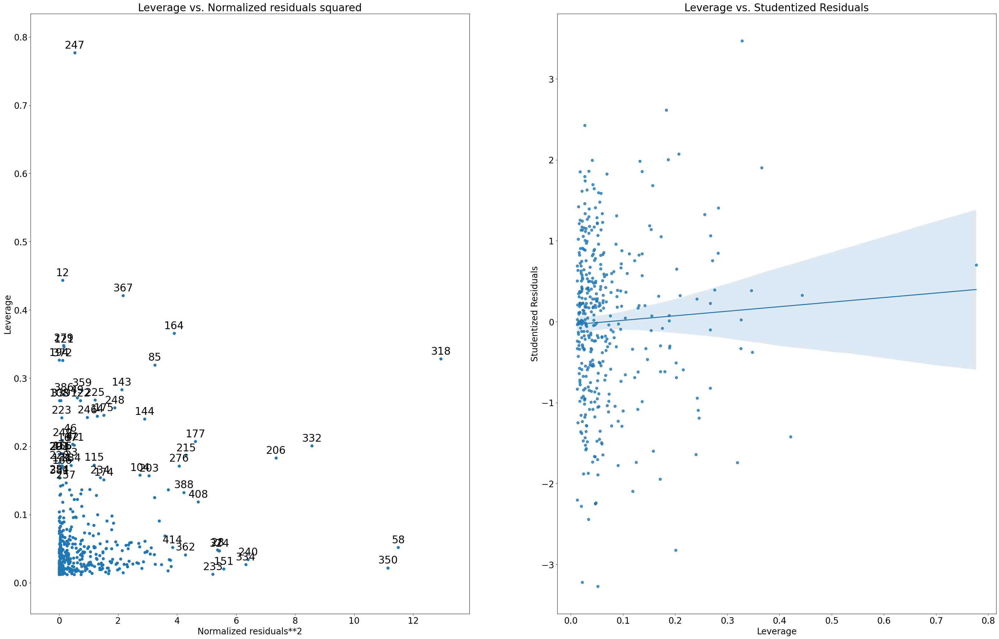

In [163]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 25))
plt.rcParams['font.size'] = '20'
plt.rc('axes', labelsize = 40)
plot_leverage_resid2(final_model2, ax=ax1)

plt.rcParams['font.size'] = '20'
sns.regplot(x=leverage, y=final_model2.resid_pearson, ax=ax2)
plt.title('Leverage vs. Studentized Residuals')
plt.xlabel('Leverage')
plt.ylabel('Studentized Residuals')

In [164]:
r = inf_sum_m2.student_resid
print ('-'*30 + ' studentized residual ' + '-'*30)
print (r.describe())
print ('\n')

r_sort = inf_sum_m2.sort_values(by = 'student_resid')
print ('-'*20 + ' top 5 most negative stundentized residuals ' + '-'*20)
print (r_sort['student_resid'].head())
print ('\n')

print ('-'*20 + ' top 5 most positive studentized residuals ' + '-'*20)
print (r_sort['student_resid'].tail())

------------------------------ studentized residual ------------------------------
count    417.000000
mean       0.003324
std        1.020278
min       -3.404061
25%       -0.607641
50%        0.084580
75%        0.612619
max        4.328185
Name: student_resid, dtype: float64


-------------------- top 5 most negative stundentized residuals --------------------
58    -3.404061
350   -3.297471
332   -3.196144
240   -2.500639
374   -2.315572
Name: student_resid, dtype: float64


-------------------- top 5 most positive studentized residuals --------------------
177    2.342750
164    2.405283
334    2.475126
206    2.920702
318    4.328185
Name: student_resid, dtype: float64


In [166]:
## printing y values which is outlier

print (inf_sum_m2.y2[abs(r) > 2])

2     -0.011432
28    -0.133158
58    -0.076741
85    -0.035421
151   -0.050293
164    0.034401
177    0.079713
206    0.047197
215    0.061923
233   -0.008407
236    0.007203
240   -0.057656
276   -0.061286
318   -0.021911
332   -0.179878
334    0.041508
350   -0.118280
362    0.078947
374   -0.085527
388    0.067296
408    0.041508
Name: y2, dtype: float64


In [169]:
#Identify high leverage
#point with leverage = (2k+2)/n 
#k = number of predictors (11)
#n = number of observations (506)
# ((2*12)+2)/264 = 0.09848 any numbner higher than this is high leverage
thres_hii_m2= 2*(len(final_features2)+1)/len(inf_sum_m2.y2)
inf_hii_m2 = pd.DataFrame(inf_sum_m2[['y2', 'hat_diag']][abs(inf_sum_m2.hat_diag) > thres_hii_m2])
inf_hii_m2

,y2,hat_diag
12,0.056101,0.443326
14,0.011474,0.244122
42,0.020579,0.203002
46,-0.033896,0.215314
49,0.026443,0.271387
53,-0.061656,0.179999
85,-0.035421,0.319336
108,-0.091658,0.266969
115,0.076575,0.172669
121,0.076575,0.346222


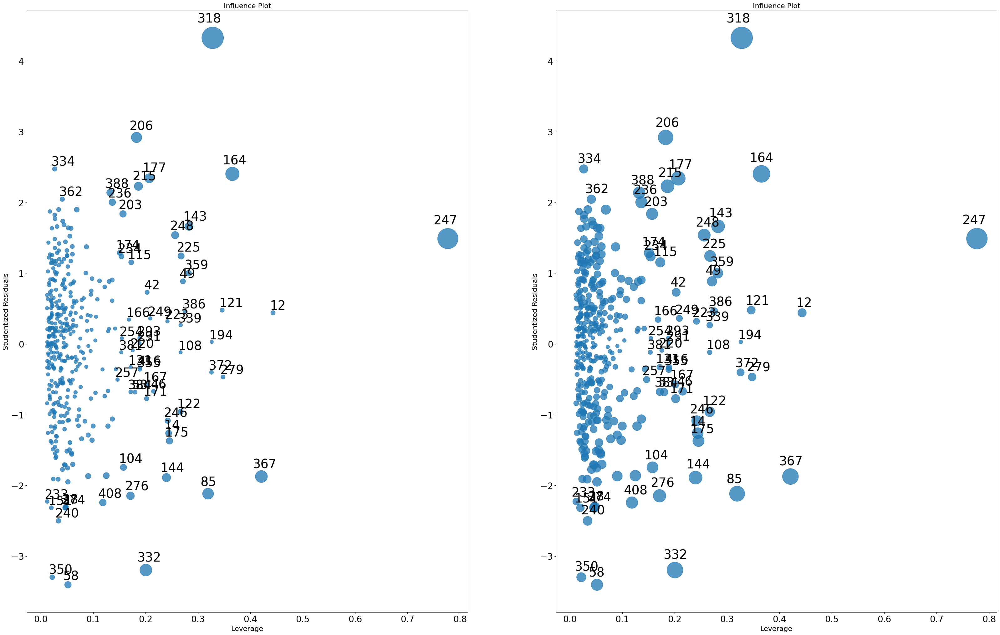

In [170]:
#Plot influential observations by cooks distance
#Use residual squared to restrict the graph but preserve the relative position of observations

from statsmodels.graphics.regressionplots import *
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 25))
plt.rcParams['font.size'] = '20'
plt.rc('figure', titlesize = 30)
influence_plot(final_model2, ax=ax1, size=50)


plt.rcParams['font.size'] = '20'
influence_plot(final_model2, ax=ax2, size=50, criterion='DFFITS')
plt.show()

In [172]:
## Influential cases by DFFITS
thres_dfts_m2 = 2*math.sqrt((len(final_features2)+1)/len(inf_sum_m2.y2))
inf_dffits_m2 = pd.DataFrame(inf_sum_m2[['y2','dffits']][abs(inf_sum_m2.dffits) > thres_dfts_m2])
inf_dffits_m2  

,y2,dffits
14,0.011474,-0.716443
58,-0.076741,-0.796683
85,-0.035421,-1.449916
104,-0.039558,-0.755022
122,0.083375,-0.578518
143,0.029739,1.045236
144,0.003452,-1.061470
164,0.034401,1.826600
175,0.081211,-0.781759
177,0.079713,1.197259


Text(0.5, 1.0, 'Index Influece plot - DFFITS')

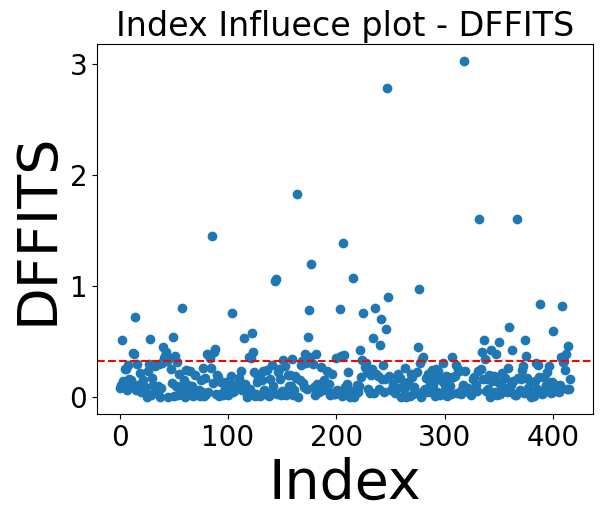

In [173]:
thres_dfts_m2=0.3248
plt.scatter(x= range(0,len(inf_sum_m2.y2)), y = abs(inf_sum_m2.dffits))
plt.axhline(y = thres_dfts_m2, color = 'r', linestyle = '--')
plt.rcParams['font.size'] = '20'
plt.xlabel("Index")
plt.ylabel("DFFITS")
plt.title("Index Influece plot - DFFITS")

In [174]:

import scipy
thres_cooks_m2 = 3*inf_sum_m2.cooks_d.mean()
inf_cooks_m2=pd.DataFrame((inf_sum_m2[['y2', 'cooks_d']][abs(inf_sum_m2.cooks_d) > thres_cooks_m2]))
inf_cooks_m2

,y2,cooks_d
14,0.011474,0.016016
58,-0.076741,0.019308
85,-0.035421,0.065111
104,-0.039558,0.017721
143,0.029739,0.033986
144,0.003452,0.034978
164,0.034401,0.102994
175,0.081211,0.019055
177,0.079713,0.044282
203,-0.004351,0.019577


Text(0.5, 1.0, 'Index Influence plot')

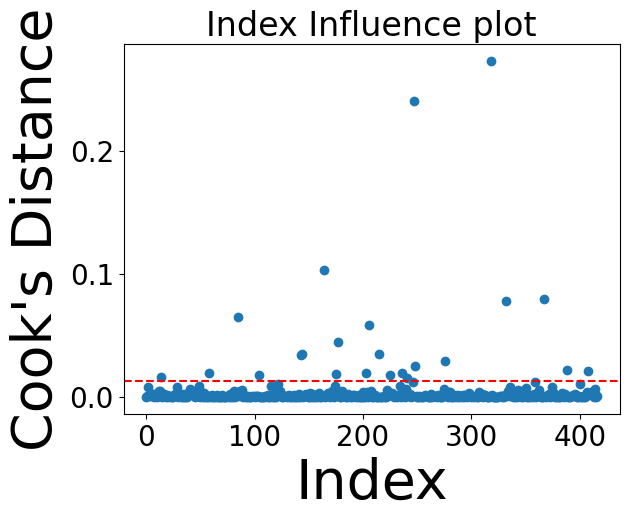

In [175]:
plt.scatter(x= range(0,len(inf_sum_m2.y2)), y = inf_sum_m2.cooks_d)
plt.axhline(y = thres_cooks_m2, color = 'r', linestyle = '--')
plt.rcParams['font.size'] = '20'
plt.xlabel("Index")
plt.ylabel("Cook's Distance")
plt.title("Index Influence plot")

# Removing outliers

In [177]:
X_final_m2 = final2_standardized.drop(list(inf_cooks_m2.index), inplace= False)
X_final_m2

,x1,x3,x4,x7,x9,x10,x8_2,x8_3,x1^2,x7^2,...,x10*x8_2,x10*x4,x10*x3,x10*x9,x1*x7,x1*x10,x7*x1,x7*x10,x10*x1,x10*x7
0,0.379089,0,1,0.371574,1,0.497552,1,0,0.143709,0.138067,...,0.497552,0.497552,0.000000,0.497552,0.140860,0.188617,0.140860,0.184878,0.188617,0.184878
1,0.406649,1,1,0.372147,0,0.493663,0,0,0.165364,0.138494,...,0.000000,0.493663,0.493663,0.000000,0.151333,0.200748,0.151333,0.183715,0.200748,0.183715
2,0.375799,1,1,0.372073,1,0.521149,1,0,0.141225,0.138438,...,0.521149,0.521149,0.521149,0.521149,0.139824,0.195847,0.139824,0.193905,0.195847,0.193905
3,0.373395,1,1,0.371649,1,0.490039,1,0,0.139424,0.138123,...,0.490039,0.490039,0.490039,0.490039,0.138772,0.182978,0.138772,0.182123,0.182978,0.182123
4,0.401890,1,1,0.371899,0,0.493010,1,0,0.161516,0.138309,...,0.493010,0.493010,0.493010,0.000000,0.149463,0.198136,0.149463,0.183350,0.198136,0.183350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,0.405269,1,1,0.372444,0,0.502713,0,0,0.164243,0.138714,...,0.000000,0.502713,0.502713,0.000000,0.150940,0.203734,0.150940,0.187232,0.203734,0.187232
413,0.400326,1,1,0.372147,0,0.485231,0,0,0.160261,0.138494,...,0.000000,0.485231,0.485231,0.000000,0.148980,0.194251,0.148980,0.180578,0.194251,0.180578
414,0.381604,1,1,0.372073,0,0.524601,1,0,0.145622,0.138438,...,0.524601,0.524601,0.524601,0.000000,0.141985,0.200190,0.141985,0.195190,0.200190,0.195190
415,0.365498,0,1,0.371424,1,0.456243,0,1,0.133589,0.137955,...,0.000000,0.456243,0.000000,0.456243,0.135754,0.166756,0.135754,0.169459,0.166756,0.169459


In [178]:
Y_final_m2 = pd.DataFrame(Y_std2)
Y_final_m2

,y_std2
0,0.007695
1,0.084061
2,-0.011432
3,-0.015277
4,0.046538
...,...
412,0.112008
413,0.077458
414,-0.000488
415,-0.050387


In [179]:
Y_final_m2.drop(list(inf_cooks_m2.index) , inplace = True)
Y_final_m2

,y_std2
0,0.007695
1,0.084061
2,-0.011432
3,-0.015277
4,0.046538
...,...
412,0.112008
413,0.077458
414,-0.000488
415,-0.050387


# Building the Final Model

In [180]:
model_final2 = sm.OLS(Y_final_m2['y_std2'], X_final_m2[final_features2]).fit()
pred_final2 = model_final2.predict(X_final_m2[final_features2])
residuals_final2 = Y_final_m2['y_std2'] - model_final2.predict(X_final_m2[final_features2])
summary_final2 = model_final2.summary()
print(summary_final2)

                                 OLS Regression Results                                
Dep. Variable:                 y_std2   R-squared (uncentered):                   0.880
Model:                            OLS   Adj. R-squared (uncentered):              0.871
Method:                 Least Squares   F-statistic:                              92.40
Date:                Sat, 20 Apr 2024   Prob (F-statistic):                   3.32e-149
Time:                        00:52:58   Log-Likelihood:                          1055.8
No. Observations:                 394   AIC:                                     -2054.
Df Residuals:                     365   BIC:                                     -1938.
Df Model:                          29                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

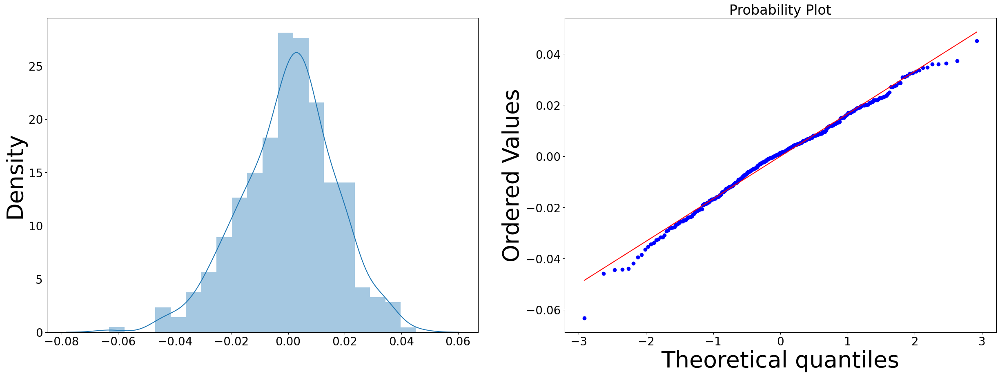

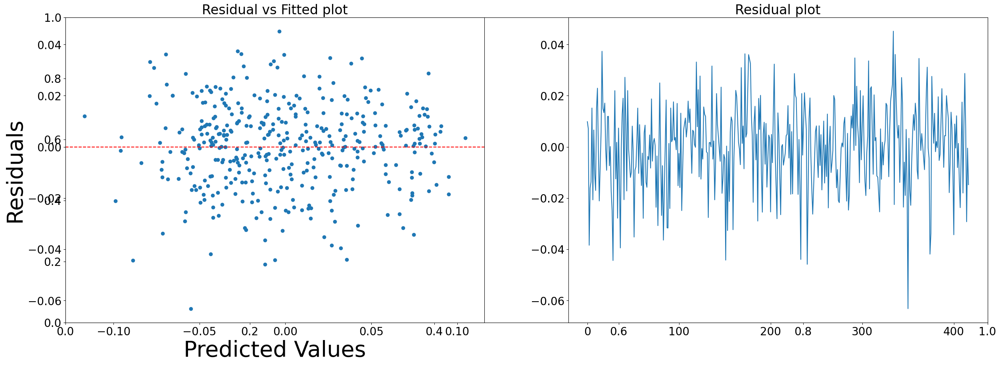

In [181]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
#plt.rcParams['font.size'] = '20'
sns.distplot(residuals_final2, ax = ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals_final2,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
#plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred_final2,residuals_final2)
plt.title("Residual vs Fitted plot")
# Draw a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")


plt.subplot(1, 2, 2)
plt.plot(residuals_final2)
plt.title("Residual plot")
plt.show()

# Multicollinearity Detection

In [183]:
# Function to calculate VIF
def calculate_vif(data):
    vif_df = pd.DataFrame(columns = ['Var', 'Vif'])
    x_var_names = data.columns
    for i in range(0, x_var_names.shape[0]):
        y = data[x_var_names[i]]
        x = data[x_var_names.drop([x_var_names[i]])]
        r_squared = sm.OLS(y,x).fit().rsquared
        vif = round(1/(1-r_squared),2)
        vif_df.loc[i] = [x_var_names[i], vif]
    return vif_df.sort_values(by = 'Vif', axis = 0, ascending=False, inplace=False)

lm2 = sm.OLS(Y_final_m2['y_std2'], X_final_m2[final_features2]).fit()
calculate_vif(X_final_m2[final_features2])

,Var,Vif
31,x10*x7,inf
30,x10*x1,inf
29,x7*x10,inf
28,x7*x1,inf
27,x1*x10,inf
26,x1*x7,inf
3,x7,3.674680e+09
9,x7^2,3.611624e+09
0,x1,2.574957e+09
5,x10,1.896734e+09


In [189]:
vif_df = pd.DataFrame(calculate_vif(X_final_m2[final_features2]))
vif_df

,Var,Vif
31,x10*x7,inf
30,x10*x1,inf
29,x7*x10,inf
28,x7*x1,inf
27,x1*x10,inf
26,x1*x7,inf
3,x7,3.674680e+09
9,x7^2,3.611624e+09
0,x1,2.574957e+09
5,x10,1.896734e+09


In [185]:
# Assuming you have your VIF values stored in a DataFrame named vif_df with columns 'Var' and 'Vif'
# Example:
# vif_df = your_dataframe_containing_vif_values

# Set a threshold for high VIF values
threshold = 10

# Filter out variables with VIF values above the threshold
high_vif_variables = vif_df[vif_df['Vif'] > threshold]['Var'].tolist()

# Print the variables with high VIF values
print("Variables with high VIF values:")
print(high_vif_variables)

Variables with high VIF values:
['x10*x7', 'x10*x1', 'x7*x10', 'x7*x1', 'x1*x10', 'x1*x7', 'x7', 'x7^2', 'x1', 'x10', 'x8_2', 'x8_3', 'x7*x8_2', 'x7*x8_3', 'x4', 'x7*x4', 'x7*x3', 'x3', 'x9', 'x7*x9', 'x1^2', 'x10^2', 'x1*x8_3', 'x1*x8_2', 'x10*x8_3', 'x10*x8_2', 'x1*x4', 'x1*x3', 'x10*x4', 'x1*x9', 'x10*x3', 'x10*x9']


In [187]:
df=X_final_m2.drop(columns=high_vif_variables)

In [188]:
df

""
0
1
2
3
4
...
412
413
414
415
